In [1]:
%cd C:/Users/Dell/Desktop/pfa/CA-Net-master

C:\Users\Dell\Desktop\pfa\CA-Net-master


In [2]:
"""import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))"""

"import tensorflow as tf\nprint(tf.config.list_physical_devices('GPU'))"

## Read and sort data

In [2]:
import os
import cv2

def resize_bmp_images(directory,resized_directory,target_height=224, target_width=300):
    # Create a new directory for resized images
    
    os.makedirs(resized_directory, exist_ok=True)
    
    # Loop through the directory
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)
        # Check if the file is a BMP image
        if os.path.isfile(filepath) and filepath.endswith(('.BMP','.bmp')):
            # Read the image
            image = cv2.imread(filepath)
            # Resize the image
            resized_image = cv2.resize(image, (target_width, target_height))
            # Save the resized image to the new directory
            resized_filepath = os.path.join(resized_directory, filename)
            cv2.imwrite(resized_filepath, resized_image)
#resize_bmp_images('C:/Users/Dell/Desktop/pfa/Dataset_public/Images','C:/Users/Dell/Desktop/pfa/Dataset_public/resized_images')
resize_bmp_images('C:/Users/Dell/Desktop/pfa/Dataset_public/GT_ICM/GT_ICM','C:/Users/Dell/Desktop/pfa/Dataset_public/resized_GT_ICM')

In [3]:
import os
import random
import numpy as np

#from skimage import io
from PIL import Image
import glob

import torch
import torch.nn as nn

root_dir = r'C:\\Users\\Dell\\Desktop\\pfa'


filenames=sorted(glob.glob(os.path.join(root_dir,"Dataset_public/resized_images", "*.BMP")))
masknames=sorted(glob.glob(os.path.join(root_dir,"Dataset_public/resized_GT_ICM", "*.BMP")))

npy_data_dir = os.path.join(root_dir,'IcmNpyDataFromResizedImages')

import os
from random import shuffle

npy_img_path = os.path.join(npy_data_dir,'image')
splitted_data_path = os.path.join(root_dir,'splitted_data_lists_icm')

In [4]:
print(len(filenames))
print(len(masknames))

248
248


## Transform data into .npy format

In [5]:
import os
import numpy as np
from PIL import Image

if not os.path.isdir(npy_data_dir):
    print("Creating {} folder...".format(npy_data_dir))
    os.makedirs(npy_data_dir+'/image')
    os.makedirs(npy_data_dir+'/label')
    success_count = 0
    for i in range(len(filenames)):
        print(i)
        try:
            fname = filenames[i].rsplit('\\', maxsplit=1)[-1].split('.BMP')[0]
            lname = masknames[i].rsplit('\\', maxsplit=1)[-1].split('.bmp')[0]

            image = Image.open(filenames[i]).convert('L')
            label = Image.open(masknames[i]).convert('L')

            
            image=np.expand_dims(image,axis=-1)
            
            label=np.expand_dims(label,axis=-1)

            image = np.array(image)
            label = np.array(label)

            images_img_filename = os.path.join(npy_data_dir, 'image', fname)
            labels_img_filename = os.path.join(npy_data_dir, 'label', lname)

            np.save(images_img_filename, image)
            np.save(labels_img_filename, label)

            success_count += 1
        except Exception as e:
            print("Error with image", i, ":", str(e))

    print('Successfully saved preprocessed data in .npy format for', success_count, 'images.')

else:
    print("{} exists already!".format(npy_data_dir)) 



Creating C:\\Users\\Dell\\Desktop\\pfa\IcmNpyDataFromResizedImages folder...
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
Successfully saved preprocessed data in .

## Split data and save the names in txt files (for faster loading)

In [6]:
import os
from random import shuffle

def create_data_splits(folder, save_folder):
    file_list = os.listdir(folder)
    file_list = [os.path.join(folder, file_name) for file_name in file_list]
    shuffle(file_list)


    train_split = file_list[:int(0.8*len(file_list))]  # 80% des données pour l'ensemble d'entraînement
    print(len(train_split))
    valid_split = file_list[int(0.8*len(file_list)):int(0.9*len(file_list))]  # 10% pour l'ensemble de validation
    print(len(valid_split))
    test_split = file_list[int(0.9*len(file_list)):]  # 10% pour l'ensemble de test
    print(len(test_split))

    # Création du dossier save_folder s'il n'existe pas déjà
    if not os.path.isdir(save_folder):
        print("Creating splitted data lists folder...")
        os.makedirs(save_folder)
    else:
      print('Splitted data lists folder already exists!')

    # Enregistrement des listes dans des fichiers textes
    text_save(os.path.join(save_folder, 'train.list'), train_split)
    text_save(os.path.join(save_folder, 'validation.list'), valid_split)
    text_save(os.path.join(save_folder, 'test.list'), test_split)

    return train_split, valid_split, test_split

def text_save(filename, data):
    with open(filename, 'w') as file:
        for item in data:
            file.write("%s\n" % item)
    print("Ensemble de données sauvegardé avec succès dans {}.".format(filename))

In [7]:
train_split, valid_split, test_split = create_data_splits(npy_img_path, splitted_data_path)

198
25
25
Splitted data lists folder already exists!
Ensemble de données sauvegardé avec succès dans C:\\Users\\Dell\\Desktop\\pfa\splitted_data_lists_icm\train.list.
Ensemble de données sauvegardé avec succès dans C:\\Users\\Dell\\Desktop\\pfa\splitted_data_lists_icm\validation.list.
Ensemble de données sauvegardé avec succès dans C:\\Users\\Dell\\Desktop\\pfa\splitted_data_lists_icm\test.list.


----------------------------------------------------------------------------------------------------------------------------------------------------------

In [8]:
import argparse
import torch.utils.data as Data
from utils.dice_loss import SoftDiceLoss, get_soft_label, val_dice_fetus, val_dice_isic
from utils.evaluation import AverageMeter
from utils.binary import assd
from torch.optim.lr_scheduler import StepLR
from tqdm import tqdm

In [9]:
def train(train_loader, model, criterion, optimizer, args, epoch):
    print("in train fct...")
    losses = AverageMeter()

    model.train()
    for step, (x, y) in tqdm(enumerate(train_loader), total=len(train_loader)):
        image = x.float().cuda()
        target = y.float().cuda()
        #----------------------------------------------------------------------------------------------------------------#
        #----------------------------------------------------------------------------------------------------------------#

        if torch.cuda.is_available():
            device = torch.device("cuda")
        else:
            device = torch.device("cpu")

        model.to(device)
    #---------------------------------------------------------------------------------------------------#
    #---------------------------------------------------------------------------------------------------#
    #---------------------------------------------------------------------------------------------------#
        image = image.to(device)
        target = target.to(device)
        inputs,out,out_scale_att,atten3_map,atten2_map,atten1_map,dsv_cat,dsv4,dsv3,dsv2,dsv1, g_conv4, g_conv3, g_conv2, g_conv1,up4, up3, up2, up1,up_concat4, up_concat3, up_concat2, up_concat1, center, maxpool4, maxpool3, maxpool2, maxpool1, conv4, conv3, conv2, conv1 = model(image)

        output = out.to(device)
        #----------------------------------------------------------------------------------------------------------------#
        #----------------------------------------------------------------------------------------------------------------#
                                   # model output

        target_soft = get_soft_label(target, args.num_classes)     # get soft label
        loss = criterion(output, target_soft, args.num_classes)    # the dice losses
        
        losses.update(loss.data, image.size(0))

        # compute gradient and do SGD step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if step % (math.ceil(float(len(train_loader.dataset))/args.batch_size)) == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {losses.avg:.6f}'.format(
                epoch, step * len(image), len(train_loader.dataset),
                100. * step / len(train_loader), losses=losses))

    print('The average loss:{losses.avg:.4f}'.format(losses=losses))

    # Save model checkpoint
    checkpoint_path = os.path.join(args.ckpt, '{}_epoch_{}.pth'.format(args.id, epoch))
    torch.save(model.state_dict(), checkpoint_path)
    print("Model checkpoint saved at:", checkpoint_path)
    
    return losses.avg,model,inputs,out,out_scale_att,atten3_map,atten2_map,atten1_map,dsv_cat,dsv4,dsv3,dsv2,dsv1, g_conv4, g_conv3, g_conv2, g_conv1,up4, up3, up2, up1,up_concat4, up_concat3, up_concat2, up_concat1, center, maxpool4, maxpool3, maxpool2, maxpool1, conv4, conv3, conv2, conv1

In [10]:
import os
import PIL
import torch
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt

from os import listdir
from os.path import join
from PIL import Image
from utils.transform import itensity_normalize
from torch.utils.data.dataset import Dataset
import torchvision.transforms as ts


class Public_dataset(Dataset):
    def __init__(self, dataset_folder,train_type='train', transform=None):
        self.transform = transform
        self.train_type = train_type
        self.splitted_folder=splitted_data_path
        #self.folder_file = './Datasets/' + folder

        if self.train_type in ['train', 'validation', 'test']:
            # this is for cross validation
            with open(join(self.splitted_folder,self.train_type + '.list'),'r') as f:
                self.image_list = f.readlines()
            self.image_list = [item.replace('\n', '') for item in self.image_list]
            self.image_list = [item.split('\\')[-1] for item in self.image_list]
            
            self.folder = sorted([join(npy_data_dir, 'image', x) for x in self.image_list])
            self.mask = sorted([join(npy_data_dir, 'label', x.split('.npy')[0] + ' ICM_Mask.npy') for x in self.image_list])
            

        else:
            print("Choosing type error, You have to choose the loading data type including: train, validation, test")

        assert len(self.folder) == len(self.mask)

    def __getitem__(self, item: int):
        image = np.load(self.folder[item])
        label = np.load(self.mask[item])
        image = ts.Compose([ts.ToTensor()])(image)
        label = ts.ToTensor()(label)

        sample = {'image': image, 'label': label}

        if self.transform is not None:
            # TODO: transformation to argument datasets
            sample = self.transform(sample, self.train_type)

        return sample['image'], sample['label']

    def __len__(self):
        return len(self.folder)

# a = ISIC2018_dataset()

In [11]:
import scipy.ndimage


from utils.transform import ISIC2018_transform
from Models.networks.network import Comprehensive_Atten_Unet
Test_Model = {'CA_Net_On_ICM': Comprehensive_Atten_Unet}

Test_Dataset = {'PublicData': Public_dataset}



In [12]:

batch_size=16
def main(args):
    print("in main fct...")
    minloss = [1.0]
    start_epoch = args.start_epoch

    # loading the dataset
    print('loading the {0},{1},{2} dataset ...'.format('train', 'validation', 'test'))
    trainset = Public_dataset(dataset_folder=npy_data_dir, train_type='train',
                                       transform=None)
                                       #transform=Test_Transform['ISIC2018Transform'])

    validset = Public_dataset(dataset_folder=npy_data_dir,train_type='validation',
                              transform=None)
                                       #transform=Test_Transform['ISIC2018Transform'])
    testset = Public_dataset(dataset_folder=npy_data_dir,  train_type='test',
                                      transform=None)
                                      #transform=Test_Transform['ISIC2018Transform'])

    trainloader = Data.DataLoader(dataset=trainset, batch_size=batch_size, shuffle=True, pin_memory=True)
    validloader = Data.DataLoader(dataset=validset, batch_size=batch_size, shuffle=True, pin_memory=True)
    testloader = Data.DataLoader(dataset=testset, batch_size=batch_size, shuffle=False, pin_memory=True)
    #print('TRAINLOADER SIZE:')

    """for batch_idx, (data, target) in enumerate(trainloader):
        print(data)
        print(target)
        print("Size of batch", batch_idx + 1, ":", data.size())"""

    

    model = Test_Model[args.id](args, in_ch=args.num_input,  n_classes=args.num_classes,out_size = (224, 300))

    if torch.cuda.is_available():
        print('We can use', torch.cuda.device_count(), 'GPUs to train the network')

    # Define optimizers and loss function
    optimizer = torch.optim.Adam(model.parameters(),
                                 lr=args.lr_rate,
                                 weight_decay=args.weight_decay)    # optimize all model parameters
    criterion = SoftDiceLoss()
    scheduler = StepLR(optimizer, step_size=256, gamma=0.5)

    print("Start training ...")
    for epoch in range(start_epoch + 1, args.epochs + 1):
        scheduler.step()
        train_avg_loss,model,inputs,out,out_scale_att,atten3_map,atten2_map,atten1_map,dsv_cat,dsv4,dsv3,dsv2,dsv1, g_conv4, g_conv3, g_conv2, g_conv1,up4, up3, up2, up1,up_concat4, up_concat3, up_concat2, up_concat1, center, maxpool4, maxpool3, maxpool2, maxpool1, conv4, conv3, conv2, conv1 = train(trainloader, model, criterion, optimizer, args, epoch)

    print("Done training!")
    return train_avg_loss,model,inputs,out,out_scale_att,atten3_map,atten2_map,atten1_map,dsv_cat,dsv4,dsv3,dsv2,dsv1, g_conv4, g_conv3, g_conv2, g_conv1,up4, up3, up2, up1,up_concat4, up_concat3, up_concat2, up_concat1, center, maxpool4, maxpool3, maxpool2, maxpool1, conv4, conv3, conv2, conv1


C:\Users\Dell\Desktop\pfa\CA-Net-master\Models\networks_other.py:42: UserWarning: nn.init.kaiming_normal is now deprecated in favor of nn.init.kaiming_normal_.
  init.kaiming_normal(m.weight.data, a=0, mode='fan_in')
C:\Users\Dell\Desktop\pfa\CA-Net-master\Models\networks_other.py:46: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  init.normal(m.weight.data, 1.0, 0.02)
C:\Users\Dell\Desktop\pfa\CA-Net-master\Models\networks_other.py:47: UserWarning: nn.init.constant is now deprecated in favor of nn.init.constant_.
  init.constant(m.bias.data, 0.0)
C:\Users\Dell\anaconda3\envs\gpu_env\lib\site-packages\torch\optim\lr_scheduler.py:143: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://py

Models are saved at C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM
in main fct...
loading the train,validation,test dataset ...
in init network.py
We can use 1 GPUs to train the network
Start training ...
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1


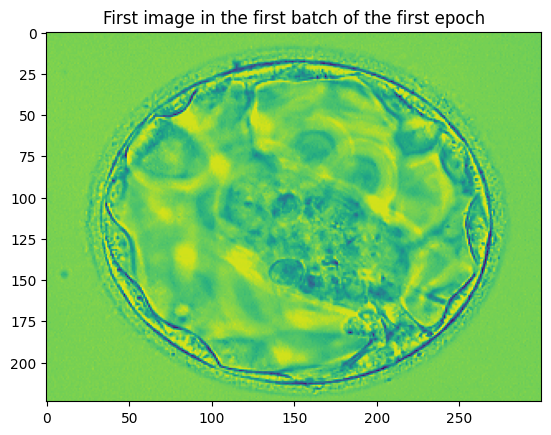

conv1:  torch.Size([16, 16, 224, 300])


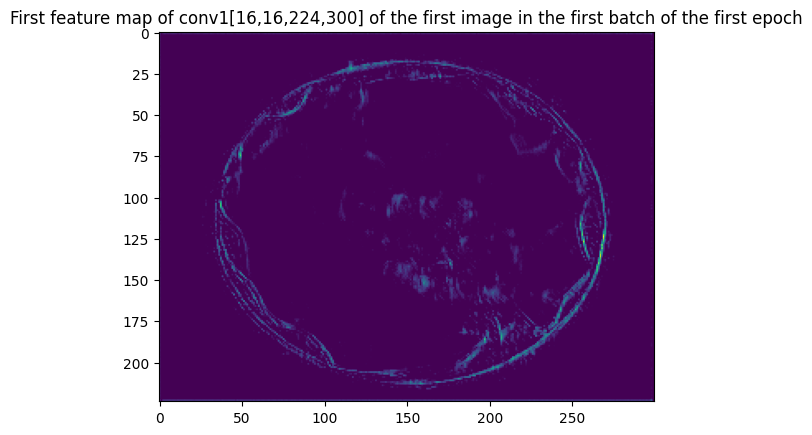

maxpool1: torch.Size([16, 16, 112, 150])


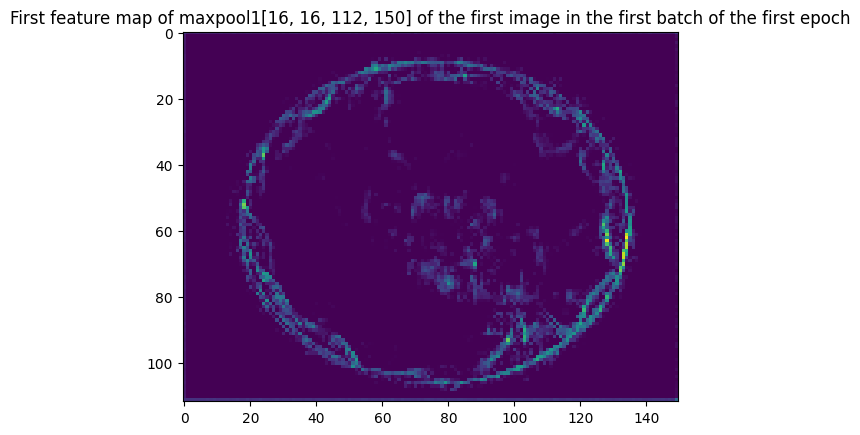

conv2: torch.Size([16, 32, 112, 150])


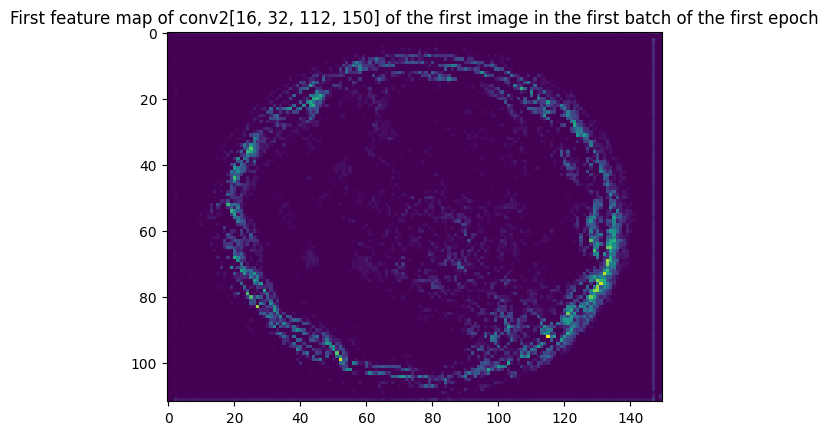

maxpool2: torch.Size([16, 32, 56, 75])


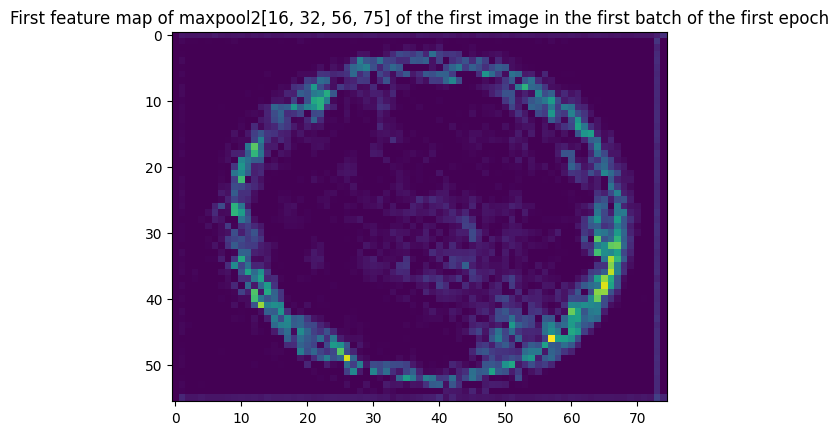

conv3: torch.Size([16, 64, 56, 75])


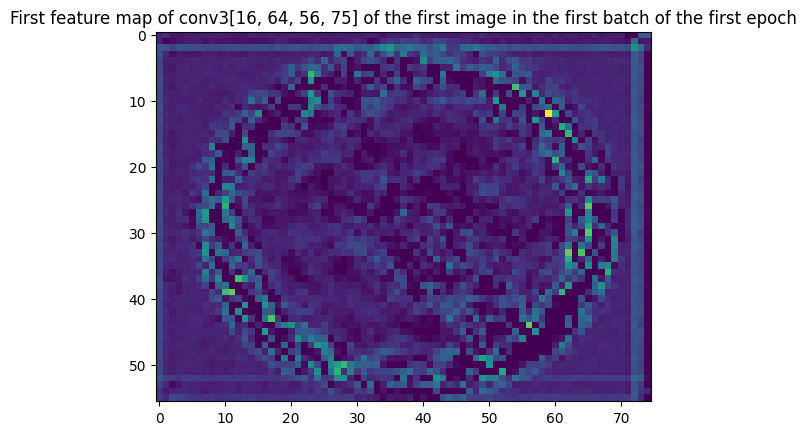

maxpool3: torch.Size([16, 64, 28, 37])


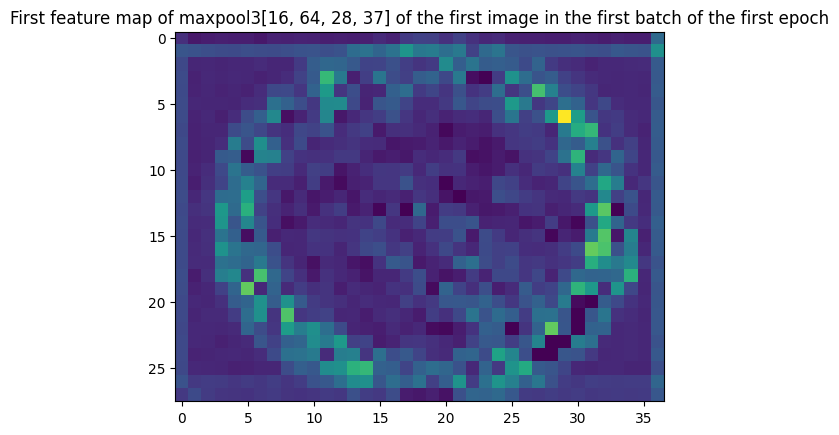

conv4: torch.Size([16, 128, 28, 37])


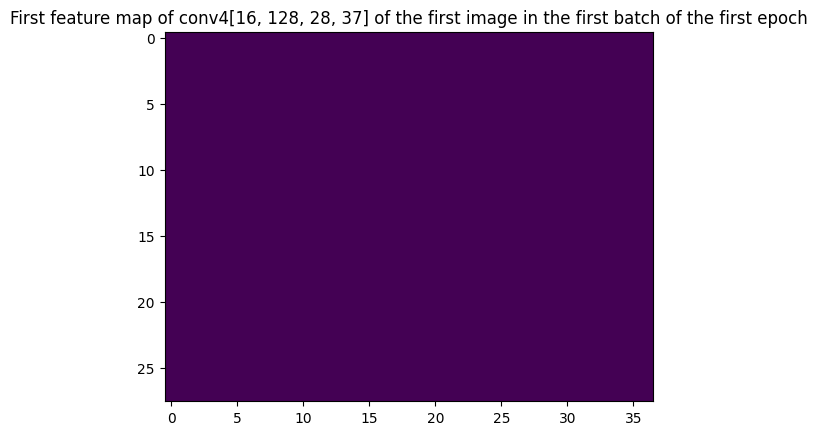

maxpool4: torch.Size([16, 128, 14, 18])


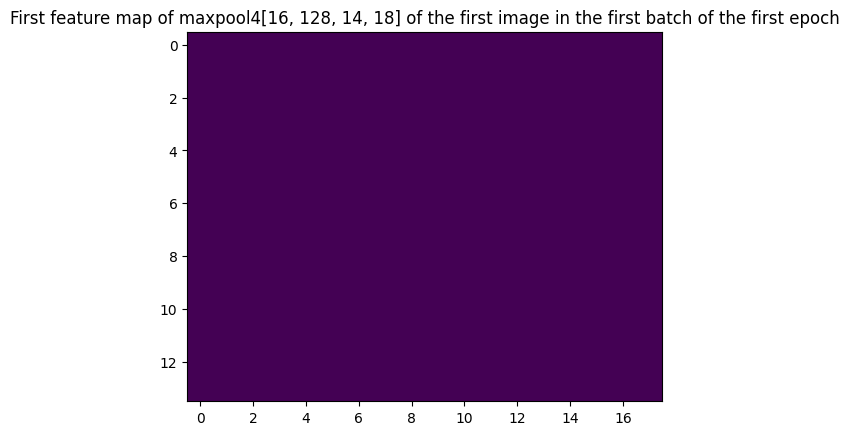

center: torch.Size([16, 256, 14, 18])


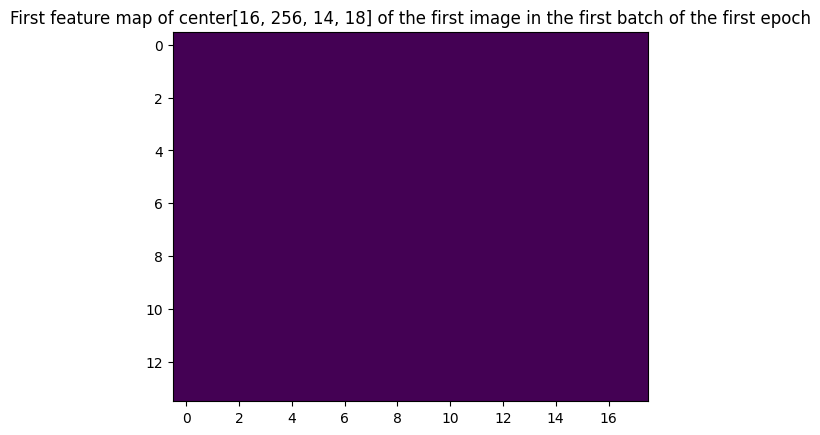

up4 of self.up_concat4: torch.Size([16, 256, 28, 37])


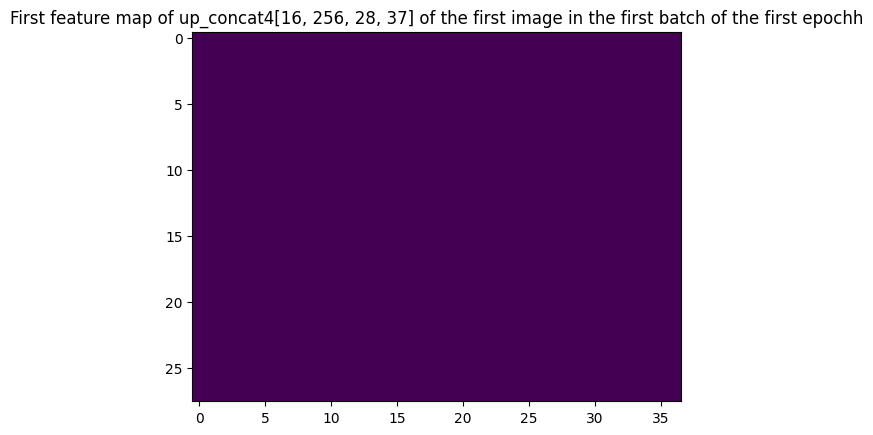

g_conv4: torch.Size([16, 256, 28, 37])


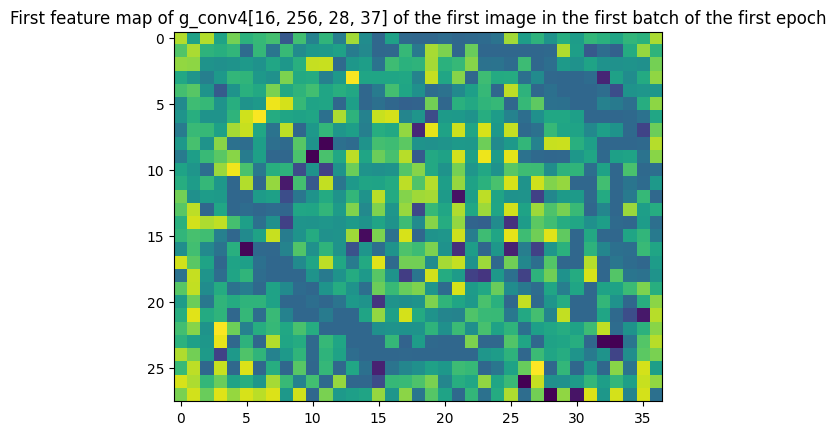

up4 of self.up4: torch.Size([16, 128, 28, 37])


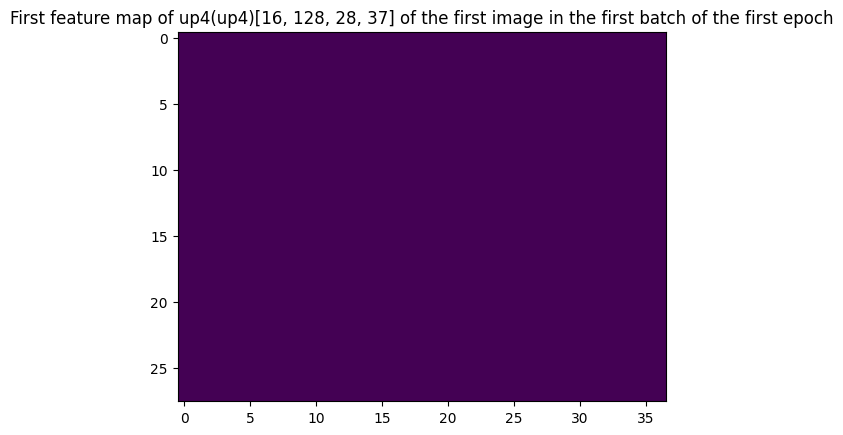

g_conv3: torch.Size([16, 64, 56, 75])


C:\Users\Dell\anaconda3\envs\gpu_env\lib\site-packages\torch\nn\functional.py:3809: UserWarning: nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample is deprecated. Use nn.functional.interpolate instead.")


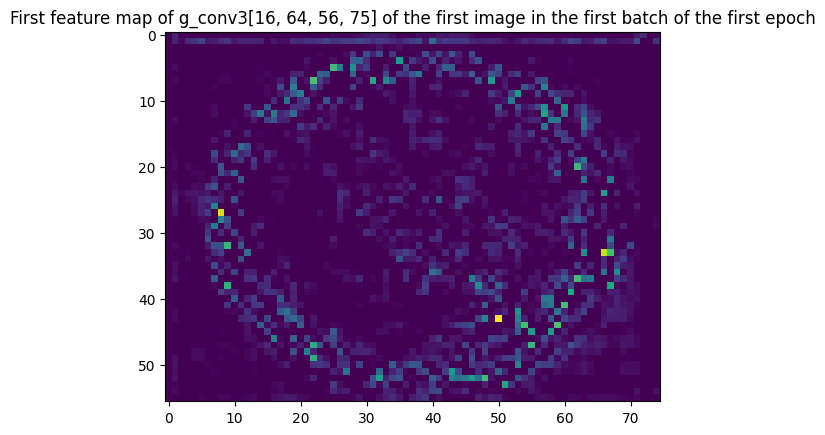

atten3_map: (16, 2, 224, 300)


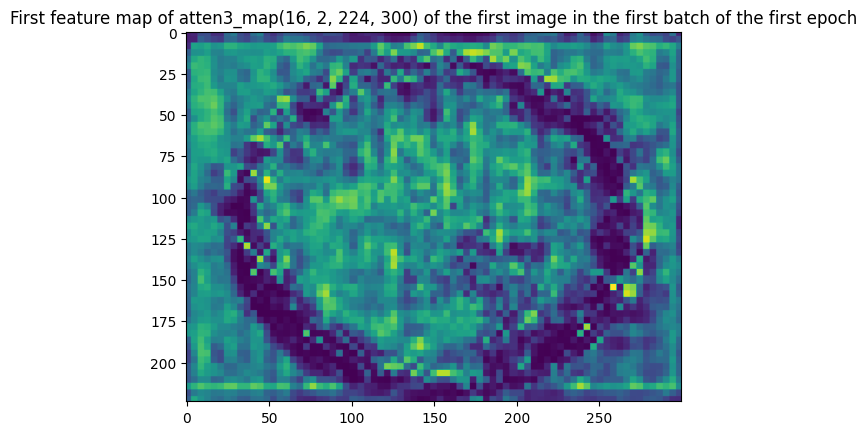

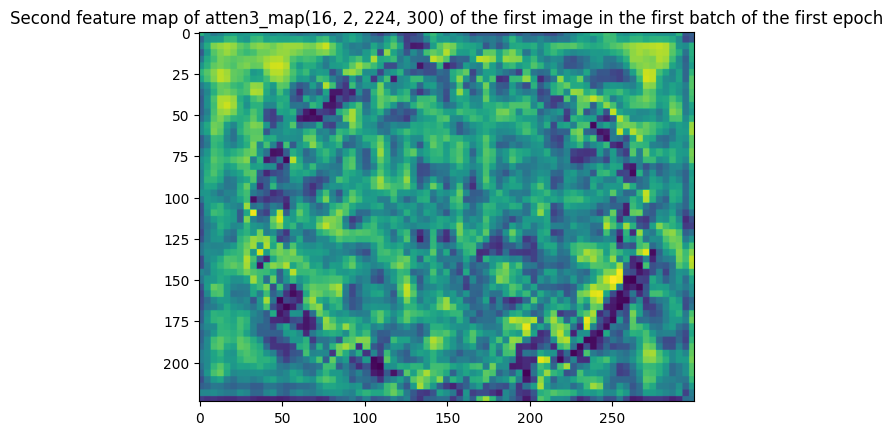

up3 of self.up_concat3: torch.Size([16, 128, 56, 75])


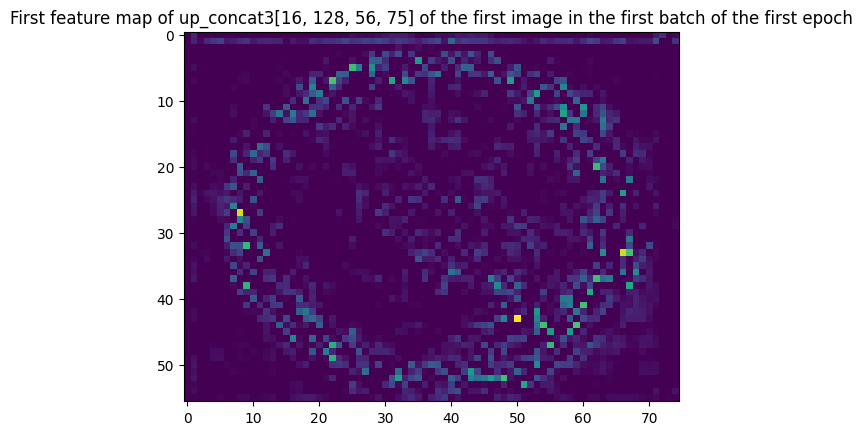

up3 of self.up3: torch.Size([16, 64, 56, 75])


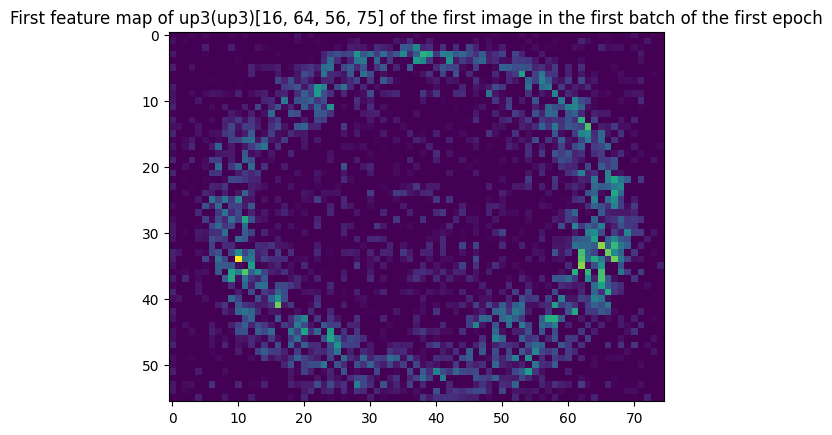

g_conv2: torch.Size([16, 32, 112, 150])


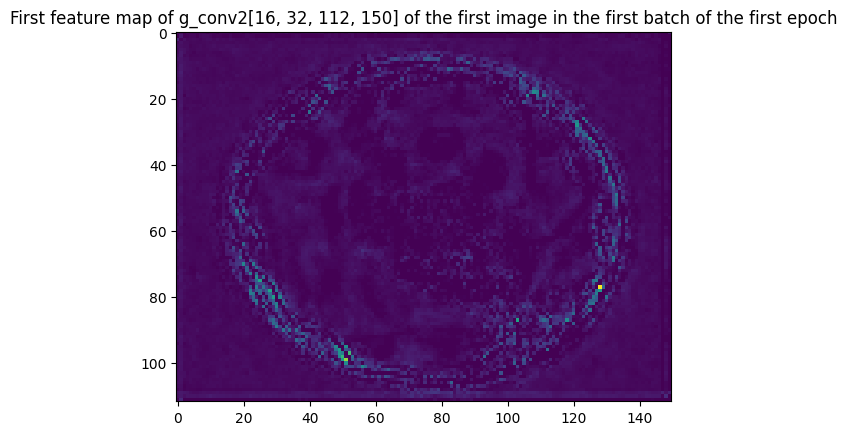

atten2_map: (16, 2, 224, 300)


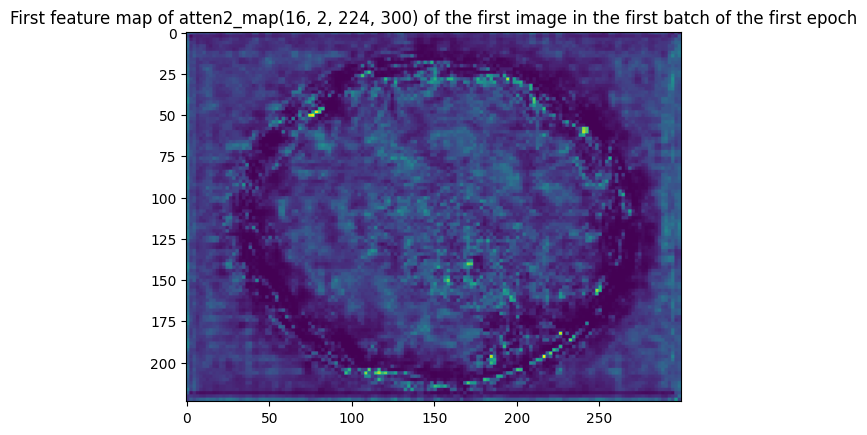

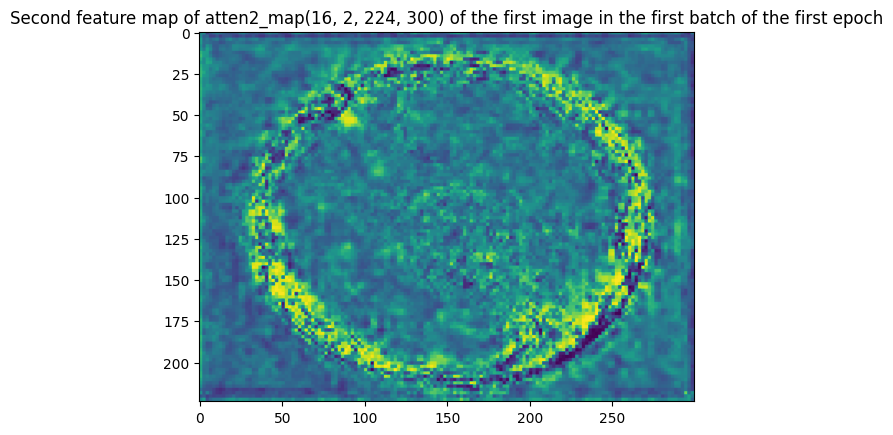

up2 of self.up_concat2: torch.Size([16, 64, 112, 150])


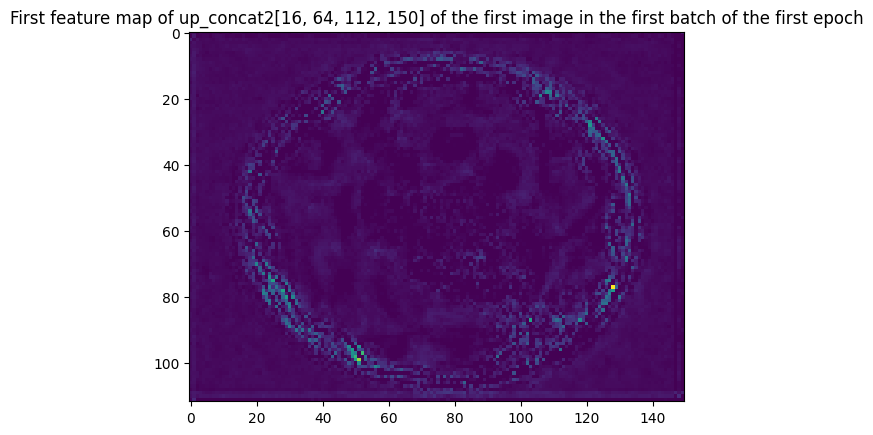

up2 of self.up2: torch.Size([16, 32, 112, 150])


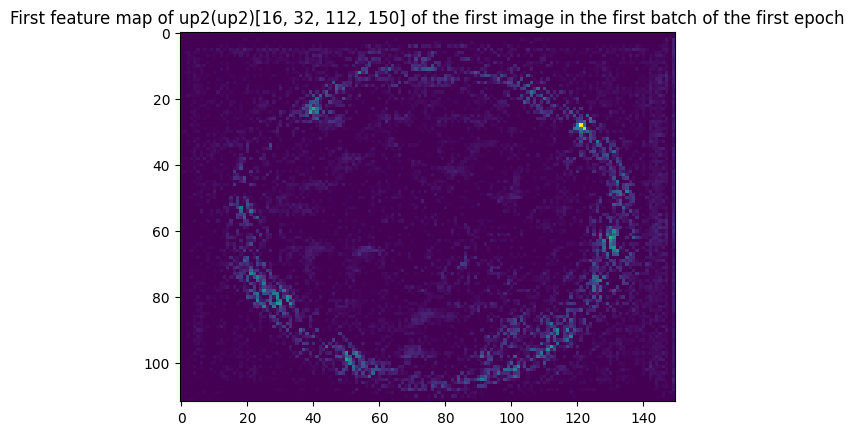

g_conv1: torch.Size([16, 16, 224, 300])


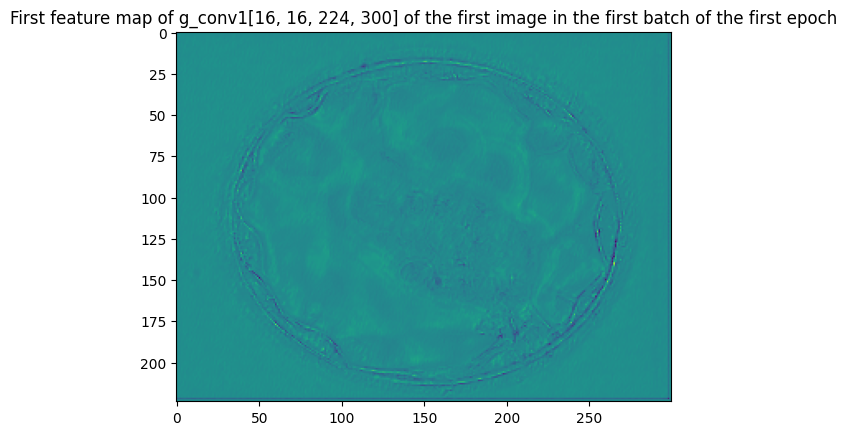

atten1_map: (16, 1, 224, 300)


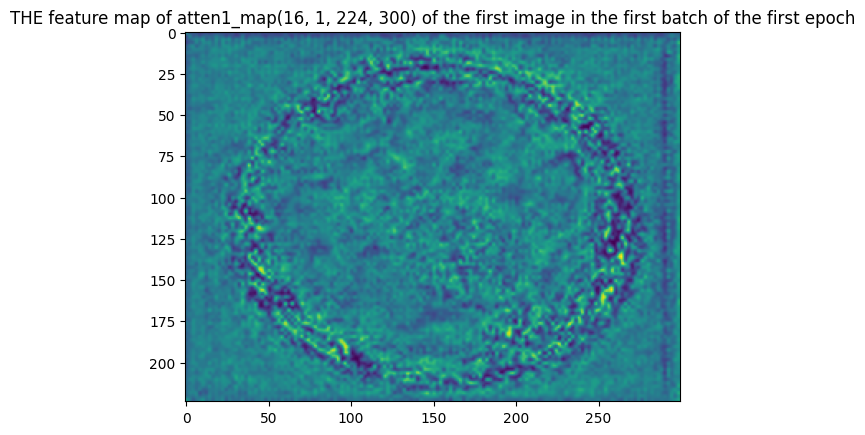

up1 of self.up_concat1: torch.Size([16, 32, 224, 300])


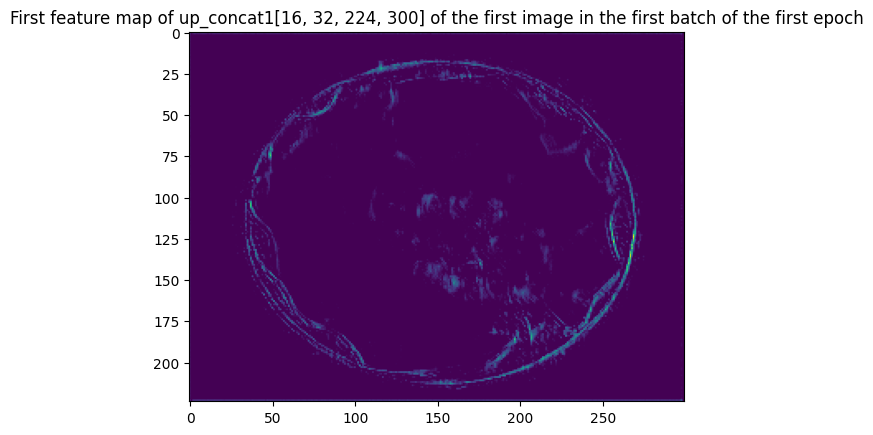

up1 of self.up1: torch.Size([16, 16, 224, 300])


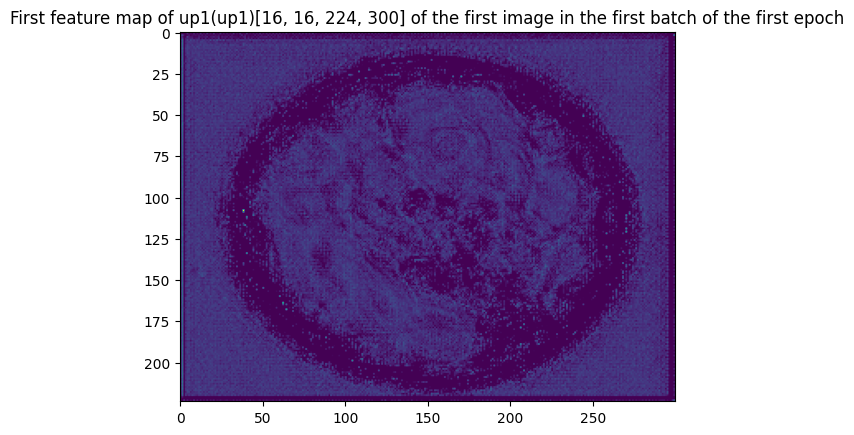

dsv4: torch.Size([16, 4, 224, 300])


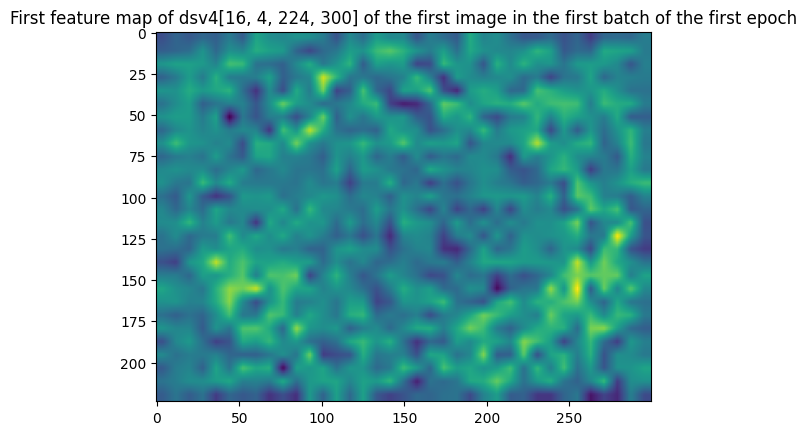

dsv3: torch.Size([16, 4, 224, 300])


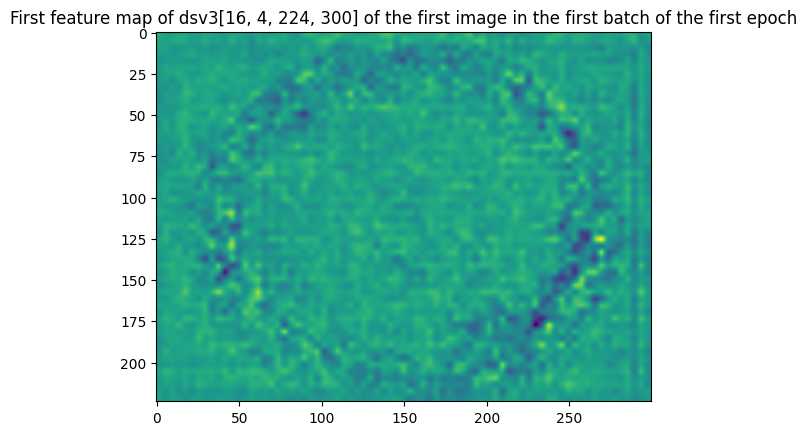

dsv2: torch.Size([16, 4, 224, 300])


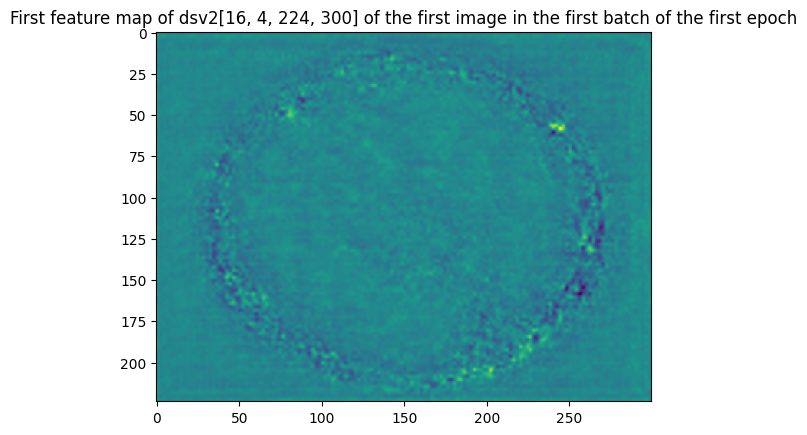

dsv1: torch.Size([16, 4, 224, 300])


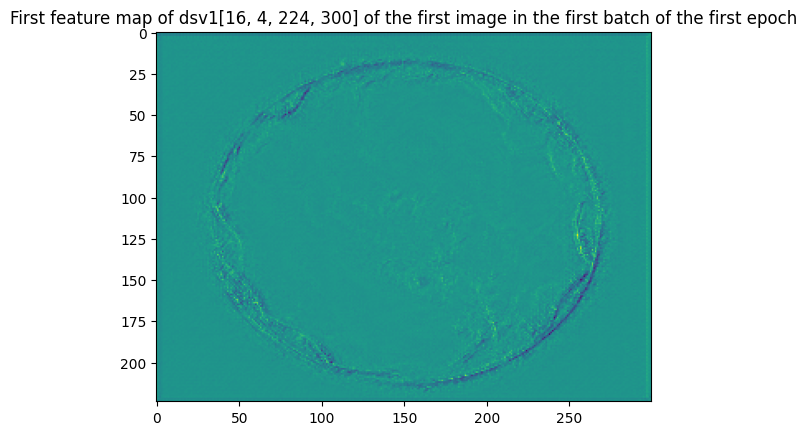

dsv_cat: torch.Size([16, 16, 224, 300])


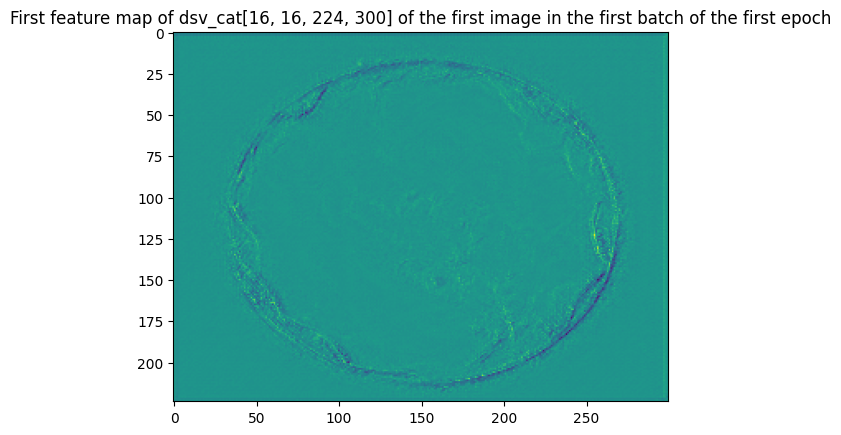

out of self.scale_att: torch.Size([16, 4, 224, 300])


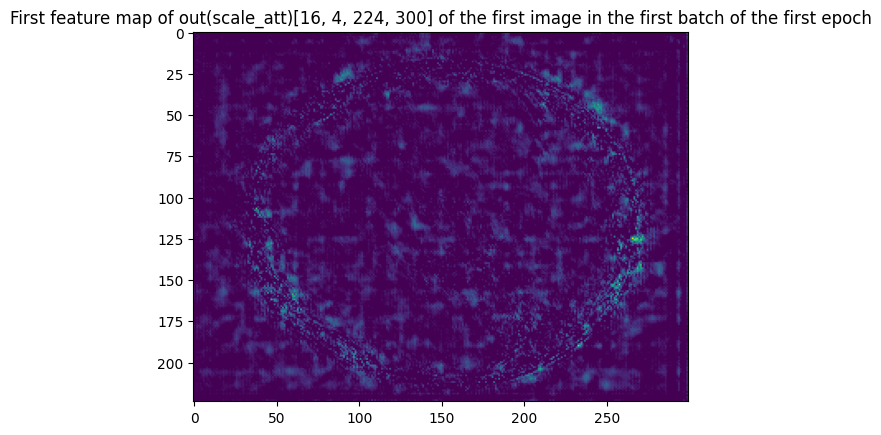

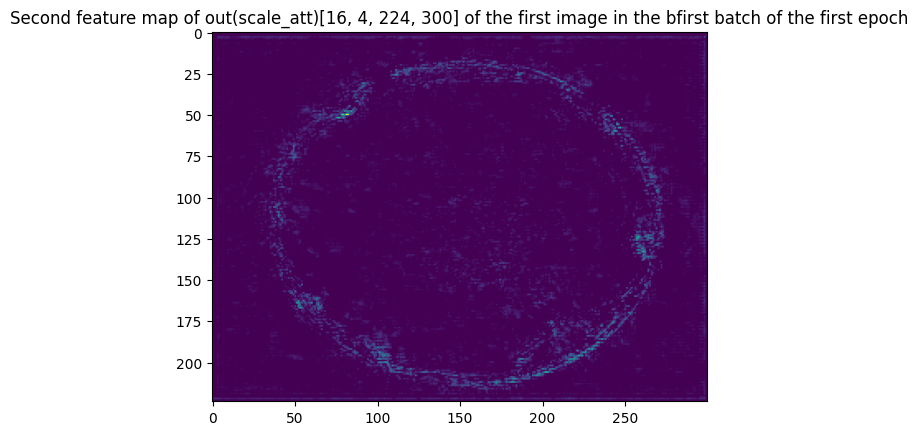

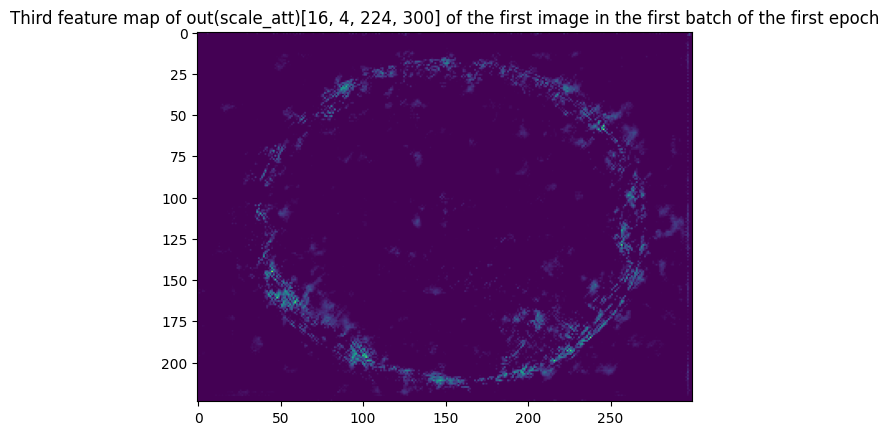

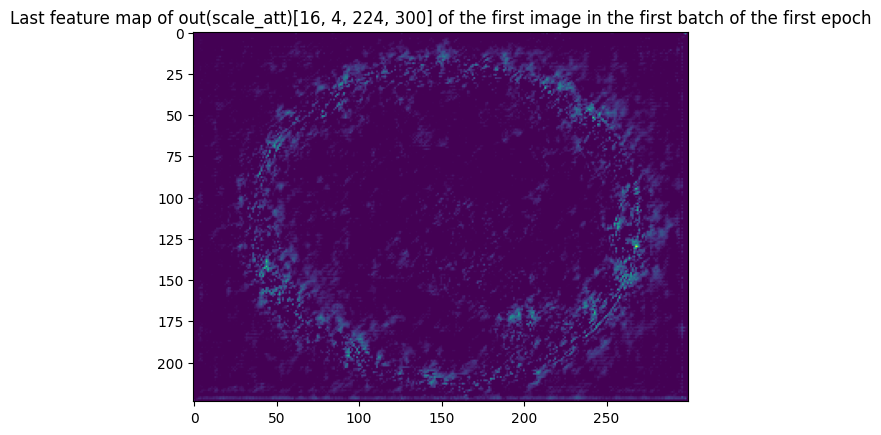

out of self.final: torch.Size([16, 2, 224, 300])


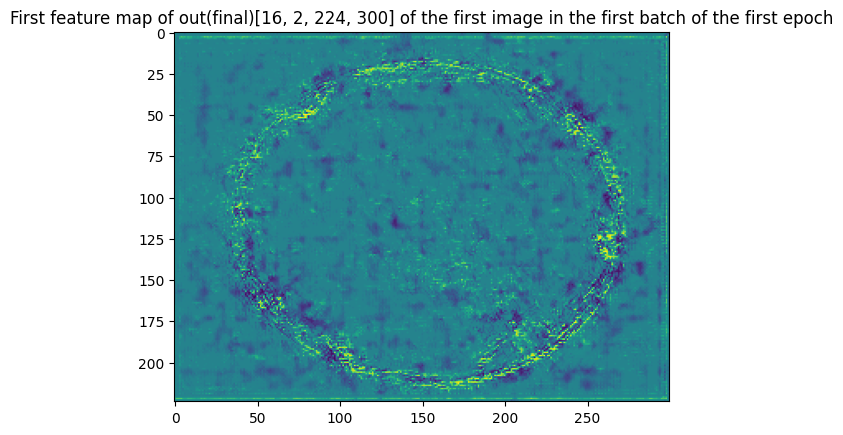

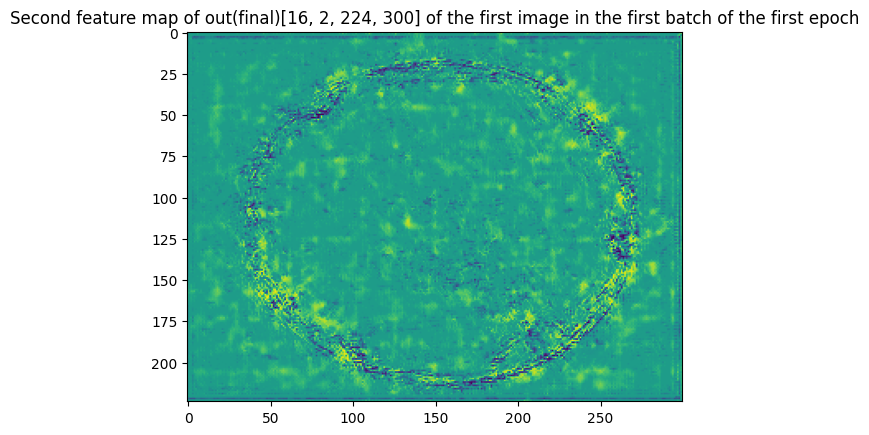

  8%|▊         | 1/13 [00:14<02:54, 14.52s/it]

Train Epoch: 1 [0/198 (0%)]	Loss: 1.266478
Batch number :  2


 15%|█▌        | 2/13 [00:19<01:40,  9.13s/it]

Batch number :  3


 23%|██▎       | 3/13 [00:30<01:38,  9.80s/it]

Batch number :  4


 31%|███       | 4/13 [00:32<01:01,  6.79s/it]

Batch number :  5


 38%|███▊      | 5/13 [00:39<00:55,  6.92s/it]

Batch number :  6


 46%|████▌     | 6/13 [00:48<00:53,  7.62s/it]

Batch number :  7


 54%|█████▍    | 7/13 [00:55<00:43,  7.25s/it]

Batch number :  8


 62%|██████▏   | 8/13 [01:03<00:37,  7.45s/it]

Batch number :  9


 69%|██████▉   | 9/13 [01:11<00:30,  7.73s/it]

Batch number :  10


 77%|███████▋  | 10/13 [01:18<00:22,  7.59s/it]

Batch number :  11


 85%|████████▍ | 11/13 [01:25<00:14,  7.42s/it]

Batch number :  12


 92%|█████████▏| 12/13 [01:34<00:07,  7.82s/it]

Batch number :  13


100%|██████████| 13/13 [01:40<00:00,  7.77s/it]


The average loss:1.1512
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_1.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  14


  8%|▊         | 1/13 [00:08<01:40,  8.39s/it]

Train Epoch: 2 [0/198 (0%)]	Loss: 1.049698
Batch number :  15


 15%|█▌        | 2/13 [00:10<00:48,  4.42s/it]

Batch number :  16


 23%|██▎       | 3/13 [00:19<01:05,  6.58s/it]

Batch number :  17


 31%|███       | 4/13 [00:27<01:06,  7.41s/it]

Batch number :  18


 38%|███▊      | 5/13 [00:35<01:01,  7.66s/it]

Batch number :  19


 46%|████▌     | 6/13 [00:43<00:53,  7.66s/it]

Batch number :  20


 54%|█████▍    | 7/13 [00:52<00:49,  8.19s/it]

Batch number :  21


 62%|██████▏   | 8/13 [01:03<00:44,  8.87s/it]

Batch number :  22


 69%|██████▉   | 9/13 [01:12<00:35,  8.93s/it]

Batch number :  23


 77%|███████▋  | 10/13 [01:20<00:26,  8.77s/it]

Batch number :  24


 85%|████████▍ | 11/13 [01:30<00:18,  9.15s/it]

Batch number :  25


 92%|█████████▏| 12/13 [01:39<00:09,  9.03s/it]

Batch number :  26


100%|██████████| 13/13 [01:45<00:00,  8.12s/it]


The average loss:1.0294
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_2.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  27


  8%|▊         | 1/13 [00:07<01:33,  7.81s/it]

Train Epoch: 3 [0/198 (0%)]	Loss: 0.912080
Batch number :  28


 15%|█▌        | 2/13 [00:09<00:47,  4.29s/it]

Batch number :  29


 23%|██▎       | 3/13 [00:16<00:56,  5.65s/it]

Batch number :  30


 31%|███       | 4/13 [00:24<00:56,  6.29s/it]

Batch number :  31


 38%|███▊      | 5/13 [00:31<00:54,  6.78s/it]

Batch number :  32


 46%|████▌     | 6/13 [00:40<00:50,  7.26s/it]

Batch number :  33


 54%|█████▍    | 7/13 [00:46<00:42,  7.09s/it]

Batch number :  34


 62%|██████▏   | 8/13 [00:55<00:37,  7.55s/it]

Batch number :  35


 69%|██████▉   | 9/13 [01:02<00:29,  7.50s/it]

Batch number :  36


 77%|███████▋  | 10/13 [01:10<00:22,  7.47s/it]

Batch number :  37


 85%|████████▍ | 11/13 [01:17<00:15,  7.58s/it]

Batch number :  38


 92%|█████████▏| 12/13 [01:26<00:07,  7.94s/it]

Batch number :  39


100%|██████████| 13/13 [01:33<00:00,  7.18s/it]


The average loss:0.9626
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_3.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  40


  8%|▊         | 1/13 [00:07<01:33,  7.80s/it]

Train Epoch: 4 [0/198 (0%)]	Loss: 0.970957
Batch number :  41


 15%|█▌        | 2/13 [00:09<00:44,  4.03s/it]

Batch number :  42


 23%|██▎       | 3/13 [00:17<00:58,  5.88s/it]

Batch number :  43


 31%|███       | 4/13 [00:23<00:55,  6.16s/it]

Batch number :  44


 38%|███▊      | 5/13 [00:32<00:56,  7.07s/it]

Batch number :  45


 46%|████▌     | 6/13 [00:40<00:51,  7.41s/it]

Batch number :  46


 54%|█████▍    | 7/13 [00:48<00:44,  7.44s/it]

Batch number :  47


 62%|██████▏   | 8/13 [00:56<00:38,  7.62s/it]

Batch number :  48


 69%|██████▉   | 9/13 [01:03<00:30,  7.65s/it]

Batch number :  49


 77%|███████▋  | 10/13 [01:12<00:23,  7.83s/it]

Batch number :  50


 85%|████████▍ | 11/13 [01:20<00:15,  7.90s/it]

Batch number :  51


 92%|█████████▏| 12/13 [01:27<00:07,  7.80s/it]

Batch number :  52


100%|██████████| 13/13 [01:34<00:00,  7.26s/it]


The average loss:0.9263
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_4.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  53


  8%|▊         | 1/13 [00:07<01:33,  7.81s/it]

Train Epoch: 5 [0/198 (0%)]	Loss: 0.971109
Batch number :  54


 15%|█▌        | 2/13 [00:09<00:45,  4.17s/it]

Batch number :  55


 23%|██▎       | 3/13 [00:17<01:01,  6.17s/it]

Batch number :  56


 31%|███       | 4/13 [00:25<01:01,  6.81s/it]

Batch number :  57


 38%|███▊      | 5/13 [00:33<00:56,  7.09s/it]

Batch number :  58


 46%|████▌     | 6/13 [00:42<00:54,  7.74s/it]

Batch number :  59


 54%|█████▍    | 7/13 [00:49<00:45,  7.59s/it]

Batch number :  60


 62%|██████▏   | 8/13 [00:57<00:38,  7.75s/it]

Batch number :  61


 69%|██████▉   | 9/13 [01:04<00:30,  7.56s/it]

Batch number :  62


 77%|███████▋  | 10/13 [01:13<00:23,  7.81s/it]

Batch number :  63


 85%|████████▍ | 11/13 [01:21<00:15,  7.90s/it]

Batch number :  64


 92%|█████████▏| 12/13 [01:29<00:08,  8.04s/it]

Batch number :  65


100%|██████████| 13/13 [01:36<00:00,  7.43s/it]


The average loss:0.9057
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_5.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  66


  8%|▊         | 1/13 [00:07<01:28,  7.38s/it]

Train Epoch: 6 [0/198 (0%)]	Loss: 0.950511
Batch number :  67


 15%|█▌        | 2/13 [00:08<00:39,  3.61s/it]

Batch number :  68


 23%|██▎       | 3/13 [00:15<00:52,  5.28s/it]

Batch number :  69


 31%|███       | 4/13 [00:23<00:56,  6.31s/it]

Batch number :  70


 38%|███▊      | 5/13 [00:31<00:53,  6.74s/it]

Batch number :  71


 46%|████▌     | 6/13 [00:39<00:50,  7.26s/it]

Batch number :  72


 54%|█████▍    | 7/13 [00:47<00:44,  7.46s/it]

Batch number :  73


 62%|██████▏   | 8/13 [00:55<00:38,  7.63s/it]

Batch number :  74


 69%|██████▉   | 9/13 [01:02<00:30,  7.61s/it]

Batch number :  75


 77%|███████▋  | 10/13 [01:10<00:22,  7.56s/it]

Batch number :  76


 85%|████████▍ | 11/13 [01:18<00:15,  7.68s/it]

Batch number :  77


 92%|█████████▏| 12/13 [01:26<00:07,  7.85s/it]

Batch number :  78


100%|██████████| 13/13 [01:33<00:00,  7.18s/it]


The average loss:0.8994
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_6.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  79


  8%|▊         | 1/13 [00:07<01:25,  7.10s/it]

Train Epoch: 7 [0/198 (0%)]	Loss: 0.871479
Batch number :  80


 15%|█▌        | 2/13 [00:08<00:41,  3.79s/it]

Batch number :  81


 23%|██▎       | 3/13 [00:16<00:56,  5.67s/it]

Batch number :  82


 31%|███       | 4/13 [00:26<01:05,  7.24s/it]

Batch number :  83


 38%|███▊      | 5/13 [00:33<00:58,  7.30s/it]

Batch number :  84


 46%|████▌     | 6/13 [00:43<00:57,  8.25s/it]

Batch number :  85


 54%|█████▍    | 7/13 [00:50<00:47,  7.91s/it]

Batch number :  86


 62%|██████▏   | 8/13 [00:57<00:38,  7.65s/it]

Batch number :  87


 69%|██████▉   | 9/13 [01:06<00:31,  7.89s/it]

Batch number :  88


 77%|███████▋  | 10/13 [01:14<00:23,  7.95s/it]

Batch number :  89


 85%|████████▍ | 11/13 [01:22<00:15,  7.91s/it]

Batch number :  90


 92%|█████████▏| 12/13 [01:31<00:08,  8.17s/it]

Batch number :  91


100%|██████████| 13/13 [01:38<00:00,  7.55s/it]


The average loss:0.8855
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_7.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  92


  8%|▊         | 1/13 [00:07<01:35,  8.00s/it]

Train Epoch: 8 [0/198 (0%)]	Loss: 0.834244
Batch number :  93


 15%|█▌        | 2/13 [00:09<00:46,  4.27s/it]

Batch number :  94


 23%|██▎       | 3/13 [00:17<00:56,  5.69s/it]

Batch number :  95


 31%|███       | 4/13 [00:26<01:03,  7.06s/it]

Batch number :  96


 38%|███▊      | 5/13 [00:33<00:58,  7.26s/it]

Batch number :  97


 46%|████▌     | 6/13 [00:41<00:51,  7.40s/it]

Batch number :  98


 54%|█████▍    | 7/13 [00:49<00:46,  7.72s/it]

Batch number :  99


 62%|██████▏   | 8/13 [00:58<00:39,  7.97s/it]

Batch number :  100


 69%|██████▉   | 9/13 [01:06<00:32,  8.05s/it]

Batch number :  101


 77%|███████▋  | 10/13 [01:14<00:24,  8.04s/it]

Batch number :  102


 85%|████████▍ | 11/13 [01:22<00:15,  7.99s/it]

Batch number :  103


 92%|█████████▏| 12/13 [01:29<00:07,  7.72s/it]

Batch number :  104


100%|██████████| 13/13 [01:36<00:00,  7.41s/it]


The average loss:0.8774
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_8.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  105


  8%|▊         | 1/13 [00:07<01:32,  7.68s/it]

Train Epoch: 9 [0/198 (0%)]	Loss: 0.842359
Batch number :  106


 15%|█▌        | 2/13 [00:08<00:42,  3.86s/it]

Batch number :  107


 23%|██▎       | 3/13 [00:16<00:54,  5.42s/it]

Batch number :  108


 31%|███       | 4/13 [00:24<00:58,  6.51s/it]

Batch number :  109


 38%|███▊      | 5/13 [00:32<00:56,  7.11s/it]

Batch number :  110


 46%|████▌     | 6/13 [00:40<00:52,  7.45s/it]

Batch number :  111


 54%|█████▍    | 7/13 [00:48<00:45,  7.52s/it]

Batch number :  112


 62%|██████▏   | 8/13 [00:55<00:37,  7.41s/it]

Batch number :  113


 69%|██████▉   | 9/13 [01:03<00:30,  7.74s/it]

Batch number :  114


 77%|███████▋  | 10/13 [01:11<00:23,  7.83s/it]

Batch number :  115


 85%|████████▍ | 11/13 [01:19<00:15,  7.67s/it]

Batch number :  116


 92%|█████████▏| 12/13 [01:26<00:07,  7.60s/it]

Batch number :  117


100%|██████████| 13/13 [01:33<00:00,  7.18s/it]


The average loss:0.8696
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_9.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  118


  8%|▊         | 1/13 [00:07<01:28,  7.35s/it]

Train Epoch: 10 [0/198 (0%)]	Loss: 0.840023
Batch number :  119


 15%|█▌        | 2/13 [00:08<00:42,  3.86s/it]

Batch number :  120


 23%|██▎       | 3/13 [00:17<01:00,  6.10s/it]

Batch number :  121


 31%|███       | 4/13 [00:27<01:08,  7.65s/it]

Batch number :  122


 38%|███▊      | 5/13 [00:36<01:05,  8.14s/it]

Batch number :  123


 46%|████▌     | 6/13 [00:46<01:00,  8.60s/it]

Batch number :  124


 54%|█████▍    | 7/13 [00:52<00:47,  7.98s/it]

Batch number :  125


 62%|██████▏   | 8/13 [01:03<00:43,  8.71s/it]

Batch number :  126


 69%|██████▉   | 9/13 [01:12<00:35,  8.88s/it]

Batch number :  127


 77%|███████▋  | 10/13 [01:21<00:27,  9.03s/it]

Batch number :  128


 85%|████████▍ | 11/13 [01:30<00:18,  9.10s/it]

Batch number :  129


 92%|█████████▏| 12/13 [01:40<00:09,  9.28s/it]

Batch number :  130


100%|██████████| 13/13 [01:48<00:00,  8.36s/it]


The average loss:0.8651
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_10.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  131


  8%|▊         | 1/13 [00:08<01:38,  8.24s/it]

Train Epoch: 11 [0/198 (0%)]	Loss: 0.804500
Batch number :  132


 15%|█▌        | 2/13 [00:09<00:43,  3.98s/it]

Batch number :  133


 23%|██▎       | 3/13 [00:16<00:56,  5.65s/it]

Batch number :  134


 31%|███       | 4/13 [00:24<00:59,  6.57s/it]

Batch number :  135


 38%|███▊      | 5/13 [00:34<01:00,  7.62s/it]

Batch number :  136


 46%|████▌     | 6/13 [00:43<00:56,  8.09s/it]

Batch number :  137


 54%|█████▍    | 7/13 [00:52<00:49,  8.32s/it]

Batch number :  138


 62%|██████▏   | 8/13 [01:01<00:43,  8.77s/it]

Batch number :  139


 69%|██████▉   | 9/13 [01:09<00:34,  8.56s/it]

Batch number :  140


 77%|███████▋  | 10/13 [01:17<00:24,  8.20s/it]

Batch number :  141


 85%|████████▍ | 11/13 [01:25<00:16,  8.07s/it]

Batch number :  142


 92%|█████████▏| 12/13 [01:32<00:07,  7.95s/it]

Batch number :  143


100%|██████████| 13/13 [01:39<00:00,  7.67s/it]


The average loss:0.8587
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_11.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  144


  8%|▊         | 1/13 [00:09<01:53,  9.43s/it]

Train Epoch: 12 [0/198 (0%)]	Loss: 0.827470
Batch number :  145


 15%|█▌        | 2/13 [00:11<00:53,  4.85s/it]

Batch number :  146


 23%|██▎       | 3/13 [00:18<00:59,  5.91s/it]

Batch number :  147


 31%|███       | 4/13 [00:28<01:07,  7.52s/it]

Batch number :  148


 38%|███▊      | 5/13 [00:36<01:02,  7.83s/it]

Batch number :  149


 46%|████▌     | 6/13 [00:46<00:59,  8.51s/it]

Batch number :  150


 54%|█████▍    | 7/13 [00:54<00:49,  8.28s/it]

Batch number :  151


 62%|██████▏   | 8/13 [01:03<00:42,  8.45s/it]

Batch number :  152


 69%|██████▉   | 9/13 [01:11<00:34,  8.56s/it]

Batch number :  153


 77%|███████▋  | 10/13 [01:21<00:26,  8.79s/it]

Batch number :  154


 85%|████████▍ | 11/13 [01:30<00:17,  8.99s/it]

Batch number :  155


 92%|█████████▏| 12/13 [01:39<00:08,  8.96s/it]

Batch number :  156


100%|██████████| 13/13 [01:48<00:00,  8.32s/it]


The average loss:0.8521
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_12.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  157


  8%|▊         | 1/13 [00:07<01:25,  7.11s/it]

Train Epoch: 13 [0/198 (0%)]	Loss: 0.863769
Batch number :  158


 15%|█▌        | 2/13 [00:08<00:41,  3.74s/it]

Batch number :  159


 23%|██▎       | 3/13 [00:18<01:03,  6.40s/it]

Batch number :  160


 31%|███       | 4/13 [00:26<01:04,  7.21s/it]

Batch number :  161


 38%|███▊      | 5/13 [00:36<01:05,  8.16s/it]

Batch number :  162


 46%|████▌     | 6/13 [00:43<00:55,  7.93s/it]

Batch number :  163


 54%|█████▍    | 7/13 [00:53<00:51,  8.50s/it]

Batch number :  164


 62%|██████▏   | 8/13 [01:00<00:40,  8.09s/it]

Batch number :  165


 69%|██████▉   | 9/13 [01:08<00:31,  7.93s/it]

Batch number :  166


 77%|███████▋  | 10/13 [01:17<00:24,  8.32s/it]

Batch number :  167


 85%|████████▍ | 11/13 [01:25<00:16,  8.34s/it]

Batch number :  168


 92%|█████████▏| 12/13 [01:33<00:08,  8.14s/it]

Batch number :  169


100%|██████████| 13/13 [01:40<00:00,  7.72s/it]


The average loss:0.8445
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_13.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  170


  8%|▊         | 1/13 [00:08<01:47,  8.96s/it]

Train Epoch: 14 [0/198 (0%)]	Loss: 0.833276
Batch number :  171


 15%|█▌        | 2/13 [00:10<00:51,  4.72s/it]

Batch number :  172


 23%|██▎       | 3/13 [00:18<01:00,  6.09s/it]

Batch number :  173


 31%|███       | 4/13 [00:25<00:57,  6.40s/it]

Batch number :  174


 38%|███▊      | 5/13 [00:33<00:56,  7.01s/it]

Batch number :  175


 46%|████▌     | 6/13 [00:43<00:55,  7.94s/it]

Batch number :  176


 54%|█████▍    | 7/13 [00:49<00:44,  7.43s/it]

Batch number :  177


 62%|██████▏   | 8/13 [00:59<00:41,  8.28s/it]

Batch number :  178


 69%|██████▉   | 9/13 [01:09<00:35,  8.91s/it]

Batch number :  179


 77%|███████▋  | 10/13 [01:18<00:26,  8.79s/it]

Batch number :  180


 85%|████████▍ | 11/13 [01:28<00:18,  9.05s/it]

Batch number :  181


 92%|█████████▏| 12/13 [01:38<00:09,  9.40s/it]

Batch number :  182


100%|██████████| 13/13 [01:45<00:00,  8.09s/it]


The average loss:0.8424
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_14.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  183


  8%|▊         | 1/13 [00:08<01:38,  8.20s/it]

Train Epoch: 15 [0/198 (0%)]	Loss: 0.808895
Batch number :  184


 15%|█▌        | 2/13 [00:09<00:44,  4.03s/it]

Batch number :  185


 23%|██▎       | 3/13 [00:18<01:01,  6.19s/it]

Batch number :  186


 31%|███       | 4/13 [00:26<01:02,  6.94s/it]

Batch number :  187


 38%|███▊      | 5/13 [00:35<01:01,  7.74s/it]

Batch number :  188


 46%|████▌     | 6/13 [00:46<01:01,  8.82s/it]

Batch number :  189


 54%|█████▍    | 7/13 [00:55<00:53,  8.93s/it]

Batch number :  190


 62%|██████▏   | 8/13 [01:05<00:46,  9.20s/it]

Batch number :  191


 69%|██████▉   | 9/13 [01:12<00:34,  8.72s/it]

Batch number :  192


 77%|███████▋  | 10/13 [01:20<00:25,  8.55s/it]

Batch number :  193


 85%|████████▍ | 11/13 [01:31<00:18,  9.12s/it]

Batch number :  194


 92%|█████████▏| 12/13 [01:41<00:09,  9.27s/it]

Batch number :  195


100%|██████████| 13/13 [01:48<00:00,  8.37s/it]


The average loss:0.8343
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_15.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  196


  8%|▊         | 1/13 [00:07<01:34,  7.89s/it]

Train Epoch: 16 [0/198 (0%)]	Loss: 0.824301
Batch number :  197


 15%|█▌        | 2/13 [00:09<00:44,  4.03s/it]

Batch number :  198


 23%|██▎       | 3/13 [00:18<01:05,  6.52s/it]

Batch number :  199


 31%|███       | 4/13 [00:26<01:03,  7.05s/it]

Batch number :  200


 38%|███▊      | 5/13 [00:36<01:04,  8.09s/it]

Batch number :  201


 46%|████▌     | 6/13 [00:44<00:56,  8.08s/it]

Batch number :  202


 54%|█████▍    | 7/13 [00:52<00:47,  7.94s/it]

Batch number :  203


 62%|██████▏   | 8/13 [00:59<00:38,  7.79s/it]

Batch number :  204


 69%|██████▉   | 9/13 [01:07<00:31,  7.78s/it]

Batch number :  205


 77%|███████▋  | 10/13 [01:14<00:23,  7.69s/it]

Batch number :  206


 85%|████████▍ | 11/13 [01:23<00:15,  7.98s/it]

Batch number :  207


 92%|█████████▏| 12/13 [01:31<00:07,  7.84s/it]

Batch number :  208


100%|██████████| 13/13 [01:38<00:00,  7.61s/it]


The average loss:0.8291
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_16.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  209


  8%|▊         | 1/13 [00:07<01:28,  7.36s/it]

Train Epoch: 17 [0/198 (0%)]	Loss: 0.808532
Batch number :  210


 15%|█▌        | 2/13 [00:08<00:42,  3.87s/it]

Batch number :  211


 23%|██▎       | 3/13 [00:16<00:55,  5.55s/it]

Batch number :  212


 31%|███       | 4/13 [00:23<00:56,  6.33s/it]

Batch number :  213


 38%|███▊      | 5/13 [00:31<00:54,  6.83s/it]

Batch number :  214


 46%|████▌     | 6/13 [00:39<00:50,  7.25s/it]

Batch number :  215


 54%|█████▍    | 7/13 [00:47<00:45,  7.54s/it]

Batch number :  216


 62%|██████▏   | 8/13 [00:55<00:38,  7.63s/it]

Batch number :  217


 69%|██████▉   | 9/13 [01:03<00:30,  7.64s/it]

Batch number :  218


 77%|███████▋  | 10/13 [01:11<00:23,  7.76s/it]

Batch number :  219


 85%|████████▍ | 11/13 [01:19<00:15,  7.84s/it]

Batch number :  220


 92%|█████████▏| 12/13 [01:26<00:07,  7.78s/it]

Batch number :  221


100%|██████████| 13/13 [01:34<00:00,  7.26s/it]


The average loss:0.8225
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_17.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  222


  8%|▊         | 1/13 [00:06<01:19,  6.62s/it]

Train Epoch: 18 [0/198 (0%)]	Loss: 0.832175
Batch number :  223


 15%|█▌        | 2/13 [00:07<00:38,  3.48s/it]

Batch number :  224


 23%|██▎       | 3/13 [00:16<00:57,  5.78s/it]

Batch number :  225


 31%|███       | 4/13 [00:23<00:55,  6.14s/it]

Batch number :  226


 38%|███▊      | 5/13 [00:31<00:55,  6.93s/it]

Batch number :  227


 46%|████▌     | 6/13 [00:40<00:54,  7.76s/it]

Batch number :  228


 54%|█████▍    | 7/13 [00:48<00:47,  7.89s/it]

Batch number :  229


 62%|██████▏   | 8/13 [00:58<00:41,  8.34s/it]

Batch number :  230


 69%|██████▉   | 9/13 [01:06<00:33,  8.33s/it]

Batch number :  231


 77%|███████▋  | 10/13 [01:13<00:23,  7.84s/it]

Batch number :  232


 85%|████████▍ | 11/13 [01:21<00:15,  7.84s/it]

Batch number :  233


 92%|█████████▏| 12/13 [01:28<00:07,  7.81s/it]

Batch number :  234


100%|██████████| 13/13 [01:36<00:00,  7.45s/it]


The average loss:0.8195
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_18.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  235


  8%|▊         | 1/13 [00:09<01:52,  9.40s/it]

Train Epoch: 19 [0/198 (0%)]	Loss: 0.868329
Batch number :  236


 15%|█▌        | 2/13 [00:10<00:51,  4.67s/it]

Batch number :  237


 23%|██▎       | 3/13 [00:19<01:06,  6.62s/it]

Batch number :  238


 31%|███       | 4/13 [00:29<01:11,  8.00s/it]

Batch number :  239


 38%|███▊      | 5/13 [00:38<01:05,  8.13s/it]

Batch number :  240


 46%|████▌     | 6/13 [00:48<01:01,  8.82s/it]

Batch number :  241


 54%|█████▍    | 7/13 [00:56<00:50,  8.50s/it]

Batch number :  242


 62%|██████▏   | 8/13 [01:03<00:40,  8.14s/it]

Batch number :  243


 69%|██████▉   | 9/13 [01:11<00:32,  8.05s/it]

Batch number :  244


 77%|███████▋  | 10/13 [01:20<00:25,  8.34s/it]

Batch number :  245


 85%|████████▍ | 11/13 [01:27<00:15,  7.97s/it]

Batch number :  246


 92%|█████████▏| 12/13 [01:35<00:08,  8.07s/it]

Batch number :  247


100%|██████████| 13/13 [01:42<00:00,  7.89s/it]


The average loss:0.8160
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_19.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  248


  8%|▊         | 1/13 [00:07<01:31,  7.64s/it]

Train Epoch: 20 [0/198 (0%)]	Loss: 0.884183
Batch number :  249


 15%|█▌        | 2/13 [00:09<00:46,  4.19s/it]

Batch number :  250


 23%|██▎       | 3/13 [00:19<01:08,  6.84s/it]

Batch number :  251


 31%|███       | 4/13 [00:27<01:06,  7.34s/it]

Batch number :  252


 38%|███▊      | 5/13 [00:35<00:59,  7.45s/it]

Batch number :  253


 46%|████▌     | 6/13 [00:43<00:54,  7.76s/it]

Batch number :  254


 54%|█████▍    | 7/13 [00:52<00:48,  8.08s/it]

Batch number :  255


 62%|██████▏   | 8/13 [01:00<00:40,  8.16s/it]

Batch number :  256


 69%|██████▉   | 9/13 [01:08<00:32,  8.07s/it]

Batch number :  257


 77%|███████▋  | 10/13 [01:16<00:24,  8.01s/it]

Batch number :  258


 85%|████████▍ | 11/13 [01:22<00:15,  7.51s/it]

Batch number :  259


 92%|█████████▏| 12/13 [01:30<00:07,  7.71s/it]

Batch number :  260


100%|██████████| 13/13 [01:38<00:00,  7.57s/it]


The average loss:0.8129
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_20.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  261


  8%|▊         | 1/13 [00:07<01:25,  7.10s/it]

Train Epoch: 21 [0/198 (0%)]	Loss: 0.795298
Batch number :  262


 15%|█▌        | 2/13 [00:09<00:44,  4.07s/it]

Batch number :  263


 23%|██▎       | 3/13 [00:19<01:07,  6.77s/it]

Batch number :  264


 31%|███       | 4/13 [00:28<01:08,  7.65s/it]

Batch number :  265


 38%|███▊      | 5/13 [00:35<01:01,  7.65s/it]

Batch number :  266


 46%|████▌     | 6/13 [00:45<00:58,  8.29s/it]

Batch number :  267


 54%|█████▍    | 7/13 [00:53<00:49,  8.19s/it]

Batch number :  268


 62%|██████▏   | 8/13 [01:00<00:40,  8.01s/it]

Batch number :  269


 69%|██████▉   | 9/13 [01:10<00:34,  8.59s/it]

Batch number :  270


 77%|███████▋  | 10/13 [01:19<00:25,  8.64s/it]

Batch number :  271


 85%|████████▍ | 11/13 [01:29<00:18,  9.03s/it]

Batch number :  272


 92%|█████████▏| 12/13 [01:38<00:09,  9.17s/it]

Batch number :  273


100%|██████████| 13/13 [01:45<00:00,  8.14s/it]


The average loss:0.8080
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_21.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  274


  8%|▊         | 1/13 [00:07<01:26,  7.19s/it]

Train Epoch: 22 [0/198 (0%)]	Loss: 0.800416
Batch number :  275


 15%|█▌        | 2/13 [00:08<00:43,  3.97s/it]

Batch number :  276


 23%|██▎       | 3/13 [00:17<00:59,  5.94s/it]

Batch number :  277


 31%|███       | 4/13 [00:25<01:01,  6.86s/it]

Batch number :  278


 38%|███▊      | 5/13 [00:33<00:58,  7.31s/it]

Batch number :  279


 46%|████▌     | 6/13 [00:40<00:51,  7.35s/it]

Batch number :  280


 54%|█████▍    | 7/13 [00:50<00:48,  8.13s/it]

Batch number :  281


 62%|██████▏   | 8/13 [00:59<00:42,  8.49s/it]

Batch number :  282


 69%|██████▉   | 9/13 [01:09<00:35,  8.84s/it]

Batch number :  283


 77%|███████▋  | 10/13 [01:18<00:26,  8.95s/it]

Batch number :  284


 85%|████████▍ | 11/13 [01:27<00:17,  8.95s/it]

Batch number :  285


 92%|█████████▏| 12/13 [01:37<00:09,  9.09s/it]

Batch number :  286


100%|██████████| 13/13 [01:45<00:00,  8.08s/it]


The average loss:0.8033
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_22.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  287


  8%|▊         | 1/13 [00:08<01:45,  8.82s/it]

Train Epoch: 23 [0/198 (0%)]	Loss: 0.790179
Batch number :  288


 15%|█▌        | 2/13 [00:10<00:52,  4.77s/it]

Batch number :  289


 23%|██▎       | 3/13 [00:18<01:00,  6.05s/it]

Batch number :  290


 31%|███       | 4/13 [00:27<01:06,  7.38s/it]

Batch number :  291


 38%|███▊      | 5/13 [00:37<01:04,  8.05s/it]

Batch number :  292


 46%|████▌     | 6/13 [00:44<00:56,  8.03s/it]

Batch number :  293


 54%|█████▍    | 7/13 [00:51<00:45,  7.67s/it]

Batch number :  294


 62%|██████▏   | 8/13 [01:01<00:41,  8.31s/it]

Batch number :  295


 69%|██████▉   | 9/13 [01:11<00:35,  8.75s/it]

Batch number :  296


 77%|███████▋  | 10/13 [01:19<00:26,  8.72s/it]

Batch number :  297


 85%|████████▍ | 11/13 [01:28<00:17,  8.64s/it]

Batch number :  298


 92%|█████████▏| 12/13 [01:36<00:08,  8.61s/it]

Batch number :  299


100%|██████████| 13/13 [01:43<00:00,  7.97s/it]


The average loss:0.7975
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_23.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  300


  8%|▊         | 1/13 [00:07<01:32,  7.71s/it]

Train Epoch: 24 [0/198 (0%)]	Loss: 0.806507
Batch number :  301


 15%|█▌        | 2/13 [00:09<00:44,  4.01s/it]

Batch number :  302


 23%|██▎       | 3/13 [00:17<00:59,  5.92s/it]

Batch number :  303


 31%|███       | 4/13 [00:25<01:00,  6.76s/it]

Batch number :  304


 38%|███▊      | 5/13 [00:32<00:56,  7.02s/it]

Batch number :  305


 46%|████▌     | 6/13 [00:41<00:52,  7.53s/it]

Batch number :  306


 54%|█████▍    | 7/13 [00:48<00:45,  7.55s/it]

Batch number :  307


 62%|██████▏   | 8/13 [00:57<00:38,  7.79s/it]

Batch number :  308


 69%|██████▉   | 9/13 [01:04<00:30,  7.65s/it]

Batch number :  309


 77%|███████▋  | 10/13 [01:13<00:23,  7.95s/it]

Batch number :  310


 85%|████████▍ | 11/13 [01:21<00:15,  7.90s/it]

Batch number :  311


 92%|█████████▏| 12/13 [01:28<00:07,  7.68s/it]

Batch number :  312


100%|██████████| 13/13 [01:34<00:00,  7.24s/it]


The average loss:0.7954
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_24.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  313


  8%|▊         | 1/13 [00:07<01:27,  7.25s/it]

Train Epoch: 25 [0/198 (0%)]	Loss: 0.893108
Batch number :  314


 15%|█▌        | 2/13 [00:09<00:44,  4.02s/it]

Batch number :  315


 23%|██▎       | 3/13 [00:16<00:57,  5.79s/it]

Batch number :  316


 31%|███       | 4/13 [00:25<01:03,  7.09s/it]

Batch number :  317


 38%|███▊      | 5/13 [00:33<00:58,  7.31s/it]

Batch number :  318


 46%|████▌     | 6/13 [00:41<00:52,  7.56s/it]

Batch number :  319


 54%|█████▍    | 7/13 [00:51<00:49,  8.20s/it]

Batch number :  320


 62%|██████▏   | 8/13 [01:01<00:44,  8.86s/it]

Batch number :  321


 69%|██████▉   | 9/13 [01:09<00:33,  8.48s/it]

Batch number :  322


 77%|███████▋  | 10/13 [01:17<00:25,  8.53s/it]

Batch number :  323


 85%|████████▍ | 11/13 [01:26<00:17,  8.52s/it]

Batch number :  324


 92%|█████████▏| 12/13 [01:35<00:08,  8.67s/it]

Batch number :  325


100%|██████████| 13/13 [01:42<00:00,  7.92s/it]


The average loss:0.7929
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_25.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  326


  8%|▊         | 1/13 [00:06<01:20,  6.72s/it]

Train Epoch: 26 [0/198 (0%)]	Loss: 0.741849
Batch number :  327


 15%|█▌        | 2/13 [00:08<00:40,  3.71s/it]

Batch number :  328


 23%|██▎       | 3/13 [00:16<00:56,  5.66s/it]

Batch number :  329


 31%|███       | 4/13 [00:23<00:55,  6.22s/it]

Batch number :  330


 38%|███▊      | 5/13 [00:32<00:57,  7.24s/it]

Batch number :  331


 46%|████▌     | 6/13 [00:42<00:56,  8.13s/it]

Batch number :  332


 54%|█████▍    | 7/13 [00:50<00:48,  8.03s/it]

Batch number :  333


 62%|██████▏   | 8/13 [00:57<00:38,  7.74s/it]

Batch number :  334


 69%|██████▉   | 9/13 [01:06<00:33,  8.34s/it]

Batch number :  335


 77%|███████▋  | 10/13 [01:14<00:24,  8.19s/it]

Batch number :  336


 85%|████████▍ | 11/13 [01:24<00:17,  8.60s/it]

Batch number :  337


 92%|█████████▏| 12/13 [01:32<00:08,  8.53s/it]

Batch number :  338


100%|██████████| 13/13 [01:39<00:00,  7.63s/it]


The average loss:0.7892
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_26.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  339


  8%|▊         | 1/13 [00:07<01:27,  7.33s/it]

Train Epoch: 27 [0/198 (0%)]	Loss: 0.762395
Batch number :  340


 15%|█▌        | 2/13 [00:08<00:42,  3.86s/it]

Batch number :  341


 23%|██▎       | 3/13 [00:19<01:07,  6.79s/it]

Batch number :  342


 31%|███       | 4/13 [00:25<01:00,  6.77s/it]

Batch number :  343


 38%|███▊      | 5/13 [00:35<01:03,  7.94s/it]

Batch number :  344


 46%|████▌     | 6/13 [00:44<00:56,  8.10s/it]

Batch number :  345


 54%|█████▍    | 7/13 [00:54<00:52,  8.69s/it]

Batch number :  346


 62%|██████▏   | 8/13 [01:04<00:45,  9.08s/it]

Batch number :  347


 69%|██████▉   | 9/13 [01:12<00:35,  8.95s/it]

Batch number :  348


 77%|███████▋  | 10/13 [01:23<00:28,  9.45s/it]

Batch number :  349


 85%|████████▍ | 11/13 [01:33<00:19,  9.71s/it]

Batch number :  350


 92%|█████████▏| 12/13 [01:43<00:09,  9.80s/it]

Batch number :  351


100%|██████████| 13/13 [01:51<00:00,  8.55s/it]


The average loss:0.7839
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_27.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  352


  8%|▊         | 1/13 [00:09<01:54,  9.55s/it]

Train Epoch: 28 [0/198 (0%)]	Loss: 0.725311
Batch number :  353


 15%|█▌        | 2/13 [00:11<00:55,  5.02s/it]

Batch number :  354


 23%|██▎       | 3/13 [00:21<01:14,  7.43s/it]

Batch number :  355


 31%|███       | 4/13 [00:30<01:13,  8.13s/it]

Batch number :  356


 38%|███▊      | 5/13 [00:39<01:07,  8.41s/it]

Batch number :  357


 46%|████▌     | 6/13 [00:49<01:01,  8.77s/it]

Batch number :  358


 54%|█████▍    | 7/13 [00:56<00:49,  8.33s/it]

Batch number :  359


 62%|██████▏   | 8/13 [01:06<00:44,  8.90s/it]

Batch number :  360


 69%|██████▉   | 9/13 [01:15<00:35,  8.76s/it]

Batch number :  361


 77%|███████▋  | 10/13 [01:23<00:26,  8.68s/it]

Batch number :  362


 85%|████████▍ | 11/13 [01:32<00:17,  8.78s/it]

Batch number :  363


 92%|█████████▏| 12/13 [01:42<00:09,  9.18s/it]

Batch number :  364


100%|██████████| 13/13 [01:49<00:00,  8.41s/it]


The average loss:0.7823
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_28.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  365


  8%|▊         | 1/13 [00:08<01:36,  8.02s/it]

Train Epoch: 29 [0/198 (0%)]	Loss: 0.749697
Batch number :  366


 15%|█▌        | 2/13 [00:09<00:47,  4.28s/it]

Batch number :  367


 23%|██▎       | 3/13 [00:18<01:02,  6.24s/it]

Batch number :  368


 31%|███       | 4/13 [00:24<00:57,  6.42s/it]

Batch number :  369


 38%|███▊      | 5/13 [00:33<00:57,  7.13s/it]

Batch number :  370


 46%|████▌     | 6/13 [00:41<00:53,  7.64s/it]

Batch number :  371


 54%|█████▍    | 7/13 [00:49<00:46,  7.68s/it]

Batch number :  372


 62%|██████▏   | 8/13 [00:59<00:41,  8.26s/it]

Batch number :  373


 69%|██████▉   | 9/13 [01:06<00:31,  7.91s/it]

Batch number :  374


 77%|███████▋  | 10/13 [01:15<00:25,  8.36s/it]

Batch number :  375


 85%|████████▍ | 11/13 [01:23<00:16,  8.10s/it]

Batch number :  376


 92%|█████████▏| 12/13 [01:32<00:08,  8.48s/it]

Batch number :  377


100%|██████████| 13/13 [01:39<00:00,  7.67s/it]


The average loss:0.7776
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_29.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  378


  8%|▊         | 1/13 [00:06<01:23,  6.94s/it]

Train Epoch: 30 [0/198 (0%)]	Loss: 0.768821
Batch number :  379


 15%|█▌        | 2/13 [00:08<00:38,  3.50s/it]

Batch number :  380


 23%|██▎       | 3/13 [00:15<00:54,  5.50s/it]

Batch number :  381


 31%|███       | 4/13 [00:24<01:01,  6.87s/it]

Batch number :  382


 38%|███▊      | 5/13 [00:33<01:00,  7.52s/it]

Batch number :  383


 46%|████▌     | 6/13 [00:41<00:54,  7.80s/it]

Batch number :  384


 54%|█████▍    | 7/13 [00:48<00:44,  7.36s/it]

Batch number :  385


 62%|██████▏   | 8/13 [00:57<00:39,  7.83s/it]

Batch number :  386


 69%|██████▉   | 9/13 [01:04<00:30,  7.72s/it]

Batch number :  387


 77%|███████▋  | 10/13 [01:12<00:23,  7.82s/it]

Batch number :  388


 85%|████████▍ | 11/13 [01:20<00:15,  7.86s/it]

Batch number :  389


 92%|█████████▏| 12/13 [01:27<00:07,  7.57s/it]

Batch number :  390


100%|██████████| 13/13 [01:34<00:00,  7.26s/it]


The average loss:0.7747
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_30.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  391


  8%|▊         | 1/13 [00:07<01:27,  7.27s/it]

Train Epoch: 31 [0/198 (0%)]	Loss: 0.779363
Batch number :  392


 15%|█▌        | 2/13 [00:08<00:41,  3.77s/it]

Batch number :  393


 23%|██▎       | 3/13 [00:18<01:03,  6.36s/it]

Batch number :  394


 31%|███       | 4/13 [00:25<01:01,  6.89s/it]

Batch number :  395


 38%|███▊      | 5/13 [00:34<01:01,  7.74s/it]

Batch number :  396


 46%|████▌     | 6/13 [00:42<00:54,  7.84s/it]

Batch number :  397


 54%|█████▍    | 7/13 [00:51<00:48,  8.04s/it]

Batch number :  398


 62%|██████▏   | 8/13 [00:58<00:38,  7.78s/it]

Batch number :  399


 69%|██████▉   | 9/13 [01:07<00:32,  8.14s/it]

Batch number :  400


 77%|███████▋  | 10/13 [01:14<00:23,  7.91s/it]

Batch number :  401


 85%|████████▍ | 11/13 [01:23<00:15,  8.00s/it]

Batch number :  402


 92%|█████████▏| 12/13 [01:30<00:07,  7.87s/it]

Batch number :  403


100%|██████████| 13/13 [01:37<00:00,  7.53s/it]


The average loss:0.7730
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_31.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  404


  8%|▊         | 1/13 [00:08<01:37,  8.15s/it]

Train Epoch: 32 [0/198 (0%)]	Loss: 0.798708
Batch number :  405


 15%|█▌        | 2/13 [00:09<00:46,  4.22s/it]

Batch number :  406


 23%|██▎       | 3/13 [00:18<01:01,  6.17s/it]

Batch number :  407


 31%|███       | 4/13 [00:24<00:57,  6.34s/it]

Batch number :  408


 38%|███▊      | 5/13 [00:33<00:56,  7.09s/it]

Batch number :  409


 46%|████▌     | 6/13 [00:41<00:52,  7.46s/it]

Batch number :  410


 54%|█████▍    | 7/13 [00:50<00:48,  8.16s/it]

Batch number :  411


 62%|██████▏   | 8/13 [00:59<00:42,  8.44s/it]

Batch number :  412


 69%|██████▉   | 9/13 [01:08<00:33,  8.34s/it]

Batch number :  413


 77%|███████▋  | 10/13 [01:15<00:23,  7.97s/it]

Batch number :  414


 85%|████████▍ | 11/13 [01:24<00:16,  8.26s/it]

Batch number :  415


 92%|█████████▏| 12/13 [01:32<00:08,  8.25s/it]

Batch number :  416


100%|██████████| 13/13 [01:39<00:00,  7.68s/it]


The average loss:0.7695
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_32.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  417


  8%|▊         | 1/13 [00:08<01:44,  8.68s/it]

Train Epoch: 33 [0/198 (0%)]	Loss: 0.833289
Batch number :  418


 15%|█▌        | 2/13 [00:09<00:46,  4.23s/it]

Batch number :  419


 23%|██▎       | 3/13 [00:19<01:08,  6.82s/it]

Batch number :  420


 31%|███       | 4/13 [00:27<01:06,  7.38s/it]

Batch number :  421


 38%|███▊      | 5/13 [00:38<01:06,  8.37s/it]

Batch number :  422


 46%|████▌     | 6/13 [00:46<00:59,  8.52s/it]

Batch number :  423


 54%|█████▍    | 7/13 [00:56<00:52,  8.76s/it]

Batch number :  424


 62%|██████▏   | 8/13 [01:03<00:41,  8.35s/it]

Batch number :  425


 69%|██████▉   | 9/13 [01:12<00:34,  8.62s/it]

Batch number :  426


 77%|███████▋  | 10/13 [01:20<00:24,  8.21s/it]

Batch number :  427


 85%|████████▍ | 11/13 [01:27<00:15,  8.00s/it]

Batch number :  428


 92%|█████████▏| 12/13 [01:35<00:08,  8.09s/it]

Batch number :  429


100%|██████████| 13/13 [01:42<00:00,  7.85s/it]


The average loss:0.7657
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_33.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  430


  8%|▊         | 1/13 [00:06<01:23,  6.95s/it]

Train Epoch: 34 [0/198 (0%)]	Loss: 0.768139
Batch number :  431


 15%|█▌        | 2/13 [00:07<00:36,  3.35s/it]

Batch number :  432


 23%|██▎       | 3/13 [00:16<00:56,  5.69s/it]

Batch number :  433


 31%|███       | 4/13 [00:23<00:56,  6.32s/it]

Batch number :  434


 38%|███▊      | 5/13 [00:31<00:56,  7.01s/it]

Batch number :  435


 46%|████▌     | 6/13 [00:40<00:52,  7.50s/it]

Batch number :  436


 54%|█████▍    | 7/13 [00:48<00:45,  7.64s/it]

Batch number :  437


 62%|██████▏   | 8/13 [00:56<00:38,  7.72s/it]

Batch number :  438


 69%|██████▉   | 9/13 [01:03<00:31,  7.79s/it]

Batch number :  439


 77%|███████▋  | 10/13 [01:12<00:23,  7.92s/it]

Batch number :  440


 85%|████████▍ | 11/13 [01:19<00:15,  7.86s/it]

Batch number :  441


 92%|█████████▏| 12/13 [01:28<00:08,  8.14s/it]

Batch number :  442


100%|██████████| 13/13 [01:36<00:00,  7.42s/it]


The average loss:0.7624
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_34.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  443


  8%|▊         | 1/13 [00:06<01:23,  6.97s/it]

Train Epoch: 35 [0/198 (0%)]	Loss: 0.762959
Batch number :  444


 15%|█▌        | 2/13 [00:08<00:39,  3.59s/it]

Batch number :  445


 23%|██▎       | 3/13 [00:17<01:03,  6.36s/it]

Batch number :  446


 31%|███       | 4/13 [00:25<01:03,  7.04s/it]

Batch number :  447


 38%|███▊      | 5/13 [00:36<01:05,  8.25s/it]

Batch number :  448


 46%|████▌     | 6/13 [00:45<01:00,  8.60s/it]

Batch number :  449


 54%|█████▍    | 7/13 [00:53<00:50,  8.41s/it]

Batch number :  450


 62%|██████▏   | 8/13 [01:01<00:41,  8.35s/it]

Batch number :  451


 69%|██████▉   | 9/13 [01:11<00:35,  8.85s/it]

Batch number :  452


 77%|███████▋  | 10/13 [01:21<00:27,  9.08s/it]

Batch number :  453


 85%|████████▍ | 11/13 [01:30<00:18,  9.00s/it]

Batch number :  454


 92%|█████████▏| 12/13 [01:40<00:09,  9.32s/it]

Batch number :  455


100%|██████████| 13/13 [01:48<00:00,  8.38s/it]


The average loss:0.7597
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_35.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  456


  8%|▊         | 1/13 [00:08<01:39,  8.26s/it]

Train Epoch: 36 [0/198 (0%)]	Loss: 0.798543
Batch number :  457


 15%|█▌        | 2/13 [00:09<00:46,  4.25s/it]

Batch number :  458


 23%|██▎       | 3/13 [00:18<01:02,  6.25s/it]

Batch number :  459


 31%|███       | 4/13 [00:29<01:14,  8.33s/it]

Batch number :  460


 38%|███▊      | 5/13 [00:37<01:03,  8.00s/it]

Batch number :  461


 46%|████▌     | 6/13 [00:46<00:58,  8.39s/it]

Batch number :  462


 54%|█████▍    | 7/13 [00:55<00:52,  8.70s/it]

Batch number :  463


 62%|██████▏   | 8/13 [01:05<00:44,  8.87s/it]

Batch number :  464


 69%|██████▉   | 9/13 [01:14<00:36,  9.02s/it]

Batch number :  465


 77%|███████▋  | 10/13 [01:24<00:27,  9.24s/it]

Batch number :  466


 85%|████████▍ | 11/13 [01:34<00:18,  9.49s/it]

Batch number :  467


 92%|█████████▏| 12/13 [01:42<00:09,  9.29s/it]

Batch number :  468


100%|██████████| 13/13 [01:51<00:00,  8.59s/it]


The average loss:0.7555
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_36.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  469


  8%|▊         | 1/13 [00:07<01:25,  7.17s/it]

Train Epoch: 37 [0/198 (0%)]	Loss: 0.755128
Batch number :  470


 15%|█▌        | 2/13 [00:08<00:43,  3.93s/it]

Batch number :  471


 23%|██▎       | 3/13 [00:18<01:04,  6.45s/it]

Batch number :  472


 31%|███       | 4/13 [00:28<01:11,  7.91s/it]

Batch number :  473


 38%|███▊      | 5/13 [00:37<01:06,  8.37s/it]

Batch number :  474


 46%|████▌     | 6/13 [00:47<01:02,  8.90s/it]

Batch number :  475


 54%|█████▍    | 7/13 [00:57<00:54,  9.09s/it]

Batch number :  476


 62%|██████▏   | 8/13 [01:07<00:47,  9.57s/it]

Batch number :  477


 69%|██████▉   | 9/13 [01:15<00:36,  9.15s/it]

Batch number :  478


 77%|███████▋  | 10/13 [01:25<00:27,  9.31s/it]

Batch number :  479


 85%|████████▍ | 11/13 [01:36<00:19,  9.85s/it]

Batch number :  480


 92%|█████████▏| 12/13 [01:44<00:09,  9.34s/it]

Batch number :  481


100%|██████████| 13/13 [01:53<00:00,  8.71s/it]


The average loss:0.7507
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_37.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  482


  8%|▊         | 1/13 [00:08<01:40,  8.36s/it]

Train Epoch: 38 [0/198 (0%)]	Loss: 0.724445
Batch number :  483


 15%|█▌        | 2/13 [00:09<00:44,  4.04s/it]

Batch number :  484


 23%|██▎       | 3/13 [00:18<01:05,  6.51s/it]

Batch number :  485


 31%|███       | 4/13 [00:26<01:03,  7.03s/it]

Batch number :  486


 38%|███▊      | 5/13 [00:34<00:59,  7.41s/it]

Batch number :  487


 46%|████▌     | 6/13 [00:42<00:53,  7.57s/it]

Batch number :  488


 54%|█████▍    | 7/13 [00:49<00:44,  7.36s/it]

Batch number :  489


 62%|██████▏   | 8/13 [00:57<00:37,  7.45s/it]

Batch number :  490


 69%|██████▉   | 9/13 [01:04<00:29,  7.34s/it]

Batch number :  491


 77%|███████▋  | 10/13 [01:12<00:23,  7.68s/it]

Batch number :  492


 85%|████████▍ | 11/13 [01:20<00:15,  7.75s/it]

Batch number :  493


 92%|█████████▏| 12/13 [01:29<00:08,  8.14s/it]

Batch number :  494


100%|██████████| 13/13 [01:37<00:00,  7.48s/it]


The average loss:0.7481
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_38.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  495


  8%|▊         | 1/13 [00:06<01:18,  6.53s/it]

Train Epoch: 39 [0/198 (0%)]	Loss: 0.790865
Batch number :  496


 15%|█▌        | 2/13 [00:07<00:36,  3.34s/it]

Batch number :  497


 23%|██▎       | 3/13 [00:15<00:55,  5.59s/it]

Batch number :  498


 31%|███       | 4/13 [00:24<01:00,  6.70s/it]

Batch number :  499


 38%|███▊      | 5/13 [00:31<00:54,  6.78s/it]

Batch number :  500


 46%|████▌     | 6/13 [00:39<00:52,  7.44s/it]

Batch number :  501


 54%|█████▍    | 7/13 [00:49<00:48,  8.03s/it]

Batch number :  502


 62%|██████▏   | 8/13 [00:58<00:42,  8.59s/it]

Batch number :  503


 69%|██████▉   | 9/13 [01:08<00:35,  8.78s/it]

Batch number :  504


 77%|███████▋  | 10/13 [01:16<00:26,  8.76s/it]

Batch number :  505


 85%|████████▍ | 11/13 [01:24<00:16,  8.37s/it]

Batch number :  506


 92%|█████████▏| 12/13 [01:33<00:08,  8.71s/it]

Batch number :  507


100%|██████████| 13/13 [01:40<00:00,  7.70s/it]


The average loss:0.7472
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_39.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  508


  8%|▊         | 1/13 [00:07<01:33,  7.79s/it]

Train Epoch: 40 [0/198 (0%)]	Loss: 0.726004
Batch number :  509


 15%|█▌        | 2/13 [00:08<00:43,  3.91s/it]

Batch number :  510


 23%|██▎       | 3/13 [00:17<01:02,  6.22s/it]

Batch number :  511


 31%|███       | 4/13 [00:26<01:02,  6.94s/it]

Batch number :  512


 38%|███▊      | 5/13 [00:34<00:59,  7.38s/it]

Batch number :  513


 46%|████▌     | 6/13 [00:42<00:54,  7.72s/it]

Batch number :  514


 54%|█████▍    | 7/13 [00:51<00:49,  8.23s/it]

Batch number :  515


 62%|██████▏   | 8/13 [00:59<00:40,  8.13s/it]

Batch number :  516


 69%|██████▉   | 9/13 [01:07<00:31,  7.90s/it]

Batch number :  517


 77%|███████▋  | 10/13 [01:16<00:25,  8.47s/it]

Batch number :  518


 85%|████████▍ | 11/13 [01:26<00:17,  8.70s/it]

Batch number :  519


 92%|█████████▏| 12/13 [01:35<00:08,  8.77s/it]

Batch number :  520


100%|██████████| 13/13 [01:40<00:00,  7.76s/it]


The average loss:0.7461
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_40.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  521


  8%|▊         | 1/13 [00:07<01:29,  7.44s/it]

Train Epoch: 41 [0/198 (0%)]	Loss: 0.745193
Batch number :  522


 15%|█▌        | 2/13 [00:08<00:40,  3.69s/it]

Batch number :  523


 23%|██▎       | 3/13 [00:15<00:52,  5.26s/it]

Batch number :  524


 31%|███       | 4/13 [00:23<00:57,  6.34s/it]

Batch number :  525


 38%|███▊      | 5/13 [00:31<00:55,  7.00s/it]

Batch number :  526


 46%|████▌     | 6/13 [00:39<00:50,  7.22s/it]

Batch number :  527


 54%|█████▍    | 7/13 [00:49<00:48,  8.09s/it]

Batch number :  528


 62%|██████▏   | 8/13 [00:57<00:41,  8.24s/it]

Batch number :  529


 69%|██████▉   | 9/13 [01:06<00:33,  8.31s/it]

Batch number :  530


 77%|███████▋  | 10/13 [01:14<00:24,  8.24s/it]

Batch number :  531


 85%|████████▍ | 11/13 [01:22<00:16,  8.34s/it]

Batch number :  532


 92%|█████████▏| 12/13 [01:31<00:08,  8.32s/it]

Batch number :  533


100%|██████████| 13/13 [01:38<00:00,  7.58s/it]


The average loss:0.7405
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_41.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  534


  8%|▊         | 1/13 [00:09<01:52,  9.41s/it]

Train Epoch: 42 [0/198 (0%)]	Loss: 0.759272
Batch number :  535


 15%|█▌        | 2/13 [00:10<00:50,  4.63s/it]

Batch number :  536


 23%|██▎       | 3/13 [00:18<01:02,  6.28s/it]

Batch number :  537


 31%|███       | 4/13 [00:26<01:00,  6.71s/it]

Batch number :  538


 38%|███▊      | 5/13 [00:36<01:03,  7.89s/it]

Batch number :  539


 46%|████▌     | 6/13 [00:45<00:58,  8.41s/it]

Batch number :  540


 54%|█████▍    | 7/13 [00:53<00:49,  8.27s/it]

Batch number :  541


 62%|██████▏   | 8/13 [01:03<00:43,  8.62s/it]

Batch number :  542


 69%|██████▉   | 9/13 [01:11<00:34,  8.56s/it]

Batch number :  543


 77%|███████▋  | 10/13 [01:21<00:27,  9.15s/it]

Batch number :  544


 85%|████████▍ | 11/13 [01:30<00:17,  8.93s/it]

Batch number :  545


 92%|█████████▏| 12/13 [01:38<00:08,  8.73s/it]

Batch number :  546


100%|██████████| 13/13 [01:45<00:00,  8.13s/it]


The average loss:0.7371
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_42.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  547


  8%|▊         | 1/13 [00:07<01:27,  7.25s/it]

Train Epoch: 43 [0/198 (0%)]	Loss: 0.759420
Batch number :  548


 15%|█▌        | 2/13 [00:08<00:39,  3.56s/it]

Batch number :  549


 23%|██▎       | 3/13 [00:17<01:00,  6.04s/it]

Batch number :  550


 31%|███       | 4/13 [00:26<01:07,  7.47s/it]

Batch number :  551


 38%|███▊      | 5/13 [00:37<01:08,  8.51s/it]

Batch number :  552


 46%|████▌     | 6/13 [00:46<01:00,  8.61s/it]

Batch number :  553


 54%|█████▍    | 7/13 [00:55<00:53,  8.89s/it]

Batch number :  554


 62%|██████▏   | 8/13 [01:04<00:45,  9.05s/it]

Batch number :  555


 69%|██████▉   | 9/13 [01:13<00:35,  8.84s/it]

Batch number :  556


 77%|███████▋  | 10/13 [01:23<00:27,  9.19s/it]

Batch number :  557


 85%|████████▍ | 11/13 [01:32<00:18,  9.25s/it]

Batch number :  558


 92%|█████████▏| 12/13 [01:41<00:09,  9.15s/it]

Batch number :  559


100%|██████████| 13/13 [01:48<00:00,  8.37s/it]


The average loss:0.7350
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_43.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  560


  8%|▊         | 1/13 [00:06<01:17,  6.46s/it]

Train Epoch: 44 [0/198 (0%)]	Loss: 0.709551
Batch number :  561


 15%|█▌        | 2/13 [00:07<00:37,  3.43s/it]

Batch number :  562


 23%|██▎       | 3/13 [00:16<00:59,  5.99s/it]

Batch number :  563


 31%|███       | 4/13 [00:24<01:00,  6.76s/it]

Batch number :  564


 38%|███▊      | 5/13 [00:33<00:59,  7.50s/it]

Batch number :  565


 46%|████▌     | 6/13 [00:40<00:52,  7.45s/it]

Batch number :  566


 54%|█████▍    | 7/13 [00:48<00:45,  7.56s/it]

Batch number :  567


 62%|██████▏   | 8/13 [00:58<00:42,  8.43s/it]

Batch number :  568


 69%|██████▉   | 9/13 [01:07<00:33,  8.42s/it]

Batch number :  569


 77%|███████▋  | 10/13 [01:16<00:26,  8.70s/it]

Batch number :  570


 85%|████████▍ | 11/13 [01:26<00:17,  8.97s/it]

Batch number :  571


 92%|█████████▏| 12/13 [01:36<00:09,  9.22s/it]

Batch number :  572


100%|██████████| 13/13 [01:44<00:00,  8.02s/it]


The average loss:0.7310
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_44.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  573


  8%|▊         | 1/13 [00:09<01:48,  9.05s/it]

Train Epoch: 45 [0/198 (0%)]	Loss: 0.723318
Batch number :  574


 15%|█▌        | 2/13 [00:09<00:46,  4.26s/it]

Batch number :  575


 23%|██▎       | 3/13 [00:19<01:06,  6.64s/it]

Batch number :  576


 31%|███       | 4/13 [00:28<01:08,  7.61s/it]

Batch number :  577


 38%|███▊      | 5/13 [00:38<01:06,  8.32s/it]

Batch number :  578


 46%|████▌     | 6/13 [00:45<00:56,  8.05s/it]

Batch number :  579


 54%|█████▍    | 7/13 [00:56<00:53,  8.90s/it]

Batch number :  580


 62%|██████▏   | 8/13 [01:04<00:43,  8.64s/it]

Batch number :  581


 69%|██████▉   | 9/13 [01:13<00:34,  8.65s/it]

Batch number :  582


 77%|███████▋  | 10/13 [01:20<00:24,  8.16s/it]

Batch number :  583


 85%|████████▍ | 11/13 [01:30<00:17,  8.93s/it]

Batch number :  584


 92%|█████████▏| 12/13 [01:39<00:08,  9.00s/it]

Batch number :  585


100%|██████████| 13/13 [01:46<00:00,  8.18s/it]


The average loss:0.7288
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_45.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  586


  8%|▊         | 1/13 [00:08<01:40,  8.38s/it]

Train Epoch: 46 [0/198 (0%)]	Loss: 0.745650
Batch number :  587


 15%|█▌        | 2/13 [00:09<00:46,  4.26s/it]

Batch number :  588


 23%|██▎       | 3/13 [00:17<00:59,  5.93s/it]

Batch number :  589


 31%|███       | 4/13 [00:25<01:00,  6.67s/it]

Batch number :  590


 38%|███▊      | 5/13 [00:32<00:55,  6.94s/it]

Batch number :  591


 46%|████▌     | 6/13 [00:41<00:51,  7.37s/it]

Batch number :  592


 54%|█████▍    | 7/13 [00:50<00:47,  7.91s/it]

Batch number :  593


 62%|██████▏   | 8/13 [00:58<00:40,  8.11s/it]

Batch number :  594


 69%|██████▉   | 9/13 [01:07<00:33,  8.45s/it]

Batch number :  595


 77%|███████▋  | 10/13 [01:17<00:26,  8.71s/it]

Batch number :  596


 85%|████████▍ | 11/13 [01:24<00:16,  8.40s/it]

Batch number :  597


 92%|█████████▏| 12/13 [01:34<00:08,  8.71s/it]

Batch number :  598


100%|██████████| 13/13 [01:42<00:00,  7.89s/it]


The average loss:0.7263
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_46.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  599


  8%|▊         | 1/13 [00:08<01:40,  8.42s/it]

Train Epoch: 47 [0/198 (0%)]	Loss: 0.709614
Batch number :  600


 15%|█▌        | 2/13 [00:10<00:49,  4.53s/it]

Batch number :  601


 23%|██▎       | 3/13 [00:19<01:05,  6.56s/it]

Batch number :  602


 31%|███       | 4/13 [00:27<01:06,  7.44s/it]

Batch number :  603


 38%|███▊      | 5/13 [00:36<01:03,  7.97s/it]

Batch number :  604


 46%|████▌     | 6/13 [00:44<00:56,  8.01s/it]

Batch number :  605


 54%|█████▍    | 7/13 [00:54<00:50,  8.43s/it]

Batch number :  606


 62%|██████▏   | 8/13 [01:02<00:41,  8.21s/it]

Batch number :  607


 69%|██████▉   | 9/13 [01:10<00:33,  8.33s/it]

Batch number :  608


 77%|███████▋  | 10/13 [01:19<00:25,  8.63s/it]

Batch number :  609


 85%|████████▍ | 11/13 [01:29<00:17,  8.80s/it]

Batch number :  610


 92%|█████████▏| 12/13 [01:38<00:09,  9.09s/it]

Batch number :  611


100%|██████████| 13/13 [01:45<00:00,  8.12s/it]


The average loss:0.7233
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_47.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  612


  8%|▊         | 1/13 [00:07<01:32,  7.72s/it]

Train Epoch: 48 [0/198 (0%)]	Loss: 0.723585
Batch number :  613


 15%|█▌        | 2/13 [00:09<00:45,  4.11s/it]

Batch number :  614


 23%|██▎       | 3/13 [00:19<01:06,  6.68s/it]

Batch number :  615


 31%|███       | 4/13 [00:27<01:07,  7.55s/it]

Batch number :  616


 38%|███▊      | 5/13 [00:37<01:05,  8.21s/it]

Batch number :  617


 46%|████▌     | 6/13 [00:45<00:56,  8.07s/it]

Batch number :  618


 54%|█████▍    | 7/13 [00:53<00:48,  8.15s/it]

Batch number :  619


 62%|██████▏   | 8/13 [01:02<00:43,  8.61s/it]

Batch number :  620


 69%|██████▉   | 9/13 [01:11<00:34,  8.67s/it]

Batch number :  621


 77%|███████▋  | 10/13 [01:19<00:25,  8.39s/it]

Batch number :  622


 85%|████████▍ | 11/13 [01:28<00:17,  8.67s/it]

Batch number :  623


 92%|█████████▏| 12/13 [01:38<00:08,  8.95s/it]

Batch number :  624


100%|██████████| 13/13 [01:46<00:00,  8.17s/it]


The average loss:0.7194
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_48.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  625


  8%|▊         | 1/13 [00:07<01:28,  7.41s/it]

Train Epoch: 49 [0/198 (0%)]	Loss: 0.694123
Batch number :  626


 15%|█▌        | 2/13 [00:08<00:41,  3.73s/it]

Batch number :  627


 23%|██▎       | 3/13 [00:18<01:06,  6.66s/it]

Batch number :  628


 31%|███       | 4/13 [00:27<01:06,  7.42s/it]

Batch number :  629


 38%|███▊      | 5/13 [00:36<01:05,  8.17s/it]

Batch number :  630


 46%|████▌     | 6/13 [00:46<01:01,  8.76s/it]

Batch number :  631


 54%|█████▍    | 7/13 [00:56<00:54,  9.01s/it]

Batch number :  632


 62%|██████▏   | 8/13 [01:04<00:43,  8.75s/it]

Batch number :  633


 69%|██████▉   | 9/13 [01:13<00:34,  8.71s/it]

Batch number :  634


 77%|███████▋  | 10/13 [01:22<00:26,  8.83s/it]

Batch number :  635


 85%|████████▍ | 11/13 [01:31<00:17,  8.93s/it]

Batch number :  636


 92%|█████████▏| 12/13 [01:39<00:08,  8.69s/it]

Batch number :  637


100%|██████████| 13/13 [01:45<00:00,  8.12s/it]


The average loss:0.7176
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_49.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  638


  8%|▊         | 1/13 [00:07<01:27,  7.28s/it]

Train Epoch: 50 [0/198 (0%)]	Loss: 0.710886
Batch number :  639


 15%|█▌        | 2/13 [00:08<00:42,  3.83s/it]

Batch number :  640


 23%|██▎       | 3/13 [00:15<00:52,  5.26s/it]

Batch number :  641


 31%|███       | 4/13 [00:23<00:56,  6.32s/it]

Batch number :  642


 38%|███▊      | 5/13 [00:32<00:58,  7.28s/it]

Batch number :  643


 46%|████▌     | 6/13 [00:41<00:55,  7.93s/it]

Batch number :  644


 54%|█████▍    | 7/13 [00:51<00:51,  8.57s/it]

Batch number :  645


 62%|██████▏   | 8/13 [00:59<00:41,  8.34s/it]

Batch number :  646


 69%|██████▉   | 9/13 [01:09<00:35,  8.90s/it]

Batch number :  647


 77%|███████▋  | 10/13 [01:18<00:26,  8.78s/it]

Batch number :  648


 85%|████████▍ | 11/13 [01:27<00:17,  8.92s/it]

Batch number :  649


 92%|█████████▏| 12/13 [01:36<00:08,  8.96s/it]

Batch number :  650


100%|██████████| 13/13 [01:43<00:00,  7.95s/it]


The average loss:0.7142
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_50.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  651


  8%|▊         | 1/13 [00:08<01:47,  8.93s/it]

Train Epoch: 51 [0/198 (0%)]	Loss: 0.713635
Batch number :  652


 15%|█▌        | 2/13 [00:10<00:50,  4.63s/it]

Batch number :  653


 23%|██▎       | 3/13 [00:19<01:06,  6.64s/it]

Batch number :  654


 31%|███       | 4/13 [00:28<01:06,  7.42s/it]

Batch number :  655


 38%|███▊      | 5/13 [00:34<00:56,  7.09s/it]

Batch number :  656


 46%|████▌     | 6/13 [00:42<00:51,  7.40s/it]

Batch number :  657


 54%|█████▍    | 7/13 [00:50<00:44,  7.41s/it]

Batch number :  658


 62%|██████▏   | 8/13 [00:58<00:38,  7.74s/it]

Batch number :  659


 69%|██████▉   | 9/13 [01:06<00:31,  7.94s/it]

Batch number :  660


 77%|███████▋  | 10/13 [01:15<00:24,  8.26s/it]

Batch number :  661


 85%|████████▍ | 11/13 [01:24<00:16,  8.29s/it]

Batch number :  662


 92%|█████████▏| 12/13 [01:34<00:08,  8.74s/it]

Batch number :  663


100%|██████████| 13/13 [01:40<00:00,  7.74s/it]


The average loss:0.7128
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_51.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  664


  8%|▊         | 1/13 [00:07<01:34,  7.88s/it]

Train Epoch: 52 [0/198 (0%)]	Loss: 0.692427
Batch number :  665


 15%|█▌        | 2/13 [00:09<00:46,  4.22s/it]

Batch number :  666


 23%|██▎       | 3/13 [00:17<01:00,  6.04s/it]

Batch number :  667


 31%|███       | 4/13 [00:26<01:04,  7.19s/it]

Batch number :  668


 38%|███▊      | 5/13 [00:35<01:01,  7.64s/it]

Batch number :  669


 46%|████▌     | 6/13 [00:44<00:58,  8.37s/it]

Batch number :  670


 54%|█████▍    | 7/13 [00:53<00:51,  8.58s/it]

Batch number :  671


 62%|██████▏   | 8/13 [01:02<00:42,  8.51s/it]

Batch number :  672


 69%|██████▉   | 9/13 [01:10<00:33,  8.34s/it]

Batch number :  673


 77%|███████▋  | 10/13 [01:19<00:25,  8.61s/it]

Batch number :  674


 85%|████████▍ | 11/13 [01:28<00:17,  8.88s/it]

Batch number :  675


 92%|█████████▏| 12/13 [01:37<00:08,  8.81s/it]

Batch number :  676


100%|██████████| 13/13 [01:46<00:00,  8.18s/it]


The average loss:0.7104
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_52.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  677


  8%|▊         | 1/13 [00:07<01:29,  7.42s/it]

Train Epoch: 53 [0/198 (0%)]	Loss: 0.747891
Batch number :  678


 15%|█▌        | 2/13 [00:09<00:46,  4.22s/it]

Batch number :  679


 23%|██▎       | 3/13 [00:18<01:03,  6.32s/it]

Batch number :  680


 31%|███       | 4/13 [00:25<01:00,  6.68s/it]

Batch number :  681


 38%|███▊      | 5/13 [00:33<00:56,  7.05s/it]

Batch number :  682


 46%|████▌     | 6/13 [00:42<00:54,  7.75s/it]

Batch number :  683


 54%|█████▍    | 7/13 [00:49<00:45,  7.60s/it]

Batch number :  684


 62%|██████▏   | 8/13 [00:58<00:40,  8.05s/it]

Batch number :  685


 69%|██████▉   | 9/13 [01:08<00:34,  8.72s/it]

Batch number :  686


 77%|███████▋  | 10/13 [01:17<00:25,  8.63s/it]

Batch number :  687


 85%|████████▍ | 11/13 [01:25<00:17,  8.56s/it]

Batch number :  688


 92%|█████████▏| 12/13 [01:34<00:08,  8.79s/it]

Batch number :  689


100%|██████████| 13/13 [01:41<00:00,  7.82s/it]


The average loss:0.7065
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_53.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  690


  8%|▊         | 1/13 [00:06<01:17,  6.44s/it]

Train Epoch: 54 [0/198 (0%)]	Loss: 0.742213
Batch number :  691


 15%|█▌        | 2/13 [00:08<00:40,  3.71s/it]

Batch number :  692


 23%|██▎       | 3/13 [00:16<00:59,  5.99s/it]

Batch number :  693


 31%|███       | 4/13 [00:25<01:02,  6.97s/it]

Batch number :  694


 38%|███▊      | 5/13 [00:33<00:59,  7.38s/it]

Batch number :  695


 46%|████▌     | 6/13 [00:41<00:53,  7.68s/it]

Batch number :  696


 54%|█████▍    | 7/13 [00:50<00:48,  8.01s/it]

Batch number :  697


 62%|██████▏   | 8/13 [00:58<00:39,  7.91s/it]

Batch number :  698


 69%|██████▉   | 9/13 [01:06<00:32,  8.02s/it]

Batch number :  699


 77%|███████▋  | 10/13 [01:13<00:23,  7.79s/it]

Batch number :  700


 85%|████████▍ | 11/13 [01:23<00:16,  8.28s/it]

Batch number :  701


 92%|█████████▏| 12/13 [01:31<00:08,  8.38s/it]

Batch number :  702


100%|██████████| 13/13 [01:37<00:00,  7.47s/it]


The average loss:0.7050
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_54.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  703


  8%|▊         | 1/13 [00:08<01:41,  8.49s/it]

Train Epoch: 55 [0/198 (0%)]	Loss: 0.710779
Batch number :  704


 15%|█▌        | 2/13 [00:09<00:45,  4.14s/it]

Batch number :  705


 23%|██▎       | 3/13 [00:18<01:02,  6.23s/it]

Batch number :  706


 31%|███       | 4/13 [00:27<01:05,  7.23s/it]

Batch number :  707


 38%|███▊      | 5/13 [00:36<01:05,  8.18s/it]

Batch number :  708


 46%|████▌     | 6/13 [00:47<01:01,  8.83s/it]

Batch number :  709


 54%|█████▍    | 7/13 [00:57<00:55,  9.24s/it]

Batch number :  710


 62%|██████▏   | 8/13 [01:05<00:44,  8.83s/it]

Batch number :  711


 69%|██████▉   | 9/13 [01:12<00:33,  8.44s/it]

Batch number :  712


 77%|███████▋  | 10/13 [01:21<00:25,  8.52s/it]

Batch number :  713


 85%|████████▍ | 11/13 [01:30<00:17,  8.70s/it]

Batch number :  714


 92%|█████████▏| 12/13 [01:40<00:09,  9.12s/it]

Batch number :  715


100%|██████████| 13/13 [01:47<00:00,  8.28s/it]


The average loss:0.7009
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_55.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  716


  8%|▊         | 1/13 [00:07<01:29,  7.42s/it]

Train Epoch: 56 [0/198 (0%)]	Loss: 0.665880
Batch number :  717


 15%|█▌        | 2/13 [00:08<00:40,  3.69s/it]

Batch number :  718


 23%|██▎       | 3/13 [00:17<01:03,  6.32s/it]

Batch number :  719


 31%|███       | 4/13 [00:25<01:02,  6.99s/it]

Batch number :  720


 38%|███▊      | 5/13 [00:33<00:57,  7.19s/it]

Batch number :  721


 46%|████▌     | 6/13 [00:43<00:56,  8.01s/it]

Batch number :  722


 54%|█████▍    | 7/13 [00:51<00:48,  8.07s/it]

Batch number :  723


 62%|██████▏   | 8/13 [00:59<00:40,  8.12s/it]

Batch number :  724


 69%|██████▉   | 9/13 [01:08<00:33,  8.36s/it]

Batch number :  725


 77%|███████▋  | 10/13 [01:16<00:25,  8.37s/it]

Batch number :  726


 85%|████████▍ | 11/13 [01:25<00:17,  8.61s/it]

Batch number :  727


 92%|█████████▏| 12/13 [01:35<00:08,  8.89s/it]

Batch number :  728


100%|██████████| 13/13 [01:43<00:00,  7.99s/it]


The average loss:0.6975
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_56.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  729


  8%|▊         | 1/13 [00:08<01:38,  8.19s/it]

Train Epoch: 57 [0/198 (0%)]	Loss: 0.689845
Batch number :  730


 15%|█▌        | 2/13 [00:09<00:47,  4.35s/it]

Batch number :  731


 23%|██▎       | 3/13 [00:19<01:08,  6.81s/it]

Batch number :  732


 31%|███       | 4/13 [00:26<01:00,  6.70s/it]

Batch number :  733


 38%|███▊      | 5/13 [00:34<00:57,  7.22s/it]

Batch number :  734


 46%|████▌     | 6/13 [00:42<00:53,  7.61s/it]

Batch number :  735


 54%|█████▍    | 7/13 [00:50<00:45,  7.54s/it]

Batch number :  736


 62%|██████▏   | 8/13 [00:59<00:41,  8.20s/it]

Batch number :  737


 69%|██████▉   | 9/13 [01:07<00:32,  8.08s/it]

Batch number :  738


 77%|███████▋  | 10/13 [01:15<00:24,  8.03s/it]

Batch number :  739


 85%|████████▍ | 11/13 [01:23<00:15,  7.94s/it]

Batch number :  740


 92%|█████████▏| 12/13 [01:30<00:07,  7.74s/it]

Batch number :  741


100%|██████████| 13/13 [01:38<00:00,  7.57s/it]


The average loss:0.6960
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_57.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  742


  8%|▊         | 1/13 [00:08<01:43,  8.66s/it]

Train Epoch: 58 [0/198 (0%)]	Loss: 0.687844
Batch number :  743


 15%|█▌        | 2/13 [00:10<00:50,  4.55s/it]

Batch number :  744


 23%|██▎       | 3/13 [00:17<00:57,  5.79s/it]

Batch number :  745


 31%|███       | 4/13 [00:26<01:03,  7.07s/it]

Batch number :  746


 38%|███▊      | 5/13 [00:34<00:59,  7.41s/it]

Batch number :  747


 46%|████▌     | 6/13 [00:43<00:56,  8.03s/it]

Batch number :  748


 54%|█████▍    | 7/13 [00:52<00:49,  8.26s/it]

Batch number :  749


 62%|██████▏   | 8/13 [01:02<00:43,  8.75s/it]

Batch number :  750


 69%|██████▉   | 9/13 [01:10<00:33,  8.47s/it]

Batch number :  751


 77%|███████▋  | 10/13 [01:18<00:24,  8.26s/it]

Batch number :  752


 85%|████████▍ | 11/13 [01:27<00:17,  8.71s/it]

Batch number :  753


 92%|█████████▏| 12/13 [01:34<00:08,  8.22s/it]

Batch number :  754


100%|██████████| 13/13 [01:41<00:00,  7.80s/it]


The average loss:0.6925
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_58.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  755


  8%|▊         | 1/13 [00:07<01:33,  7.81s/it]

Train Epoch: 59 [0/198 (0%)]	Loss: 0.687775
Batch number :  756


 15%|█▌        | 2/13 [00:09<00:46,  4.27s/it]

Batch number :  757


 23%|██▎       | 3/13 [00:17<01:00,  6.06s/it]

Batch number :  758


 31%|███       | 4/13 [00:26<01:03,  7.10s/it]

Batch number :  759


 38%|███▊      | 5/13 [00:33<00:56,  7.10s/it]

Batch number :  760


 46%|████▌     | 6/13 [00:41<00:50,  7.25s/it]

Batch number :  761


 54%|█████▍    | 7/13 [00:49<00:45,  7.58s/it]

Batch number :  762


 62%|██████▏   | 8/13 [00:57<00:38,  7.66s/it]

Batch number :  763


 69%|██████▉   | 9/13 [01:05<00:31,  7.84s/it]

Batch number :  764


 77%|███████▋  | 10/13 [01:14<00:24,  8.17s/it]

Batch number :  765


 85%|████████▍ | 11/13 [01:22<00:16,  8.17s/it]

Batch number :  766


 92%|█████████▏| 12/13 [01:30<00:08,  8.07s/it]

Batch number :  767


100%|██████████| 13/13 [01:38<00:00,  7.56s/it]


The average loss:0.6896
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_59.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  768


  8%|▊         | 1/13 [00:07<01:25,  7.16s/it]

Train Epoch: 60 [0/198 (0%)]	Loss: 0.641253
Batch number :  769


 15%|█▌        | 2/13 [00:08<00:42,  3.89s/it]

Batch number :  770


 23%|██▎       | 3/13 [00:17<00:58,  5.88s/it]

Batch number :  771


 31%|███       | 4/13 [00:25<01:03,  7.05s/it]

Batch number :  772


 38%|███▊      | 5/13 [00:34<00:59,  7.45s/it]

Batch number :  773


 46%|████▌     | 6/13 [00:43<00:56,  8.08s/it]

Batch number :  774


 54%|█████▍    | 7/13 [00:50<00:46,  7.76s/it]

Batch number :  775


 62%|██████▏   | 8/13 [01:00<00:42,  8.48s/it]

Batch number :  776


 69%|██████▉   | 9/13 [01:09<00:34,  8.73s/it]

Batch number :  777


 77%|███████▋  | 10/13 [01:17<00:24,  8.31s/it]

Batch number :  778


 85%|████████▍ | 11/13 [01:25<00:16,  8.37s/it]

Batch number :  779


 92%|█████████▏| 12/13 [01:35<00:08,  8.92s/it]

Batch number :  780


100%|██████████| 13/13 [01:43<00:00,  7.95s/it]


The average loss:0.6883
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_60.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  781


  8%|▊         | 1/13 [00:08<01:45,  8.81s/it]

Train Epoch: 61 [0/198 (0%)]	Loss: 0.697615
Batch number :  782


 15%|█▌        | 2/13 [00:10<00:47,  4.34s/it]

Batch number :  783


 23%|██▎       | 3/13 [00:18<01:02,  6.20s/it]

Batch number :  784


 31%|███       | 4/13 [00:27<01:06,  7.42s/it]

Batch number :  785


 38%|███▊      | 5/13 [00:36<01:03,  7.93s/it]

Batch number :  786


 46%|████▌     | 6/13 [00:44<00:54,  7.84s/it]

Batch number :  787


 54%|█████▍    | 7/13 [00:52<00:47,  7.98s/it]

Batch number :  788


 62%|██████▏   | 8/13 [01:01<00:40,  8.16s/it]

Batch number :  789


 69%|██████▉   | 9/13 [01:10<00:33,  8.42s/it]

Batch number :  790


 77%|███████▋  | 10/13 [01:18<00:25,  8.59s/it]

Batch number :  791


 85%|████████▍ | 11/13 [01:27<00:17,  8.64s/it]

Batch number :  792


 92%|█████████▏| 12/13 [01:36<00:08,  8.65s/it]

Batch number :  793


100%|██████████| 13/13 [01:44<00:00,  8.02s/it]


The average loss:0.6853
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_61.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  794


  8%|▊         | 1/13 [00:07<01:29,  7.47s/it]

Train Epoch: 62 [0/198 (0%)]	Loss: 0.713308
Batch number :  795


 15%|█▌        | 2/13 [00:08<00:42,  3.89s/it]

Batch number :  796


 23%|██▎       | 3/13 [00:18<01:06,  6.66s/it]

Batch number :  797


 31%|███       | 4/13 [00:27<01:05,  7.28s/it]

Batch number :  798


 38%|███▊      | 5/13 [00:35<01:02,  7.86s/it]

Batch number :  799


 46%|████▌     | 6/13 [00:45<00:58,  8.40s/it]

Batch number :  800


 54%|█████▍    | 7/13 [00:55<00:53,  8.84s/it]

Batch number :  801


 62%|██████▏   | 8/13 [01:04<00:45,  9.03s/it]

Batch number :  802


 69%|██████▉   | 9/13 [01:13<00:36,  9.03s/it]

Batch number :  803


 77%|███████▋  | 10/13 [01:22<00:26,  8.85s/it]

Batch number :  804


 85%|████████▍ | 11/13 [01:30<00:17,  8.83s/it]

Batch number :  805


 92%|█████████▏| 12/13 [01:39<00:08,  8.77s/it]

Batch number :  806


100%|██████████| 13/13 [01:45<00:00,  8.15s/it]


The average loss:0.6832
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_62.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  807


  8%|▊         | 1/13 [00:06<01:20,  6.74s/it]

Train Epoch: 63 [0/198 (0%)]	Loss: 0.691919
Batch number :  808


 15%|█▌        | 2/13 [00:08<00:40,  3.67s/it]

Batch number :  809


 23%|██▎       | 3/13 [00:17<01:01,  6.17s/it]

Batch number :  810


 31%|███       | 4/13 [00:25<01:02,  6.96s/it]

Batch number :  811


 38%|███▊      | 5/13 [00:33<00:58,  7.31s/it]

Batch number :  812


 46%|████▌     | 6/13 [00:41<00:52,  7.50s/it]

Batch number :  813


 54%|█████▍    | 7/13 [00:50<00:49,  8.18s/it]

Batch number :  814


 62%|██████▏   | 8/13 [00:59<00:41,  8.32s/it]

Batch number :  815


 69%|██████▉   | 9/13 [01:07<00:32,  8.10s/it]

Batch number :  816


 77%|███████▋  | 10/13 [01:16<00:25,  8.38s/it]

Batch number :  817


 85%|████████▍ | 11/13 [01:24<00:16,  8.30s/it]

Batch number :  818


 92%|█████████▏| 12/13 [01:32<00:08,  8.34s/it]

Batch number :  819


100%|██████████| 13/13 [01:38<00:00,  7.60s/it]


The average loss:0.6794
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_63.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  820


  8%|▊         | 1/13 [00:06<01:21,  6.81s/it]

Train Epoch: 64 [0/198 (0%)]	Loss: 0.654601
Batch number :  821


 15%|█▌        | 2/13 [00:07<00:37,  3.45s/it]

Batch number :  822


 23%|██▎       | 3/13 [00:16<00:58,  5.87s/it]

Batch number :  823


 31%|███       | 4/13 [00:24<00:58,  6.52s/it]

Batch number :  824


 38%|███▊      | 5/13 [00:33<01:00,  7.60s/it]

Batch number :  825


 46%|████▌     | 6/13 [00:42<00:55,  7.94s/it]

Batch number :  826


 54%|█████▍    | 7/13 [00:50<00:48,  8.11s/it]

Batch number :  827


 62%|██████▏   | 8/13 [01:00<00:42,  8.47s/it]

Batch number :  828


 69%|██████▉   | 9/13 [01:09<00:35,  8.90s/it]

Batch number :  829


 77%|███████▋  | 10/13 [01:17<00:25,  8.61s/it]

Batch number :  830


 85%|████████▍ | 11/13 [01:25<00:16,  8.39s/it]

Batch number :  831


 92%|█████████▏| 12/13 [01:34<00:08,  8.52s/it]

Batch number :  832


100%|██████████| 13/13 [01:40<00:00,  7.75s/it]


The average loss:0.6760
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_64.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  833


  8%|▊         | 1/13 [00:06<01:20,  6.74s/it]

Train Epoch: 65 [0/198 (0%)]	Loss: 0.657306
Batch number :  834


 15%|█▌        | 2/13 [00:08<00:40,  3.73s/it]

Batch number :  835


 23%|██▎       | 3/13 [00:17<01:02,  6.23s/it]

Batch number :  836


 31%|███       | 4/13 [00:26<01:06,  7.34s/it]

Batch number :  837


 38%|███▊      | 5/13 [00:35<01:03,  7.95s/it]

Batch number :  838


 46%|████▌     | 6/13 [00:43<00:56,  8.08s/it]

Batch number :  839


 54%|█████▍    | 7/13 [00:52<00:49,  8.23s/it]

Batch number :  840


 62%|██████▏   | 8/13 [01:02<00:43,  8.74s/it]

Batch number :  841


 69%|██████▉   | 9/13 [01:11<00:35,  8.89s/it]

Batch number :  842


 77%|███████▋  | 10/13 [01:21<00:27,  9.06s/it]

Batch number :  843


 85%|████████▍ | 11/13 [01:28<00:16,  8.48s/it]

Batch number :  844


 92%|█████████▏| 12/13 [01:36<00:08,  8.30s/it]

Batch number :  845


100%|██████████| 13/13 [01:42<00:00,  7.92s/it]


The average loss:0.6760
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_65.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  846


  8%|▊         | 1/13 [00:09<01:51,  9.32s/it]

Train Epoch: 66 [0/198 (0%)]	Loss: 0.706489
Batch number :  847


 15%|█▌        | 2/13 [00:11<00:54,  4.95s/it]

Batch number :  848


 23%|██▎       | 3/13 [00:21<01:12,  7.25s/it]

Batch number :  849


 31%|███       | 4/13 [00:29<01:10,  7.85s/it]

Batch number :  850


 38%|███▊      | 5/13 [00:39<01:07,  8.42s/it]

Batch number :  851


 46%|████▌     | 6/13 [00:47<00:57,  8.17s/it]

Batch number :  852


 54%|█████▍    | 7/13 [00:56<00:50,  8.45s/it]

Batch number :  853


 62%|██████▏   | 8/13 [01:06<00:44,  8.96s/it]

Batch number :  854


 69%|██████▉   | 9/13 [01:15<00:36,  9.02s/it]

Batch number :  855


 77%|███████▋  | 10/13 [01:24<00:27,  9.01s/it]

Batch number :  856


 85%|████████▍ | 11/13 [01:34<00:18,  9.38s/it]

Batch number :  857


 92%|█████████▏| 12/13 [01:43<00:09,  9.32s/it]

Batch number :  858


100%|██████████| 13/13 [01:50<00:00,  8.51s/it]


The average loss:0.6709
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_66.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  859


  8%|▊         | 1/13 [00:08<01:44,  8.67s/it]

Train Epoch: 67 [0/198 (0%)]	Loss: 0.706976
Batch number :  860


 15%|█▌        | 2/13 [00:10<00:48,  4.39s/it]

Batch number :  861


 23%|██▎       | 3/13 [00:17<00:59,  5.92s/it]

Batch number :  862


 31%|███       | 4/13 [00:25<00:58,  6.47s/it]

Batch number :  863


 38%|███▊      | 5/13 [00:35<01:01,  7.73s/it]

Batch number :  864


 46%|████▌     | 6/13 [00:43<00:56,  8.01s/it]

Batch number :  865


 54%|█████▍    | 7/13 [00:52<00:50,  8.37s/it]

Batch number :  866


 62%|██████▏   | 8/13 [01:01<00:42,  8.56s/it]

Batch number :  867


 69%|██████▉   | 9/13 [01:09<00:33,  8.37s/it]

Batch number :  868


 77%|███████▋  | 10/13 [01:17<00:25,  8.36s/it]

Batch number :  869


 85%|████████▍ | 11/13 [01:25<00:16,  8.03s/it]

Batch number :  870


 92%|█████████▏| 12/13 [01:33<00:07,  7.95s/it]

Batch number :  871


100%|██████████| 13/13 [01:41<00:00,  7.78s/it]


The average loss:0.6712
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_67.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  872


  8%|▊         | 1/13 [00:08<01:38,  8.19s/it]

Train Epoch: 68 [0/198 (0%)]	Loss: 0.689723
Batch number :  873


 15%|█▌        | 2/13 [00:09<00:47,  4.34s/it]

Batch number :  874


 23%|██▎       | 3/13 [00:18<01:05,  6.53s/it]

Batch number :  875


 31%|███       | 4/13 [00:28<01:09,  7.69s/it]

Batch number :  876


 38%|███▊      | 5/13 [00:37<01:06,  8.26s/it]

Batch number :  877


 46%|████▌     | 6/13 [00:44<00:54,  7.78s/it]

Batch number :  878


 54%|█████▍    | 7/13 [00:53<00:48,  8.03s/it]

Batch number :  879


 62%|██████▏   | 8/13 [01:02<00:42,  8.52s/it]

Batch number :  880


 69%|██████▉   | 9/13 [01:09<00:32,  8.07s/it]

Batch number :  881


 77%|███████▋  | 10/13 [01:18<00:25,  8.41s/it]

Batch number :  882


 85%|████████▍ | 11/13 [01:27<00:16,  8.35s/it]

Batch number :  883


 92%|█████████▏| 12/13 [01:34<00:08,  8.19s/it]

Batch number :  884


100%|██████████| 13/13 [01:42<00:00,  7.87s/it]


The average loss:0.6680
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_68.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  885


  8%|▊         | 1/13 [00:08<01:38,  8.20s/it]

Train Epoch: 69 [0/198 (0%)]	Loss: 0.689999
Batch number :  886


 15%|█▌        | 2/13 [00:09<00:45,  4.13s/it]

Batch number :  887


 23%|██▎       | 3/13 [00:17<00:57,  5.71s/it]

Batch number :  888


 31%|███       | 4/13 [00:26<01:03,  7.06s/it]

Batch number :  889


 38%|███▊      | 5/13 [00:34<00:58,  7.35s/it]

Batch number :  890


 46%|████▌     | 6/13 [00:42<00:54,  7.79s/it]

Batch number :  891


 54%|█████▍    | 7/13 [00:50<00:46,  7.78s/it]

Batch number :  892


 62%|██████▏   | 8/13 [00:59<00:41,  8.22s/it]

Batch number :  893


 69%|██████▉   | 9/13 [01:08<00:34,  8.52s/it]

Batch number :  894


 77%|███████▋  | 10/13 [01:18<00:26,  8.81s/it]

Batch number :  895


 85%|████████▍ | 11/13 [01:25<00:16,  8.47s/it]

Batch number :  896


 92%|█████████▏| 12/13 [01:34<00:08,  8.36s/it]

Batch number :  897


100%|██████████| 13/13 [01:42<00:00,  7.89s/it]


The average loss:0.6665
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_69.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  898


  8%|▊         | 1/13 [00:07<01:31,  7.62s/it]

Train Epoch: 70 [0/198 (0%)]	Loss: 0.699084
Batch number :  899


 15%|█▌        | 2/13 [00:08<00:42,  3.82s/it]

Batch number :  900


 23%|██▎       | 3/13 [00:16<00:54,  5.47s/it]

Batch number :  901


 31%|███       | 4/13 [00:24<01:00,  6.69s/it]

Batch number :  902


 38%|███▊      | 5/13 [00:33<00:58,  7.33s/it]

Batch number :  903


 46%|████▌     | 6/13 [00:41<00:53,  7.62s/it]

Batch number :  904


 54%|█████▍    | 7/13 [00:50<00:49,  8.23s/it]

Batch number :  905


 62%|██████▏   | 8/13 [00:58<00:40,  8.00s/it]

Batch number :  906


 69%|██████▉   | 9/13 [01:07<00:32,  8.22s/it]

Batch number :  907


 77%|███████▋  | 10/13 [01:16<00:25,  8.58s/it]

Batch number :  908


 85%|████████▍ | 11/13 [01:26<00:17,  8.94s/it]

Batch number :  909


 92%|█████████▏| 12/13 [01:35<00:09,  9.05s/it]

Batch number :  910


100%|██████████| 13/13 [01:43<00:00,  7.98s/it]


The average loss:0.6646
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_70.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  911


  8%|▊         | 1/13 [00:08<01:36,  8.07s/it]

Train Epoch: 71 [0/198 (0%)]	Loss: 0.672259
Batch number :  912


 15%|█▌        | 2/13 [00:09<00:43,  3.99s/it]

Batch number :  913


 23%|██▎       | 3/13 [00:17<00:59,  5.99s/it]

Batch number :  914


 31%|███       | 4/13 [00:25<00:59,  6.62s/it]

Batch number :  915


 38%|███▊      | 5/13 [00:34<01:00,  7.55s/it]

Batch number :  916


 46%|████▌     | 6/13 [00:42<00:54,  7.74s/it]

Batch number :  917


 54%|█████▍    | 7/13 [00:50<00:47,  7.94s/it]

Batch number :  918


 62%|██████▏   | 8/13 [01:00<00:42,  8.55s/it]

Batch number :  919


 69%|██████▉   | 9/13 [01:10<00:35,  8.90s/it]

Batch number :  920


 77%|███████▋  | 10/13 [01:19<00:26,  8.99s/it]

Batch number :  921


 85%|████████▍ | 11/13 [01:28<00:17,  8.94s/it]

Batch number :  922


 92%|█████████▏| 12/13 [01:36<00:08,  8.57s/it]

Batch number :  923


100%|██████████| 13/13 [01:42<00:00,  7.90s/it]


The average loss:0.6609
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_71.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  924


  8%|▊         | 1/13 [00:06<01:23,  6.92s/it]

Train Epoch: 72 [0/198 (0%)]	Loss: 0.656407
Batch number :  925


 15%|█▌        | 2/13 [00:08<00:40,  3.67s/it]

Batch number :  926


 23%|██▎       | 3/13 [00:16<00:56,  5.61s/it]

Batch number :  927


 31%|███       | 4/13 [00:25<01:05,  7.23s/it]

Batch number :  928


 38%|███▊      | 5/13 [00:33<01:00,  7.51s/it]

Batch number :  929


 46%|████▌     | 6/13 [00:42<00:54,  7.84s/it]

Batch number :  930


 54%|█████▍    | 7/13 [00:49<00:46,  7.73s/it]

Batch number :  931


 62%|██████▏   | 8/13 [00:57<00:37,  7.60s/it]

Batch number :  932


 69%|██████▉   | 9/13 [01:05<00:31,  7.92s/it]

Batch number :  933


 77%|███████▋  | 10/13 [01:16<00:26,  8.77s/it]

Batch number :  934


 85%|████████▍ | 11/13 [01:25<00:17,  8.76s/it]

Batch number :  935


100%|██████████| 13/13 [01:40<00:00,  8.01s/it]

Batch number :  936


100%|██████████| 13/13 [01:40<00:00,  7.71s/it]


The average loss:0.6572
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_72.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  937


  8%|▊         | 1/13 [00:08<01:40,  8.40s/it]

Train Epoch: 73 [0/198 (0%)]	Loss: 0.653288
Batch number :  938


 15%|█▌        | 2/13 [00:10<00:48,  4.44s/it]

Batch number :  939


 23%|██▎       | 3/13 [00:18<01:00,  6.06s/it]

Batch number :  940


 31%|███       | 4/13 [00:27<01:06,  7.42s/it]

Batch number :  941


 38%|███▊      | 5/13 [00:35<01:01,  7.72s/it]

Batch number :  942


 46%|████▌     | 6/13 [00:44<00:56,  8.09s/it]

Batch number :  943


 54%|█████▍    | 7/13 [00:53<00:49,  8.32s/it]

Batch number :  944


 62%|██████▏   | 8/13 [01:01<00:41,  8.38s/it]

Batch number :  945


 69%|██████▉   | 9/13 [01:10<00:33,  8.32s/it]

Batch number :  946


 77%|███████▋  | 10/13 [01:19<00:25,  8.61s/it]

Batch number :  947


 85%|████████▍ | 11/13 [01:26<00:16,  8.28s/it]

Batch number :  948


 92%|█████████▏| 12/13 [01:34<00:07,  7.98s/it]

Batch number :  949


100%|██████████| 13/13 [01:40<00:00,  7.76s/it]


The average loss:0.6562
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_73.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  950


  8%|▊         | 1/13 [00:09<01:48,  9.06s/it]

Train Epoch: 74 [0/198 (0%)]	Loss: 0.606757
Batch number :  951


 15%|█▌        | 2/13 [00:10<00:51,  4.66s/it]

Batch number :  952


 23%|██▎       | 3/13 [00:20<01:09,  6.90s/it]

Batch number :  953


 31%|███       | 4/13 [00:29<01:11,  7.98s/it]

Batch number :  954


 38%|███▊      | 5/13 [00:38<01:07,  8.40s/it]

Batch number :  955


 46%|████▌     | 6/13 [00:48<01:01,  8.83s/it]

Batch number :  956


 54%|█████▍    | 7/13 [00:58<00:54,  9.07s/it]

Batch number :  957


 62%|██████▏   | 8/13 [01:05<00:43,  8.60s/it]

Batch number :  958


 69%|██████▉   | 9/13 [01:14<00:34,  8.54s/it]

Batch number :  959


 77%|███████▋  | 10/13 [01:21<00:24,  8.28s/it]

Batch number :  960


 85%|████████▍ | 11/13 [01:29<00:16,  8.01s/it]

Batch number :  961


 92%|█████████▏| 12/13 [01:37<00:08,  8.08s/it]

Batch number :  962


100%|██████████| 13/13 [01:44<00:00,  8.01s/it]


The average loss:0.6540
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_74.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  963


  8%|▊         | 1/13 [00:08<01:43,  8.61s/it]

Train Epoch: 75 [0/198 (0%)]	Loss: 0.664941
Batch number :  964


 15%|█▌        | 2/13 [00:09<00:47,  4.35s/it]

Batch number :  965


 23%|██▎       | 3/13 [00:18<01:04,  6.43s/it]

Batch number :  966


 31%|███       | 4/13 [00:28<01:07,  7.50s/it]

Batch number :  967


 38%|███▊      | 5/13 [00:37<01:06,  8.27s/it]

Batch number :  968


 46%|████▌     | 6/13 [00:47<01:02,  8.88s/it]

Batch number :  969


 54%|█████▍    | 7/13 [00:57<00:55,  9.29s/it]

Batch number :  970


 62%|██████▏   | 8/13 [01:08<00:47,  9.58s/it]

Batch number :  971


 69%|██████▉   | 9/13 [01:17<00:38,  9.61s/it]

Batch number :  972


 77%|███████▋  | 10/13 [01:26<00:28,  9.45s/it]

Batch number :  973


 85%|████████▍ | 11/13 [01:36<00:18,  9.40s/it]

Batch number :  974


 92%|█████████▏| 12/13 [01:44<00:08,  8.98s/it]

Batch number :  975


100%|██████████| 13/13 [01:51<00:00,  8.61s/it]


The average loss:0.6521
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_75.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  976


  8%|▊         | 1/13 [00:08<01:47,  8.99s/it]

Train Epoch: 76 [0/198 (0%)]	Loss: 0.635221
Batch number :  977


 15%|█▌        | 2/13 [00:10<00:51,  4.64s/it]

Batch number :  978


 23%|██▎       | 3/13 [00:18<01:02,  6.29s/it]

Batch number :  979


 31%|███       | 4/13 [00:28<01:07,  7.49s/it]

Batch number :  980


 38%|███▊      | 5/13 [00:36<01:02,  7.76s/it]

Batch number :  981


 46%|████▌     | 6/13 [00:43<00:53,  7.58s/it]

Batch number :  982


 54%|█████▍    | 7/13 [00:51<00:45,  7.61s/it]

Batch number :  983


 62%|██████▏   | 8/13 [01:01<00:41,  8.34s/it]

Batch number :  984


 69%|██████▉   | 9/13 [01:09<00:33,  8.41s/it]

Batch number :  985


 77%|███████▋  | 10/13 [01:16<00:23,  7.78s/it]

Batch number :  986


 85%|████████▍ | 11/13 [01:24<00:15,  7.97s/it]

Batch number :  987


 92%|█████████▏| 12/13 [01:32<00:08,  8.06s/it]

Batch number :  988


100%|██████████| 13/13 [01:39<00:00,  7.63s/it]


The average loss:0.6521
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_76.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  989


  8%|▊         | 1/13 [00:08<01:36,  8.05s/it]

Train Epoch: 77 [0/198 (0%)]	Loss: 0.666501
Batch number :  990


 15%|█▌        | 2/13 [00:09<00:44,  4.04s/it]

Batch number :  991


 23%|██▎       | 3/13 [00:17<00:57,  5.75s/it]

Batch number :  992


 31%|███       | 4/13 [00:24<00:59,  6.58s/it]

Batch number :  993


 38%|███▊      | 5/13 [00:33<00:58,  7.35s/it]

Batch number :  994


 46%|████▌     | 6/13 [00:42<00:55,  7.87s/it]

Batch number :  995


 54%|█████▍    | 7/13 [00:52<00:50,  8.48s/it]

Batch number :  996


 62%|██████▏   | 8/13 [01:01<00:43,  8.74s/it]

Batch number :  997


 69%|██████▉   | 9/13 [01:08<00:33,  8.30s/it]

Batch number :  998


 77%|███████▋  | 10/13 [01:16<00:24,  8.08s/it]

Batch number :  999


 85%|████████▍ | 11/13 [01:23<00:15,  7.82s/it]

Batch number :  1000


 92%|█████████▏| 12/13 [01:33<00:08,  8.27s/it]

Batch number :  1001


100%|██████████| 13/13 [01:39<00:00,  7.66s/it]


The average loss:0.6459
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_77.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1002


  8%|▊         | 1/13 [00:08<01:36,  8.07s/it]

Train Epoch: 78 [0/198 (0%)]	Loss: 0.654398
Batch number :  1003


 15%|█▌        | 2/13 [00:09<00:44,  4.05s/it]

Batch number :  1004


 23%|██▎       | 3/13 [00:18<01:02,  6.22s/it]

Batch number :  1005


 31%|███       | 4/13 [00:26<01:04,  7.21s/it]

Batch number :  1006


 38%|███▊      | 5/13 [00:34<00:59,  7.41s/it]

Batch number :  1007


 46%|████▌     | 6/13 [00:44<00:57,  8.17s/it]

Batch number :  1008


 54%|█████▍    | 7/13 [00:52<00:49,  8.33s/it]

Batch number :  1009


 62%|██████▏   | 8/13 [01:03<00:44,  8.90s/it]

Batch number :  1010


 69%|██████▉   | 9/13 [01:12<00:36,  9.05s/it]

Batch number :  1011


 77%|███████▋  | 10/13 [01:19<00:25,  8.52s/it]

Batch number :  1012


 85%|████████▍ | 11/13 [01:27<00:16,  8.43s/it]

Batch number :  1013


 92%|█████████▏| 12/13 [01:37<00:08,  8.80s/it]

Batch number :  1014


100%|██████████| 13/13 [01:46<00:00,  8.17s/it]


The average loss:0.6435
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_78.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1015


  8%|▊         | 1/13 [00:07<01:35,  7.94s/it]

Train Epoch: 79 [0/198 (0%)]	Loss: 0.668079
Batch number :  1016


 15%|█▌        | 2/13 [00:09<00:43,  3.96s/it]

Batch number :  1017


 23%|██▎       | 3/13 [00:18<01:04,  6.43s/it]

Batch number :  1018


 31%|███       | 4/13 [00:26<01:03,  7.06s/it]

Batch number :  1019


 38%|███▊      | 5/13 [00:34<01:00,  7.53s/it]

Batch number :  1020


 46%|████▌     | 6/13 [00:42<00:53,  7.62s/it]

Batch number :  1021


 54%|█████▍    | 7/13 [00:51<00:47,  7.89s/it]

Batch number :  1022


 62%|██████▏   | 8/13 [00:57<00:36,  7.38s/it]

Batch number :  1023


 69%|██████▉   | 9/13 [01:05<00:30,  7.57s/it]

Batch number :  1024


 77%|███████▋  | 10/13 [01:13<00:23,  7.77s/it]

Batch number :  1025


 85%|████████▍ | 11/13 [01:20<00:15,  7.52s/it]

Batch number :  1026


 92%|█████████▏| 12/13 [01:27<00:07,  7.50s/it]

Batch number :  1027


100%|██████████| 13/13 [01:35<00:00,  7.35s/it]


The average loss:0.6408
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_79.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1028


  8%|▊         | 1/13 [00:08<01:37,  8.14s/it]

Train Epoch: 80 [0/198 (0%)]	Loss: 0.666051
Batch number :  1029


 15%|█▌        | 2/13 [00:09<00:47,  4.36s/it]

Batch number :  1030


 23%|██▎       | 3/13 [00:18<01:02,  6.21s/it]

Batch number :  1031


 31%|███       | 4/13 [00:27<01:05,  7.27s/it]

Batch number :  1032


 38%|███▊      | 5/13 [00:35<01:01,  7.65s/it]

Batch number :  1033


 46%|████▌     | 6/13 [00:45<00:59,  8.53s/it]

Batch number :  1034


 54%|█████▍    | 7/13 [00:54<00:51,  8.50s/it]

Batch number :  1035


 62%|██████▏   | 8/13 [01:02<00:41,  8.38s/it]

Batch number :  1036


 69%|██████▉   | 9/13 [01:10<00:32,  8.25s/it]

Batch number :  1037


 77%|███████▋  | 10/13 [01:20<00:26,  8.79s/it]

Batch number :  1038


 85%|████████▍ | 11/13 [01:30<00:18,  9.12s/it]

Batch number :  1039


 92%|█████████▏| 12/13 [01:37<00:08,  8.71s/it]

Batch number :  1040


100%|██████████| 13/13 [01:44<00:00,  8.06s/it]


The average loss:0.6377
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_80.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1041


  8%|▊         | 1/13 [00:07<01:30,  7.58s/it]

Train Epoch: 81 [0/198 (0%)]	Loss: 0.596125
Batch number :  1042


 15%|█▌        | 2/13 [00:08<00:41,  3.81s/it]

Batch number :  1043


 23%|██▎       | 3/13 [00:18<01:05,  6.52s/it]

Batch number :  1044


 31%|███       | 4/13 [00:26<01:03,  7.02s/it]

Batch number :  1045


 38%|███▊      | 5/13 [00:34<00:59,  7.48s/it]

Batch number :  1046


 46%|████▌     | 6/13 [00:43<00:56,  8.04s/it]

Batch number :  1047


 54%|█████▍    | 7/13 [00:51<00:47,  7.92s/it]

Batch number :  1048


 62%|██████▏   | 8/13 [01:00<00:41,  8.34s/it]

Batch number :  1049


 69%|██████▉   | 9/13 [01:08<00:32,  8.13s/it]

Batch number :  1050


 77%|███████▋  | 10/13 [01:17<00:25,  8.47s/it]

Batch number :  1051


 85%|████████▍ | 11/13 [01:25<00:16,  8.38s/it]

Batch number :  1052


 92%|█████████▏| 12/13 [01:34<00:08,  8.47s/it]

Batch number :  1053


100%|██████████| 13/13 [01:41<00:00,  7.80s/it]


The average loss:0.6351
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_81.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1054


  8%|▊         | 1/13 [00:07<01:27,  7.30s/it]

Train Epoch: 82 [0/198 (0%)]	Loss: 0.583162
Batch number :  1055


 15%|█▌        | 2/13 [00:08<00:42,  3.84s/it]

Batch number :  1056


 23%|██▎       | 3/13 [00:16<00:57,  5.79s/it]

Batch number :  1057


 31%|███       | 4/13 [00:24<00:58,  6.48s/it]

Batch number :  1058


 38%|███▊      | 5/13 [00:32<00:57,  7.22s/it]

Batch number :  1059


 46%|████▌     | 6/13 [00:40<00:52,  7.49s/it]

Batch number :  1060


 54%|█████▍    | 7/13 [00:50<00:48,  8.03s/it]

Batch number :  1061


 62%|██████▏   | 8/13 [00:59<00:42,  8.44s/it]

Batch number :  1062


 69%|██████▉   | 9/13 [01:07<00:32,  8.24s/it]

Batch number :  1063


 77%|███████▋  | 10/13 [01:14<00:23,  7.92s/it]

Batch number :  1064


 85%|████████▍ | 11/13 [01:22<00:16,  8.06s/it]

Batch number :  1065


 92%|█████████▏| 12/13 [01:30<00:08,  8.02s/it]

Batch number :  1066


100%|██████████| 13/13 [01:38<00:00,  7.57s/it]


The average loss:0.6323
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_82.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1067


  8%|▊         | 1/13 [00:08<01:42,  8.57s/it]

Train Epoch: 83 [0/198 (0%)]	Loss: 0.606752
Batch number :  1068


 15%|█▌        | 2/13 [00:10<00:50,  4.58s/it]

Batch number :  1069


 23%|██▎       | 3/13 [00:18<01:02,  6.20s/it]

Batch number :  1070


 31%|███       | 4/13 [00:25<01:00,  6.67s/it]

Batch number :  1071


 38%|███▊      | 5/13 [00:33<00:55,  6.90s/it]

Batch number :  1072


 46%|████▌     | 6/13 [00:41<00:52,  7.55s/it]

Batch number :  1073


 54%|█████▍    | 7/13 [00:50<00:47,  7.86s/it]

Batch number :  1074


 62%|██████▏   | 8/13 [00:58<00:39,  8.00s/it]

Batch number :  1075


 69%|██████▉   | 9/13 [01:07<00:33,  8.33s/it]

Batch number :  1076


 77%|███████▋  | 10/13 [01:18<00:26,  8.90s/it]

Batch number :  1077


 85%|████████▍ | 11/13 [01:26<00:17,  8.91s/it]

Batch number :  1078


 92%|█████████▏| 12/13 [01:36<00:09,  9.07s/it]

Batch number :  1079


100%|██████████| 13/13 [01:42<00:00,  7.88s/it]


The average loss:0.6292
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_83.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1080


  8%|▊         | 1/13 [00:07<01:34,  7.90s/it]

Train Epoch: 84 [0/198 (0%)]	Loss: 0.632945
Batch number :  1081


 15%|█▌        | 2/13 [00:09<00:43,  3.98s/it]

Batch number :  1082


 23%|██▎       | 3/13 [00:18<01:03,  6.37s/it]

Batch number :  1083


 31%|███       | 4/13 [00:25<01:01,  6.86s/it]

Batch number :  1084


 38%|███▊      | 5/13 [00:33<00:57,  7.22s/it]

Batch number :  1085


 46%|████▌     | 6/13 [00:42<00:54,  7.74s/it]

Batch number :  1086


 54%|█████▍    | 7/13 [00:50<00:47,  7.92s/it]

Batch number :  1087


 62%|██████▏   | 8/13 [00:57<00:37,  7.52s/it]

Batch number :  1088


 69%|██████▉   | 9/13 [01:07<00:33,  8.26s/it]

Batch number :  1089


 77%|███████▋  | 10/13 [01:15<00:24,  8.30s/it]

Batch number :  1090


 85%|████████▍ | 11/13 [01:24<00:17,  8.51s/it]

Batch number :  1091


 92%|█████████▏| 12/13 [01:33<00:08,  8.58s/it]

Batch number :  1092


100%|██████████| 13/13 [01:41<00:00,  7.83s/it]


The average loss:0.6273
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_84.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1093


  8%|▊         | 1/13 [00:09<01:56,  9.67s/it]

Train Epoch: 85 [0/198 (0%)]	Loss: 0.640996
Batch number :  1094


 15%|█▌        | 2/13 [00:11<00:53,  4.91s/it]

Batch number :  1095


 23%|██▎       | 3/13 [00:18<01:00,  6.02s/it]

Batch number :  1096


 31%|███       | 4/13 [00:26<00:59,  6.66s/it]

Batch number :  1097


 38%|███▊      | 5/13 [00:41<01:18,  9.76s/it]

Batch number :  1098


 46%|████▌     | 6/13 [00:43<00:50,  7.28s/it]

Batch number :  1099


 54%|█████▍    | 7/13 [00:51<00:43,  7.27s/it]

Batch number :  1100


 62%|██████▏   | 8/13 [00:59<00:37,  7.46s/it]

Batch number :  1101


 69%|██████▉   | 9/13 [01:07<00:31,  7.79s/it]

Batch number :  1102


 77%|███████▋  | 10/13 [01:16<00:24,  8.18s/it]

Batch number :  1103


 85%|████████▍ | 11/13 [01:26<00:17,  8.62s/it]

Batch number :  1104


 92%|█████████▏| 12/13 [01:34<00:08,  8.53s/it]

Batch number :  1105


100%|██████████| 13/13 [01:41<00:00,  7.78s/it]


The average loss:0.6264
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_85.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1106


  8%|▊         | 1/13 [00:07<01:30,  7.58s/it]

Train Epoch: 86 [0/198 (0%)]	Loss: 0.617406
Batch number :  1107


 15%|█▌        | 2/13 [00:09<00:45,  4.15s/it]

Batch number :  1108


 23%|██▎       | 3/13 [00:16<00:56,  5.63s/it]

Batch number :  1109


 31%|███       | 4/13 [00:25<01:02,  6.89s/it]

Batch number :  1110


 38%|███▊      | 5/13 [00:33<00:57,  7.19s/it]

Batch number :  1111


 46%|████▌     | 6/13 [00:41<00:52,  7.56s/it]

Batch number :  1112


 54%|█████▍    | 7/13 [00:50<00:47,  7.99s/it]

Batch number :  1113


 62%|██████▏   | 8/13 [00:59<00:41,  8.21s/it]

Batch number :  1114


 69%|██████▉   | 9/13 [01:07<00:32,  8.19s/it]

Batch number :  1115


 77%|███████▋  | 10/13 [01:15<00:24,  8.25s/it]

Batch number :  1116


 85%|████████▍ | 11/13 [01:22<00:15,  7.98s/it]

Batch number :  1117


 92%|█████████▏| 12/13 [01:32<00:08,  8.46s/it]

Batch number :  1118


100%|██████████| 13/13 [01:39<00:00,  7.63s/it]


The average loss:0.6231
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_86.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1119


  8%|▊         | 1/13 [00:07<01:29,  7.43s/it]

Train Epoch: 87 [0/198 (0%)]	Loss: 0.622729
Batch number :  1120


 15%|█▌        | 2/13 [00:08<00:43,  3.94s/it]

Batch number :  1121


 23%|██▎       | 3/13 [00:16<00:56,  5.66s/it]

Batch number :  1122


 31%|███       | 4/13 [00:24<00:58,  6.46s/it]

Batch number :  1123


 38%|███▊      | 5/13 [00:33<01:00,  7.56s/it]

Batch number :  1124


 46%|████▌     | 6/13 [00:42<00:54,  7.82s/it]

Batch number :  1125


 54%|█████▍    | 7/13 [00:51<00:49,  8.20s/it]

Batch number :  1126


 62%|██████▏   | 8/13 [00:59<00:41,  8.36s/it]

Batch number :  1127


 69%|██████▉   | 9/13 [01:08<00:33,  8.47s/it]

Batch number :  1128


 77%|███████▋  | 10/13 [01:17<00:25,  8.47s/it]

Batch number :  1129


 85%|████████▍ | 11/13 [01:24<00:16,  8.18s/it]

Batch number :  1130


 92%|█████████▏| 12/13 [01:33<00:08,  8.41s/it]

Batch number :  1131


100%|██████████| 13/13 [01:40<00:00,  7.71s/it]


The average loss:0.6205
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_87.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1132


  8%|▊         | 1/13 [00:08<01:40,  8.34s/it]

Train Epoch: 88 [0/198 (0%)]	Loss: 0.624212
Batch number :  1133


 15%|█▌        | 2/13 [00:09<00:45,  4.10s/it]

Batch number :  1134


 23%|██▎       | 3/13 [00:17<00:58,  5.89s/it]

Batch number :  1135


 31%|███       | 4/13 [00:27<01:06,  7.35s/it]

Batch number :  1136


 38%|███▊      | 5/13 [00:37<01:07,  8.38s/it]

Batch number :  1137


 46%|████▌     | 6/13 [00:46<01:01,  8.72s/it]

Batch number :  1138


 54%|█████▍    | 7/13 [00:56<00:54,  9.03s/it]

Batch number :  1139


 62%|██████▏   | 8/13 [01:05<00:46,  9.21s/it]

Batch number :  1140


 69%|██████▉   | 9/13 [01:15<00:37,  9.43s/it]

Batch number :  1141


 77%|███████▋  | 10/13 [01:25<00:28,  9.42s/it]

Batch number :  1142


 85%|████████▍ | 11/13 [01:34<00:18,  9.39s/it]

Batch number :  1143


 92%|█████████▏| 12/13 [01:44<00:09,  9.51s/it]

Batch number :  1144


100%|██████████| 13/13 [01:52<00:00,  8.68s/it]


The average loss:0.6171
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_88.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1145


  8%|▊         | 1/13 [00:07<01:26,  7.23s/it]

Train Epoch: 89 [0/198 (0%)]	Loss: 0.581032
Batch number :  1146


 15%|█▌        | 2/13 [00:08<00:42,  3.82s/it]

Batch number :  1147


 23%|██▎       | 3/13 [00:17<01:02,  6.23s/it]

Batch number :  1148


 31%|███       | 4/13 [00:25<01:01,  6.86s/it]

Batch number :  1149


 38%|███▊      | 5/13 [00:32<00:55,  6.93s/it]

Batch number :  1150


 46%|████▌     | 6/13 [00:42<00:54,  7.79s/it]

Batch number :  1151


 54%|█████▍    | 7/13 [00:51<00:49,  8.21s/it]

Batch number :  1152


 62%|██████▏   | 8/13 [00:59<00:41,  8.31s/it]

Batch number :  1153


 69%|██████▉   | 9/13 [01:07<00:32,  8.23s/it]

Batch number :  1154


 77%|███████▋  | 10/13 [01:16<00:24,  8.31s/it]

Batch number :  1155


 85%|████████▍ | 11/13 [01:24<00:16,  8.39s/it]

Batch number :  1156


 92%|█████████▏| 12/13 [01:31<00:07,  7.89s/it]

Batch number :  1157


100%|██████████| 13/13 [01:38<00:00,  7.60s/it]


The average loss:0.6145
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_89.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1158


  8%|▊         | 1/13 [00:08<01:45,  8.77s/it]

Train Epoch: 90 [0/198 (0%)]	Loss: 0.638910
Batch number :  1159


 15%|█▌        | 2/13 [00:10<00:53,  4.84s/it]

Batch number :  1160


 23%|██▎       | 3/13 [00:20<01:08,  6.82s/it]

Batch number :  1161


 31%|███       | 4/13 [00:28<01:08,  7.57s/it]

Batch number :  1162


 38%|███▊      | 5/13 [00:37<01:05,  8.17s/it]

Batch number :  1163


 46%|████▌     | 6/13 [00:46<00:58,  8.35s/it]

Batch number :  1164


 54%|█████▍    | 7/13 [00:54<00:49,  8.26s/it]

Batch number :  1165


 62%|██████▏   | 8/13 [01:01<00:39,  7.90s/it]

Batch number :  1166


 69%|██████▉   | 9/13 [01:09<00:31,  7.86s/it]

Batch number :  1167


 77%|███████▋  | 10/13 [01:17<00:23,  7.93s/it]

Batch number :  1168


 85%|████████▍ | 11/13 [01:25<00:15,  7.94s/it]

Batch number :  1169


 92%|█████████▏| 12/13 [01:33<00:08,  8.03s/it]

Batch number :  1170


100%|██████████| 13/13 [01:40<00:00,  7.72s/it]


The average loss:0.6125
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_90.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1171


  8%|▊         | 1/13 [00:07<01:26,  7.24s/it]

Train Epoch: 91 [0/198 (0%)]	Loss: 0.611104
Batch number :  1172


 15%|█▌        | 2/13 [00:08<00:43,  4.00s/it]

Batch number :  1173


 23%|██▎       | 3/13 [00:18<01:04,  6.42s/it]

Batch number :  1174


 31%|███       | 4/13 [00:27<01:06,  7.39s/it]

Batch number :  1175


 38%|███▊      | 5/13 [00:34<00:58,  7.30s/it]

Batch number :  1176


 46%|████▌     | 6/13 [00:43<00:56,  8.04s/it]

Batch number :  1177


 54%|█████▍    | 7/13 [00:53<00:51,  8.62s/it]

Batch number :  1178


 62%|██████▏   | 8/13 [01:00<00:40,  8.13s/it]

Batch number :  1179


 69%|██████▉   | 9/13 [01:08<00:32,  8.14s/it]

Batch number :  1180


 77%|███████▋  | 10/13 [01:16<00:23,  7.93s/it]

Batch number :  1181


 85%|████████▍ | 11/13 [01:23<00:15,  7.70s/it]

Batch number :  1182


 92%|█████████▏| 12/13 [01:31<00:07,  7.77s/it]

Batch number :  1183


100%|██████████| 13/13 [01:37<00:00,  7.52s/it]


The average loss:0.6113
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_91.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1184


  8%|▊         | 1/13 [00:07<01:26,  7.19s/it]

Train Epoch: 92 [0/198 (0%)]	Loss: 0.629866
Batch number :  1185


 15%|█▌        | 2/13 [00:09<00:44,  4.07s/it]

Batch number :  1186


 23%|██▎       | 3/13 [00:16<00:58,  5.82s/it]

Batch number :  1187


 31%|███       | 4/13 [00:26<01:05,  7.24s/it]

Batch number :  1188


 38%|███▊      | 5/13 [00:34<01:00,  7.55s/it]

Batch number :  1189


 46%|████▌     | 6/13 [00:43<00:55,  7.91s/it]

Batch number :  1190


 54%|█████▍    | 7/13 [00:52<00:51,  8.52s/it]

Batch number :  1191


 62%|██████▏   | 8/13 [01:00<00:40,  8.16s/it]

Batch number :  1192


 69%|██████▉   | 9/13 [01:10<00:35,  8.87s/it]

Batch number :  1193


 77%|███████▋  | 10/13 [01:19<00:26,  8.86s/it]

Batch number :  1194


 85%|████████▍ | 11/13 [01:30<00:18,  9.48s/it]

Batch number :  1195


 92%|█████████▏| 12/13 [01:39<00:09,  9.34s/it]

Batch number :  1196


100%|██████████| 13/13 [01:47<00:00,  8.30s/it]


The average loss:0.6084
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_92.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1197


  8%|▊         | 1/13 [00:06<01:23,  6.97s/it]

Train Epoch: 93 [0/198 (0%)]	Loss: 0.614690
Batch number :  1198


 15%|█▌        | 2/13 [00:08<00:38,  3.54s/it]

Batch number :  1199


 23%|██▎       | 3/13 [00:17<01:01,  6.18s/it]

Batch number :  1200


 31%|███       | 4/13 [00:27<01:08,  7.57s/it]

Batch number :  1201


 38%|███▊      | 5/13 [00:36<01:06,  8.31s/it]

Batch number :  1202


 46%|████▌     | 6/13 [00:45<01:00,  8.60s/it]

Batch number :  1203


 54%|█████▍    | 7/13 [00:54<00:51,  8.63s/it]

Batch number :  1204


 62%|██████▏   | 8/13 [01:02<00:42,  8.52s/it]

Batch number :  1205


 69%|██████▉   | 9/13 [01:10<00:32,  8.22s/it]

Batch number :  1206


 77%|███████▋  | 10/13 [01:19<00:25,  8.49s/it]

Batch number :  1207


 85%|████████▍ | 11/13 [01:27<00:16,  8.25s/it]

Batch number :  1208


 92%|█████████▏| 12/13 [01:36<00:08,  8.42s/it]

Batch number :  1209


100%|██████████| 13/13 [01:43<00:00,  7.98s/it]


The average loss:0.6074
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_93.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1210


  8%|▊         | 1/13 [00:07<01:24,  7.02s/it]

Train Epoch: 94 [0/198 (0%)]	Loss: 0.583435
Batch number :  1211


 15%|█▌        | 2/13 [00:08<00:40,  3.70s/it]

Batch number :  1212


 23%|██▎       | 3/13 [00:16<00:57,  5.74s/it]

Batch number :  1213


 31%|███       | 4/13 [00:24<00:58,  6.53s/it]

Batch number :  1214


 38%|███▊      | 5/13 [00:33<00:58,  7.34s/it]

Batch number :  1215


 46%|████▌     | 6/13 [00:41<00:52,  7.57s/it]

Batch number :  1216


 54%|█████▍    | 7/13 [00:48<00:45,  7.59s/it]

Batch number :  1217


 62%|██████▏   | 8/13 [00:57<00:39,  7.97s/it]

Batch number :  1218


 69%|██████▉   | 9/13 [01:05<00:31,  7.96s/it]

Batch number :  1219


 77%|███████▋  | 10/13 [01:13<00:23,  7.85s/it]

Batch number :  1220


 85%|████████▍ | 11/13 [01:21<00:15,  7.97s/it]

Batch number :  1221


 92%|█████████▏| 12/13 [01:30<00:08,  8.25s/it]

Batch number :  1222


100%|██████████| 13/13 [01:36<00:00,  7.45s/it]


The average loss:0.6034
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_94.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1223


  8%|▊         | 1/13 [00:08<01:45,  8.78s/it]

Train Epoch: 95 [0/198 (0%)]	Loss: 0.570330
Batch number :  1224


 15%|█▌        | 2/13 [00:10<00:50,  4.57s/it]

Batch number :  1225


 23%|██▎       | 3/13 [00:20<01:10,  7.01s/it]

Batch number :  1226


 31%|███       | 4/13 [00:30<01:12,  8.07s/it]

Batch number :  1227


 38%|███▊      | 5/13 [00:39<01:08,  8.55s/it]

Batch number :  1228


 46%|████▌     | 6/13 [00:50<01:04,  9.26s/it]

Batch number :  1229


 54%|█████▍    | 7/13 [01:00<00:58,  9.72s/it]

Batch number :  1230


 62%|██████▏   | 8/13 [01:09<00:47,  9.42s/it]

Batch number :  1231


 69%|██████▉   | 9/13 [01:18<00:36,  9.24s/it]

Batch number :  1232


 77%|███████▋  | 10/13 [01:28<00:28,  9.39s/it]

Batch number :  1233


 85%|████████▍ | 11/13 [01:37<00:18,  9.50s/it]

Batch number :  1234


 92%|█████████▏| 12/13 [01:48<00:09,  9.75s/it]

Batch number :  1235


100%|██████████| 13/13 [01:55<00:00,  8.92s/it]


The average loss:0.6013
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_95.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1236


  8%|▊         | 1/13 [00:07<01:25,  7.10s/it]

Train Epoch: 96 [0/198 (0%)]	Loss: 0.609600
Batch number :  1237


 15%|█▌        | 2/13 [00:08<00:41,  3.75s/it]

Batch number :  1238


 23%|██▎       | 3/13 [00:16<00:55,  5.57s/it]

Batch number :  1239


 31%|███       | 4/13 [00:24<01:00,  6.75s/it]

Batch number :  1240


 38%|███▊      | 5/13 [00:32<00:56,  7.04s/it]

Batch number :  1241


 46%|████▌     | 6/13 [00:41<00:54,  7.84s/it]

Batch number :  1242


 54%|█████▍    | 7/13 [00:49<00:47,  7.88s/it]

Batch number :  1243


 62%|██████▏   | 8/13 [00:58<00:40,  8.01s/it]

Batch number :  1244


 69%|██████▉   | 9/13 [01:05<00:31,  7.90s/it]

Batch number :  1245


 77%|███████▋  | 10/13 [01:12<00:22,  7.63s/it]

Batch number :  1246


 85%|████████▍ | 11/13 [01:20<00:15,  7.63s/it]

Batch number :  1247


 92%|█████████▏| 12/13 [01:29<00:07,  7.97s/it]

Batch number :  1248


100%|██████████| 13/13 [01:36<00:00,  7.41s/it]


The average loss:0.5989
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_96.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1249


  8%|▊         | 1/13 [00:08<01:37,  8.13s/it]

Train Epoch: 97 [0/198 (0%)]	Loss: 0.597173
Batch number :  1250


 15%|█▌        | 2/13 [00:09<00:44,  4.02s/it]

Batch number :  1251


 23%|██▎       | 3/13 [00:18<01:03,  6.32s/it]

Batch number :  1252


 31%|███       | 4/13 [00:26<01:02,  6.90s/it]

Batch number :  1253


 38%|███▊      | 5/13 [00:35<01:03,  7.95s/it]

Batch number :  1254


 46%|████▌     | 6/13 [00:44<00:56,  8.05s/it]

Batch number :  1255


 54%|█████▍    | 7/13 [00:52<00:49,  8.19s/it]

Batch number :  1256


 62%|██████▏   | 8/13 [01:02<00:43,  8.62s/it]

Batch number :  1257


 69%|██████▉   | 9/13 [01:10<00:33,  8.38s/it]

Batch number :  1258


 77%|███████▋  | 10/13 [01:18<00:25,  8.49s/it]

Batch number :  1259


 85%|████████▍ | 11/13 [01:25<00:15,  7.93s/it]

Batch number :  1260


 92%|█████████▏| 12/13 [01:33<00:08,  8.10s/it]

Batch number :  1261


100%|██████████| 13/13 [01:42<00:00,  7.85s/it]


The average loss:0.5961
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_97.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1262


  8%|▊         | 1/13 [00:08<01:43,  8.61s/it]

Train Epoch: 98 [0/198 (0%)]	Loss: 0.565207
Batch number :  1263


 15%|█▌        | 2/13 [00:09<00:47,  4.30s/it]

Batch number :  1264


 23%|██▎       | 3/13 [00:19<01:04,  6.50s/it]

Batch number :  1265


 31%|███       | 4/13 [00:26<01:02,  6.90s/it]

Batch number :  1266


 38%|███▊      | 5/13 [00:34<00:58,  7.29s/it]

Batch number :  1267


 46%|████▌     | 6/13 [00:44<00:56,  8.08s/it]

Batch number :  1268


 54%|█████▍    | 7/13 [00:52<00:49,  8.28s/it]

Batch number :  1269


 62%|██████▏   | 8/13 [01:01<00:42,  8.45s/it]

Batch number :  1270


 69%|██████▉   | 9/13 [01:10<00:34,  8.62s/it]

Batch number :  1271


 77%|███████▋  | 10/13 [01:19<00:25,  8.64s/it]

Batch number :  1272


 85%|████████▍ | 11/13 [01:28<00:17,  8.70s/it]

Batch number :  1273


100%|██████████| 13/13 [01:44<00:00,  8.37s/it]

Batch number :  1274


100%|██████████| 13/13 [01:44<00:00,  8.02s/it]


The average loss:0.5939
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_98.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1275


  8%|▊         | 1/13 [00:10<02:01, 10.09s/it]

Train Epoch: 99 [0/198 (0%)]	Loss: 0.584424
Batch number :  1276


 15%|█▌        | 2/13 [00:11<00:55,  5.02s/it]

Batch number :  1277


 23%|██▎       | 3/13 [00:19<01:03,  6.36s/it]

Batch number :  1278


 31%|███       | 4/13 [00:27<01:04,  7.15s/it]

Batch number :  1279


 38%|███▊      | 5/13 [00:36<01:00,  7.51s/it]

Batch number :  1280


 46%|████▌     | 6/13 [00:45<00:56,  8.10s/it]

Batch number :  1281


 54%|█████▍    | 7/13 [00:53<00:49,  8.21s/it]

Batch number :  1282


 62%|██████▏   | 8/13 [01:02<00:42,  8.47s/it]

Batch number :  1283


 69%|██████▉   | 9/13 [01:10<00:33,  8.39s/it]

Batch number :  1284


 77%|███████▋  | 10/13 [01:18<00:24,  8.28s/it]

Batch number :  1285


 85%|████████▍ | 11/13 [01:28<00:17,  8.54s/it]

Batch number :  1286


 92%|█████████▏| 12/13 [01:37<00:08,  8.79s/it]

Batch number :  1287


100%|██████████| 13/13 [01:46<00:00,  8.21s/it]


The average loss:0.5923
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_99.pth
in train fct...


  0%|          | 0/13 [00:00<?, ?it/s]

Batch number :  1288


  8%|▊         | 1/13 [00:08<01:42,  8.51s/it]

Train Epoch: 100 [0/198 (0%)]	Loss: 0.596885
Batch number :  1289


 15%|█▌        | 2/13 [00:10<00:48,  4.38s/it]

Batch number :  1290


 23%|██▎       | 3/13 [00:19<01:08,  6.85s/it]

Batch number :  1291


 31%|███       | 4/13 [00:26<01:02,  6.95s/it]

Batch number :  1292


 38%|███▊      | 5/13 [00:35<01:01,  7.69s/it]

Batch number :  1293


 46%|████▌     | 6/13 [00:44<00:55,  7.90s/it]

Batch number :  1294


 54%|█████▍    | 7/13 [00:52<00:47,  7.98s/it]

Batch number :  1295


 62%|██████▏   | 8/13 [01:02<00:42,  8.59s/it]

Batch number :  1296


 69%|██████▉   | 9/13 [01:12<00:35,  9.00s/it]

Batch number :  1297


 77%|███████▋  | 10/13 [01:20<00:26,  8.80s/it]

Batch number :  1298


 85%|████████▍ | 11/13 [01:30<00:18,  9.31s/it]

Batch number :  1299


 92%|█████████▏| 12/13 [01:38<00:08,  8.79s/it]

Batch number :  1300


100%|██████████| 13/13 [01:47<00:00,  8.25s/it]


The average loss:0.5906
Model checkpoint saved at: C:\\Users\\Dell\\Desktop\\pfa/my_saved_models_ICM_final/PublicDataICM\CA_Net_On_ICM_epoch_100.pth
Done training!


In [13]:
import argparse
import torch.utils.data as Data
from utils.dice_loss import SoftDiceLoss, get_soft_label, val_dice_fetus, val_dice_isic
from utils.evaluation import AverageMeter
from utils.binary import assd
from torch.optim.lr_scheduler import StepLR
from tqdm import tqdm
import math



args = argparse.Namespace(

    id='CA_Net_On_ICM',
    ckpt=root_dir+'/my_saved_models_ICM_final/'+'PublicDataICM',
    epochs=100,
    start_epoch=0,
    batch_size=16,
    lr_rate=1e-4,
    num_classes=2,
    num_input=1,
    weight_decay=1e-8,
    particular_epoch=30,
    out_size=(224, 300)
)


print('Models are saved at %s' % (args.ckpt))

if not os.path.isdir(args.ckpt):
    os.makedirs(args.ckpt)

if args.start_epoch > 1:
    args.resume = args.ckpt + '/' + str(args.start_epoch)  + '_checkpoint.pth.tar'

train_avg_loss,model,inputs,out,out_scale_att,atten3_map,atten2_map,atten1_map,dsv_cat,dsv4,dsv3,dsv2,dsv1, g_conv4, g_conv3, g_conv2, g_conv1,up4, up3, up2, up1,up_concat4, up_concat3, up_concat2, up_concat1, center, maxpool4, maxpool3, maxpool2, maxpool1, conv4, conv3, conv2, conv1=main(args)

## shape of final output: torch.Size([1, 2, 224, 300])

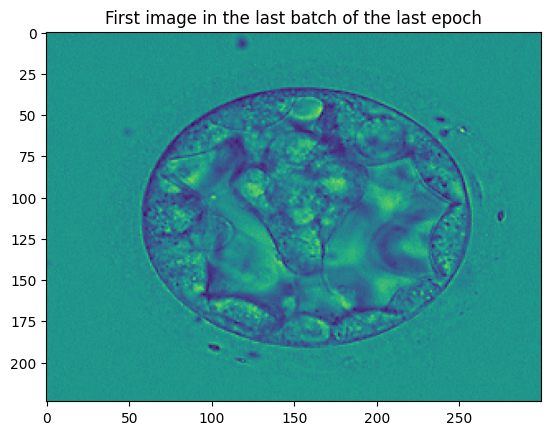

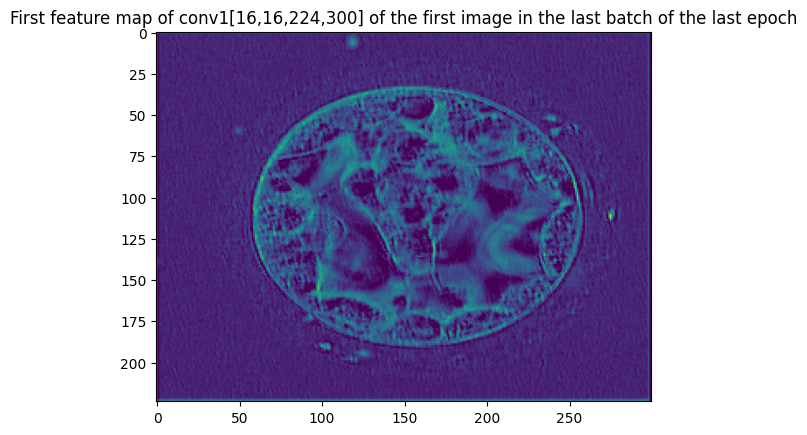

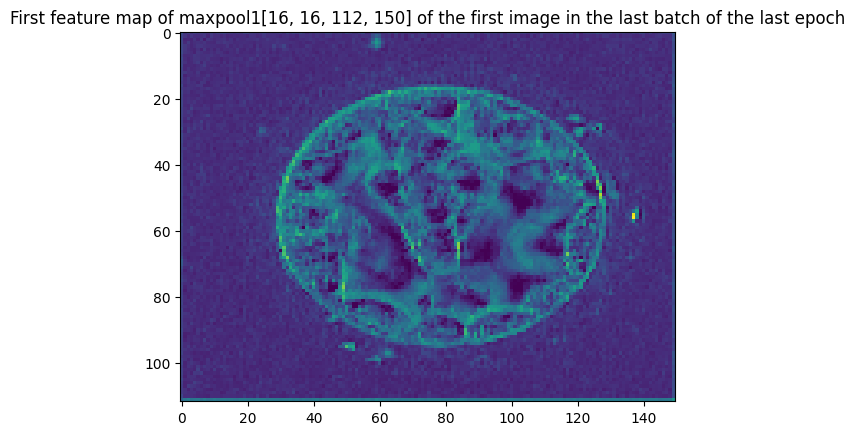

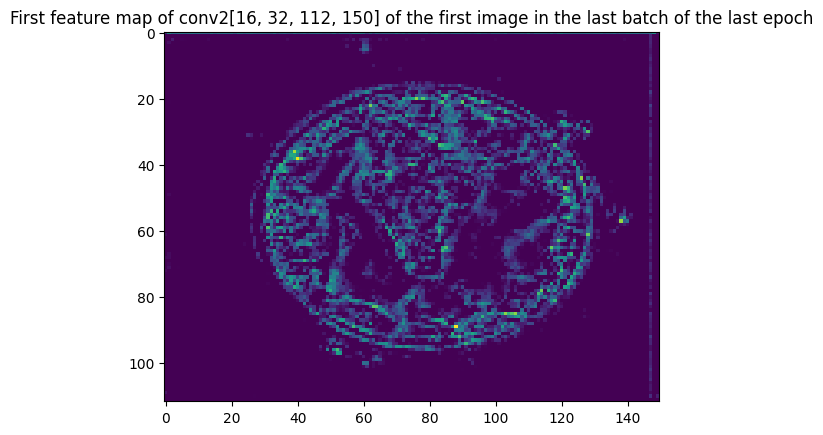

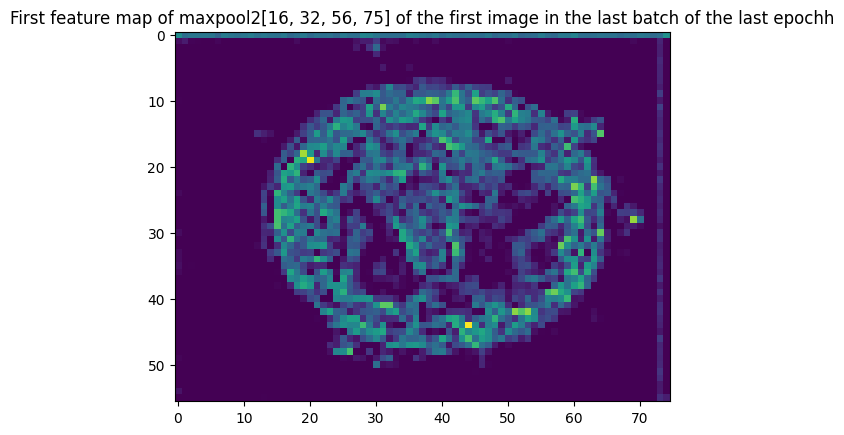

...

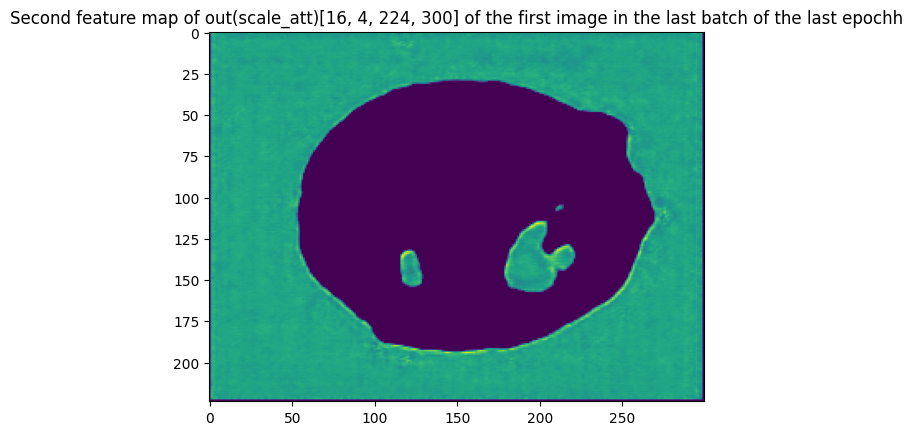

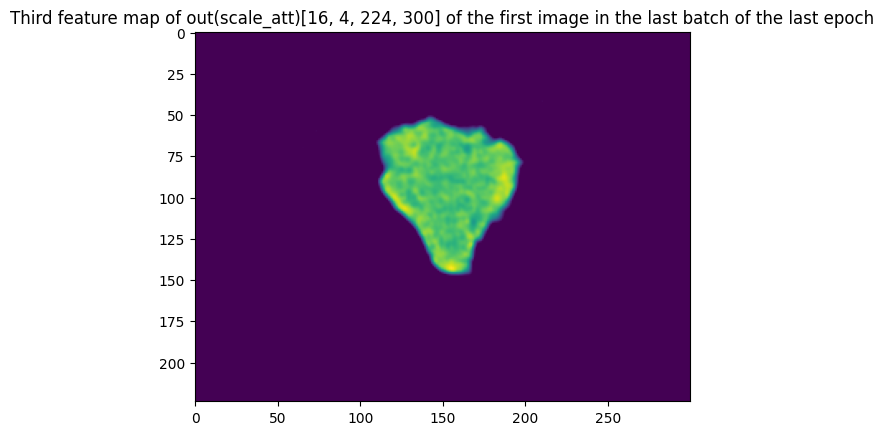

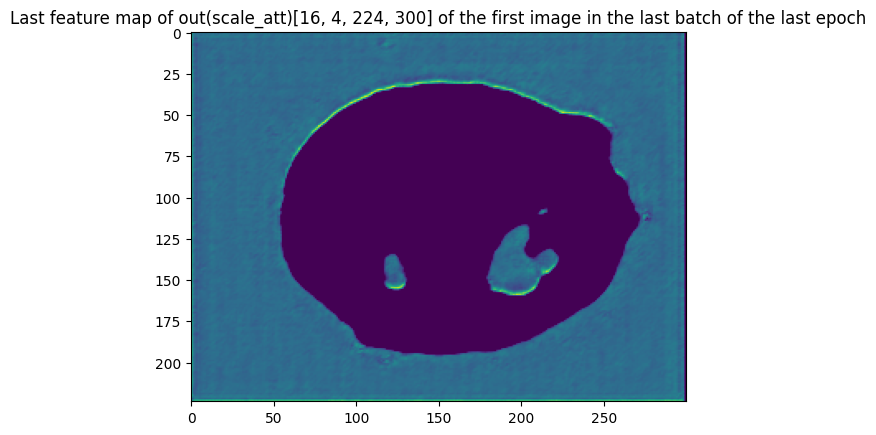

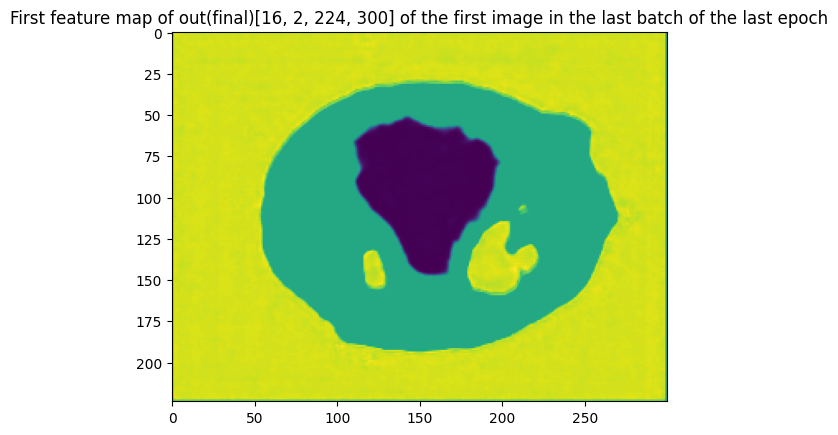

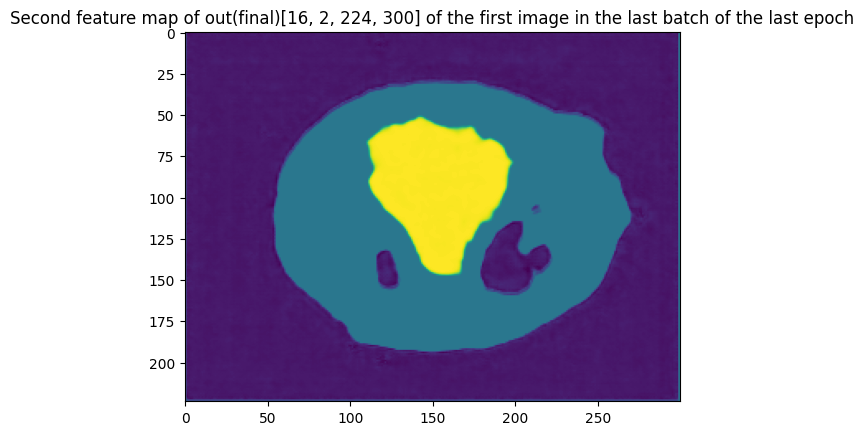

In [14]:
plt.imshow(np.squeeze(inputs[0].detach().cpu().numpy()))
plt.title("First image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(conv1[0][0].detach().cpu().numpy())
plt.title("First feature map of conv1[16,16,224,300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(maxpool1[0][0].detach().cpu().numpy())
plt.title("First feature map of maxpool1[16, 16, 112, 150] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(conv2[0][0].detach().cpu().numpy())
plt.title("First feature map of conv2[16, 32, 112, 150] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(maxpool2[0][0].detach().cpu().numpy())
plt.title("First feature map of maxpool2[16, 32, 56, 75] of the first image in the last batch of the last epochh")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(conv3[0][0].detach().cpu().numpy())
plt.title("First feature map of conv3[16, 64, 56, 75] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(maxpool3[0][0].detach().cpu().numpy())
plt.title("First feature map of maxpool3[16, 64, 28, 37] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(conv4[0][0].detach().cpu().numpy())
plt.title("First feature map of conv4[16, 128, 28, 37] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(maxpool4[0][0].detach().cpu().numpy())
plt.title("First feature map of maxpool4[16, 128, 14, 18] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(center[0][0].detach().cpu().numpy())
plt.title("First feature map of center[16, 256, 14, 18] of the first image in the last batch of the last epoch")
plt.show()
#-------------------------------------------------------------------------------------------#
plt.imshow(up_concat4[0][0].detach().cpu().numpy())
plt.title("First feature map of up4(up_concat4)[16, 256, 28, 37] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(g_conv4[0][0].detach().cpu().numpy())
plt.title("First feature map of g_conv4[16, 256, 28, 37] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(up4[0][0].detach().cpu().numpy())
plt.title("First feature map of up4(up4)[16, 128, 28, 37] of the first image in the last batch of the last epoch")
plt.show()
#-------------------------------------------------------------------------------------------#
plt.imshow(g_conv3[0][0].detach().cpu().numpy())
plt.title("First feature map of g_conv3[16, 64, 56, 75] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(atten3_map[0][0])
plt.title("First feature map of atten3_map(16, 2, 224, 300) of the first image in the last batch of the last epoch")
plt.show()
plt.imshow(atten3_map[0][1])
plt.title("Second feature map of atten3_map(16, 2, 224, 300) of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(up_concat3[0][0].detach().cpu().numpy())
plt.title("First feature map of up3(up_concat3)[16, 128, 56, 75] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(up3[0][0].detach().cpu().numpy())
plt.title("First feature map of up3(up3)[16, 64, 56, 75] of the first image in the last batch of the last epoch")
plt.show()
#-------------------------------------------------------------------------------------------#
plt.imshow(g_conv2[0][0].detach().cpu().numpy())
plt.title("First feature map of g_conv2[16, 32, 112, 150] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(atten2_map[0][0])
plt.title("First feature map of atten2_map(16, 2, 224, 300) of the first image in the last batch of the last epoch")
plt.show()
plt.imshow(atten2_map[0][1])
plt.title("Second feature map of atten2_map(16, 2, 224, 300) of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(up_concat2[0][0].detach().cpu().numpy())
plt.title("First feature map of up2(up_concat2)[16, 64, 112, 150] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(up2[0][0].detach().cpu().numpy())
plt.title("First feature map of up2(up2)[16, 32, 112, 150] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(g_conv1[0][0].detach().cpu().numpy())
plt.title("First feature map of g_conv1[16, 16, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(atten1_map[0][0])
plt.title("THE feature map of atten1_map(16, 1, 224, 300) of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(up_concat1[0][0].detach().cpu().numpy())
plt.title("First feature map of up1(up_concat1)16, 32, 224, 300] of the first image in the last batch of the last epochh")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(up1[0][0].detach().cpu().numpy())
plt.title("First feature map of up1(up1)[16, 16, 224, 300] of the first image in the last batch of the last epochh")
plt.show()
#-------------------------------------------------------------------------------------------#
plt.imshow(dsv4[0][0].detach().cpu().numpy())
plt.title("First feature map of dsv4[16, 4, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(dsv3[0][0].detach().cpu().numpy())
plt.title("First feature map of dsv3[16, 4, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(dsv2[0][0].detach().cpu().numpy())
plt.title("First feature map of dsv2[16, 4, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(dsv1[0][0].detach().cpu().numpy())
plt.title("First feature map of dsv1[16, 4, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(dsv_cat[0][0].detach().cpu().numpy())
plt.title("First feature map of dsv_cat[16, 16, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(out_scale_att[0][0].detach().cpu().numpy())
plt.title("First feature map of out(scale_att)[16, 4, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
plt.imshow(out_scale_att[0][1].detach().cpu().numpy())
plt.title("Second feature map of out(scale_att)[16, 4, 224, 300] of the first image in the last batch of the last epochh")
plt.show()
plt.imshow(out_scale_att[0][2].detach().cpu().numpy())
plt.title("Third feature map of out(scale_att)[16, 4, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
plt.imshow(out_scale_att[0][3].detach().cpu().numpy())
plt.title("Last feature map of out(scale_att)[16, 4, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
#--------------------------------------------------------------------------------------#
plt.imshow(out[0][0].detach().cpu().numpy())
plt.title("First feature map of out(final)[16, 2, 224, 300] of the first image in the last batch of the last epoch")
plt.show()
plt.imshow(out[0][1].detach().cpu().numpy())
plt.title("Second feature map of out(final)[16, 2, 224, 300] of the first image in the last batch of the last epoch")
plt.show()

In [16]:
import os
import torch
import argparse
import numpy as np
import torch.utils.data as Data
from utils.binary import assd as assd_fct
from distutils.version import LooseVersion
from Models.networks.network import Comprehensive_Atten_Unet


from utils.dice_loss import get_soft_label, val_dice_isic
from utils.dice_loss import Intersection_over_Union_isic

from time import time as time_module




def test_fct(test_loader, modelfilename):
    dice = []
    iou = []
    assd = []
    infer_time = []= []
    #-----------------------------------------------------------------------------------------------#
    #-----------------------------------------------------------------------------------------------#
    # Load the trained best model
    if os.path.isfile(modelfilename):
        print("=> Loading checkpoint '{}'".format(modelfilename))
        checkpoint = torch.load(modelfilename)
        print("=> Loaded the saved model")
    else:
        print("=> No checkpoint found at '{}'".format(modelfilename))
    #-----------------------------------------------------------------------------------------------#
    #model = Comprehensive_Atten_Unet(args=None)
    #checkpoint = torch.load(modelfilename)
    #model.load_state_dict(checkpoint)
    model.eval()
    
    for step, (img, lab) in enumerate(test_loader):
        image = img.float().cuda()
        target = lab.float().cuda()

        inputs,out,out_scale_att,atten3_map,atten2_map,atten1_map,dsv_cat,dsv4,dsv3,dsv2,dsv1, g_conv4, g_conv3, g_conv2, g_conv1,up4, up3, up2, up1,up_concat4, up_concat3, up_concat2, up_concat1, center, maxpool4, maxpool3, maxpool2, maxpool1, conv4, conv3, conv2, conv1 = model(image)  # model output
        begin_time = time_module()
        output = out
        end_time = time_module()
        pred_time = end_time - begin_time
        infer_time.append(pred_time)
        output_dis = torch.max(output, 1)[1].unsqueeze(dim=1) #changed output to output[0]
       
        output_soft = get_soft_label(output_dis, args.num_classes)
        target_soft = get_soft_label(target, args.num_classes)  # get soft label

        # input_arr = np.squeeze(image.cpu().numpy()).astype(np.float32)
        label_arr = target_soft.cpu().numpy().astype(np.uint8)
        # label_shw = np.squeeze(target.cpu().numpy()).astype(np.uint8)
        output_arr = output_soft.cpu().byte().numpy().astype(np.uint8)

        b_dice = val_dice_isic(output_soft, target_soft, args.num_classes)  # the dice accuracy
        b_iou = Intersection_over_Union_isic(output_soft, target_soft, args.num_classes)  # the iou accuracy
        b_asd = assd_fct(output_arr[:, :, :, 1], label_arr[:, :, :, 1])

        dice_np = b_dice.data.cpu().numpy()
        iou_np = b_iou.data.cpu().numpy()
        dice.append(dice_np)
        iou.append(iou_np)
        assd.append(b_asd)

    # df = pd.DataFrame(data=dice_np)
    # df.to_csv(args.ckpt + '/refine_result.csv')
    dice_mean = np.average(dice)
    dice_std = np.std(dice)

    iou_mean = np.average(iou)
    iou_std = np.std(iou)

    assd_mean = np.average(assd)
    assd_std = np.std(assd)

    all_time = np.sum(infer_time)
    print('The Public Dataset mean Dice: {dice_mean: .4f}; The Public Dataset Dice/Accuracy std: {dice_std: .4f}'.format(
        dice_mean=dice_mean, dice_std=dice_std))
    print('The Public Dataset mean IoU: {iou_mean: .4f}; The Public Dataset IoU std: {iou_std: .4f}'.format(
        iou_mean=iou_mean, iou_std=iou_std))
    print('The Public Dataset mean assd: {asd_mean: .4f}; The Public Dataset assd std: {asd_std: .4f}'.format(
        asd_mean=assd_mean, asd_std=assd_std))
    print('The inference time: {time: .4f}'.format(time=all_time))

In [18]:
testset = Public_dataset(dataset_folder=npy_data_dir,  train_type='test',
                                      transform=None)
                                      #transform=Test_Transform['ISIC2018Transform'])
testloader = Data.DataLoader(dataset=testset, batch_size=16, shuffle=False, pin_memory=True)
test_fct(testloader, 'C:/Users/Dell/Desktop/pfa/my_saved_models_ICM_final/PublicDataICM/CA_Net_On_ICM_epoch_100.pth')

=> Loading checkpoint 'C:/Users/Dell/Desktop/pfa/my_saved_models_ICM_final/PublicDataICM/CA_Net_On_ICM_epoch_100.pth'
=> Loaded the saved model
Batch number :  1303
Batch number :  1304
The Public Dataset mean Dice:  0.9009; The Public Dataset Dice/Accuracy std:  0.0124
The Public Dataset mean IoU:  0.8309; The Public Dataset IoU std:  0.0180
The Public Dataset mean assd:  0.8848; The Public Dataset assd std:  0.3339
The inference time:  0.0010
